In [1]:
import os
import sys
import random
import time
from random import seed, randint
import argparse
import platform
from datetime import datetime
import imp
import numpy as np
import fileinput
from itertools import product
import pandas as pd
from scipy.interpolate import griddata
from scipy.interpolate import interp2d
import seaborn as sns
from os import listdir

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import griddata
import matplotlib as mpl
# sys.path.insert(0,'..')
# from notebookFunctions import *
# from .. import notebookFunctions
from Bio.PDB.Polypeptide import one_to_three
from Bio.PDB.Polypeptide import three_to_one
from Bio.PDB.PDBParser import PDBParser
from pyCodeLib import *
from small_script.myFunctions import *
sys.path.insert(0, "/Users/weilu/openmmawsem")
from helperFunctions.myFunctions import *
from collections import defaultdict
%matplotlib inline
# plt.rcParams['figure.figsize'] = (10,6.180)    #golden ratio
# %matplotlib notebook
%load_ext autoreload
%autoreload 2

In [2]:
plt.rcParams['figure.figsize'] = np.array([16.18033, 10])    #golden ratio
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['figure.dpi'] = 100
plt.rcParams.update({'font.size': 22})

In [3]:
os.chdir('/Users/weilu/opt/notebook/Optimization')

/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag//saved_gammas/iteration_11_frag_cutoff400_impose_Aprime_constraint
0 33.9674152960947
/Users/weilu/Research/data/optimization_2020_iteration_11_frag_400_iteration_11_frag.csv
mean 8.142941660867123
std 8.61029478601585


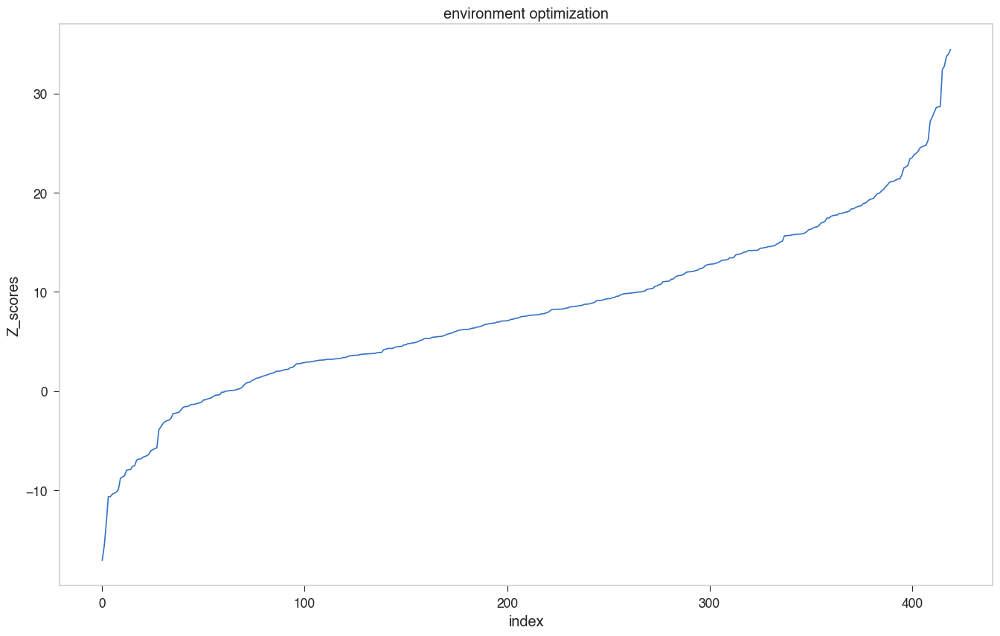

In [69]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_11_frag"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/Research/server//may_week3_2020/cath_dataset_shuffle_optimization/optimization_iter0_shift_centers/saved_gammas/optimization_iter0_shift_centers_cutoff400_impose_Aprime_constraint"
# gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [71]:
data.query("Protein=='2acy_run2_frag_cbd_shift_center_iter7_1'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
12,12,2acy_run2_frag_cbd_shift_center_iter7_1,-7.986655,-288.998112,-334.691743,5.721247


In [64]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1akr_run2_frag_cbd_shift_center_iter7_1,-17.053254,-429.968051,-556.307638,7.408532
1,1,1akr_run2_frag_cbd_shift_center_iter7_0,-15.602743,-429.968051,-536.314950,6.815910
2,2,1akr_run2_frag_cbd_shift_center_iter7_2,-13.338447,-429.968051,-532.229590,7.666675
3,3,5nul_run2_frag_cbd_shift_center_iter7_3,-10.652000,-330.336955,-403.976843,6.913245
4,4,1opd_run2_frag_cbd_shift_center_iter7_1,-10.644639,-172.019352,-232.044474,5.639000


/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag//saved_gammas/iteration_11_frag_zBias_1_cutoff400_impose_Aprime_constraint
0 24.469035603097904
/Users/weilu/Research/data/optimization_2020_iteration_11_frag_zBias_1_400_iteration_11_frag_zBias_1.csv
mean 7.978259250952513
std 5.1871566907906015


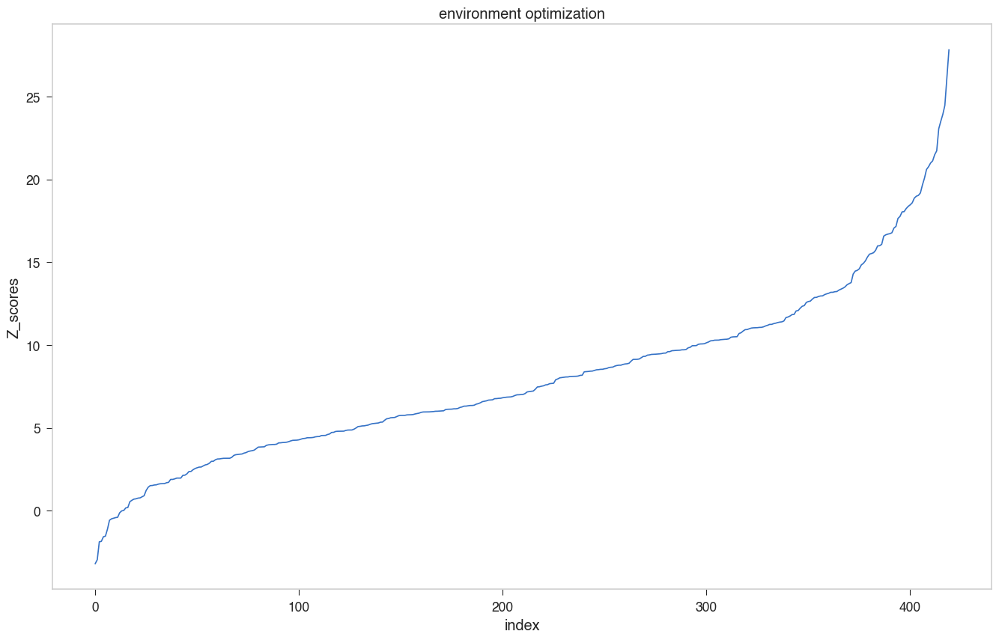

In [65]:

cutoff = 400
pre = "/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_11_frag_zBias_1"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/Research/server//may_week3_2020/cath_dataset_shuffle_optimization/optimization_iter0_shift_centers/saved_gammas/optimization_iter0_shift_centers_cutoff400_impose_Aprime_constraint"
# gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [68]:
data_zbias1 = data

In [66]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,2acy_run2_frag_cbd_shift_center_iter7_0,-3.186725,-232.015672,-251.342444,6.064777
1,1,2acy_run2_frag_cbd_shift_center_iter7_2,-2.946846,-232.015672,-249.463050,5.920695
2,2,2acy_run2_frag_cbd_shift_center_iter7_1,-1.866996,-232.015672,-241.156549,4.896034
3,3,1ptf_run2_frag_cbd_shift_center_iter10_include...,-1.842207,-191.945923,-199.885217,4.309664
4,4,1tmy_run2_frag_cbd_shift_center_iter7_2,-1.564770,-249.482555,-258.508855,5.768451


In [67]:
data.query("Protein=='1akr_run2_frag_cbd_shift_center_iter7_1'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
68,68,1akr_run2_frag_cbd_shift_center_iter7_1,3.345318,-396.580478,-376.291041,6.065025


/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag//saved_gammas/iteration_11_frag_zBias_2_cutoff400_impose_Aprime_constraint
0 17.533299711562844
/Users/weilu/Research/data/optimization_2020_iteration_11_frag_zBias_2_400_iteration_11_frag_zBias_2.csv
mean 7.892932646180773
std 3.9774884640508215


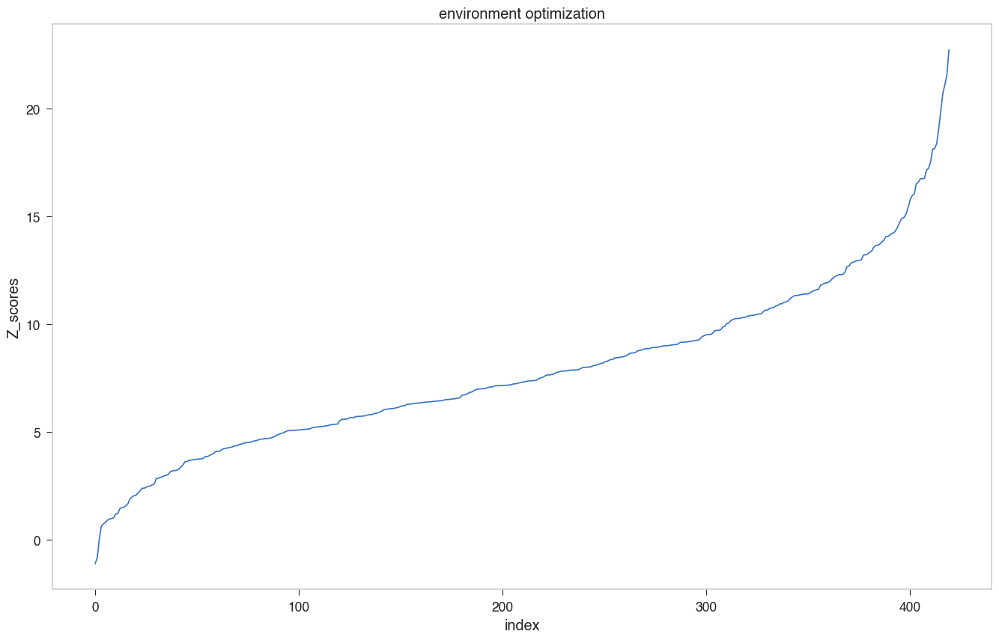

In [72]:

cutoff = 400
pre = "/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_11_frag_zBias_2"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/Research/server//may_week3_2020/cath_dataset_shuffle_optimization/optimization_iter0_shift_centers/saved_gammas/optimization_iter0_shift_centers_cutoff400_impose_Aprime_constraint"
# gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [73]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1ptf_run2_frag_cbd_shift_center_iter10_include...,-1.095774,-202.158109,-206.516061,3.977053
1,1,1tig_run2_frag_cbd_shift_center_iter9_4,-0.809267,-177.045862,-181.500219,5.504183
2,2,1tig_run2_frag_cbd_shift_center_iter8_1,0.044614,-177.045862,-176.822952,4.996473
3,3,2acy_run2_frag_cbd_shift_center_iter9_2,0.650784,-206.970758,-203.594447,5.188069
4,4,2acy_run2_frag_cbd_shift_center_iter8_0,0.747329,-206.970758,-203.328133,4.874191


/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag//saved_gammas/iteration_11_frag_zBias_1_cutoff400_impose_Aprime_constraint
0 12.706400959799142
/Users/weilu/Research/data/optimization_2020_iteration_11_frag_zBias_1_400_iteration_11_frag_zBias_1.csv
mean 7.104726384516306
std 6.285774488055892


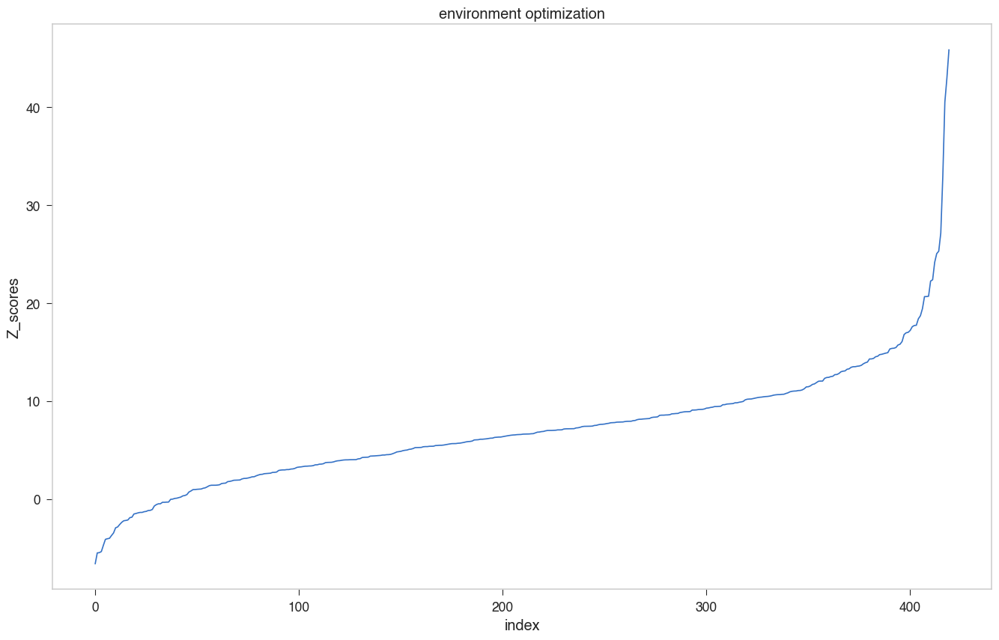

In [55]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_11_frag_zBias_1"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/Research/server//may_week3_2020/cath_dataset_shuffle_optimization/optimization_iter0_shift_centers/saved_gammas/optimization_iter0_shift_centers_cutoff400_impose_Aprime_constraint"
# gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [59]:
data.query("Protein=='1akr_run2_frag_cbd_shift_center_iter7_1'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
418,418,1akr_run2_frag_cbd_shift_center_iter7_1,42.958385,-373.789788,-164.804329,4.864835


In [60]:
data.query("Protein=='5nul_run2_frag_cbd_shift_center_iter7_3'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
408,408,5nul_run2_frag_cbd_shift_center_iter7_3,20.675673,-369.433666,-257.402217,5.418515


In [56]:
data.head(20)

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,2acy_run2_frag_cbd_shift_center_iter8_0,-6.581997,-174.948209,-210.633565,5.421661
1,1,2acy_run2_frag_cbd_shift_center_iter9_2,-5.485256,-174.948209,-204.315545,5.353868
2,2,1tig_run2_frag_cbd_shift_center_iter8_1,-5.458254,-158.744432,-189.924003,5.712370
3,3,1tig_run2_frag_cbd_shift_center_iter8_4,-5.347464,-158.744432,-186.207743,5.135763
4,4,1tig_run2_frag_cbd_shift_center_iter9_4,-4.705053,-158.744432,-189.410095,6.517602
5,5,2acy_run2_frag_cbd_shift_center_iter8_3,-4.098792,-174.948209,-196.619036,5.287125
6,6,2acy_run2_frag_cbd_shift_center_iter10_include...,-4.037255,-174.948209,-196.555107,5.351879
7,7,1tig_run2_frag_cbd_shift_center_iter9_3,-3.993288,-158.744432,-179.589015,5.219904
8,8,2acy_run2_frag_cbd_shift_center_iter9_0,-3.707054,-174.948209,-194.538946,5.284719
9,9,1tig_run2_frag_cbd_shift_center_iter5_4,-3.445598,-158.744432,-182.327068,6.844279


/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag//saved_gammas/iteration_11_frag_zBias_2_cutoff400_impose_Aprime_constraint
0 21.425981464922152
/Users/weilu/Research/data/optimization_2020_iteration_11_frag_zBias_2_400_iteration_11_frag_zBias_2.csv
mean 8.539887839008017
std 7.827664923105907


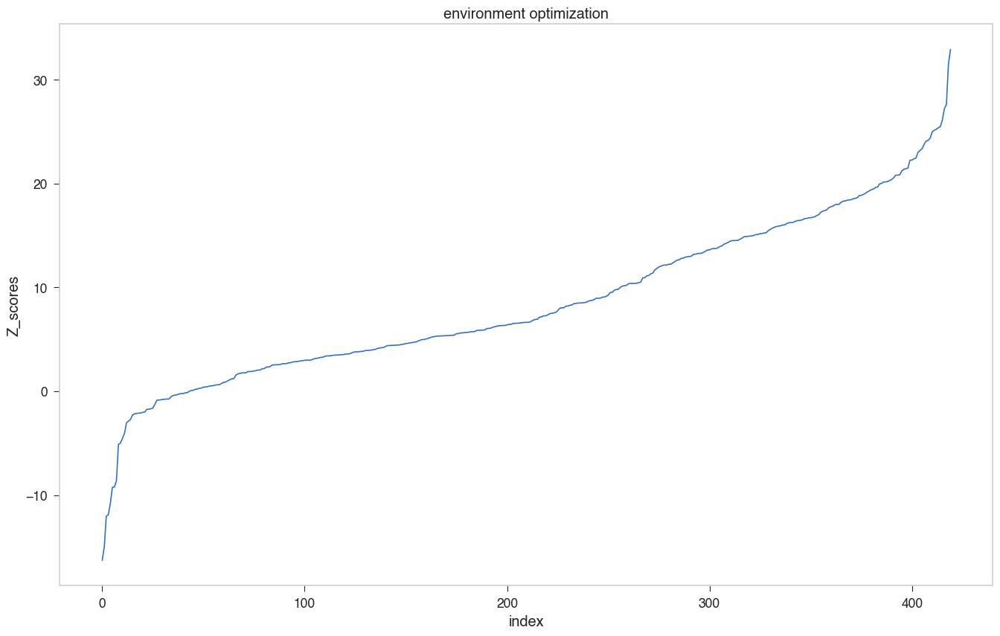

In [49]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_11_frag_zBias_2"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/Research/server//may_week3_2020/cath_dataset_shuffle_optimization/optimization_iter0_shift_centers/saved_gammas/optimization_iter0_shift_centers_cutoff400_impose_Aprime_constraint"
# gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag//saved_gammas/iteration_11_frag_zBias_2_cutoff400_impose_Aprime_constraint
0 25.19940344358773
/Users/weilu/Research/data/optimization_2020_iteration_11_frag_zBias_2_400_iteration_11_frag_zBias_2.csv
mean 7.975653584618949
std 5.564571581760455


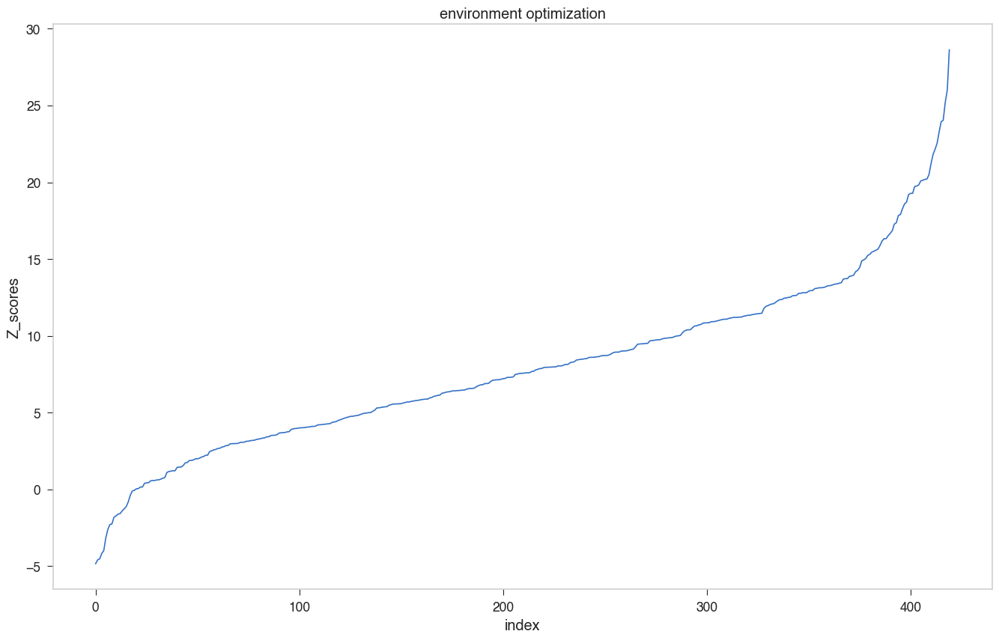

In [37]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week3_2020/small_frag_optimization/iteration_11_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_11_frag_zBias_2"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/Research/server//may_week3_2020/cath_dataset_shuffle_optimization/optimization_iter0_shift_centers/saved_gammas/optimization_iter0_shift_centers_cutoff400_impose_Aprime_constraint"
# gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server//may_week2_2020/cath_dataset_shuffle_optimization/optimization_iter0_shift_centers/saved_gammas/optimization_iter0_shift_centers_cutoff400_impose_Aprime_constraint
0 -18.120199341408863
/Users/weilu/Research/data/optimization_2020_iteration_10_frag_zBias_2_400_iteration_10_frag_zBias_2.csv
mean 1.2475909692175082
std 8.846680157390528


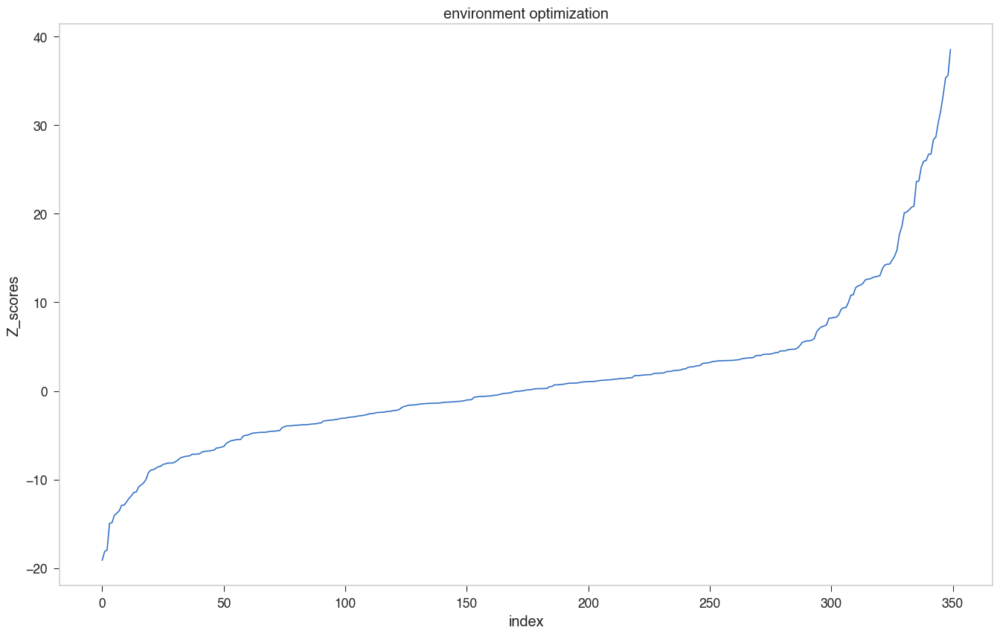

In [35]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_10_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_10_frag_zBias_2"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = "/Users/weilu/Research/server//may_week2_2020/cath_dataset_shuffle_optimization/optimization_iter0_shift_centers/saved_gammas/optimization_iter0_shift_centers_cutoff400_impose_Aprime_constraint"
# gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_10_frag//saved_gammas/iteration_10_frag_zBias_1_cutoff400_impose_Aprime_constraint
0 22.623769563755907
/Users/weilu/Research/data/optimization_2020_iteration_10_frag_zBias_1_400_iteration_10_frag_zBias_1.csv
mean 8.1686050479279
std 5.209364131318496


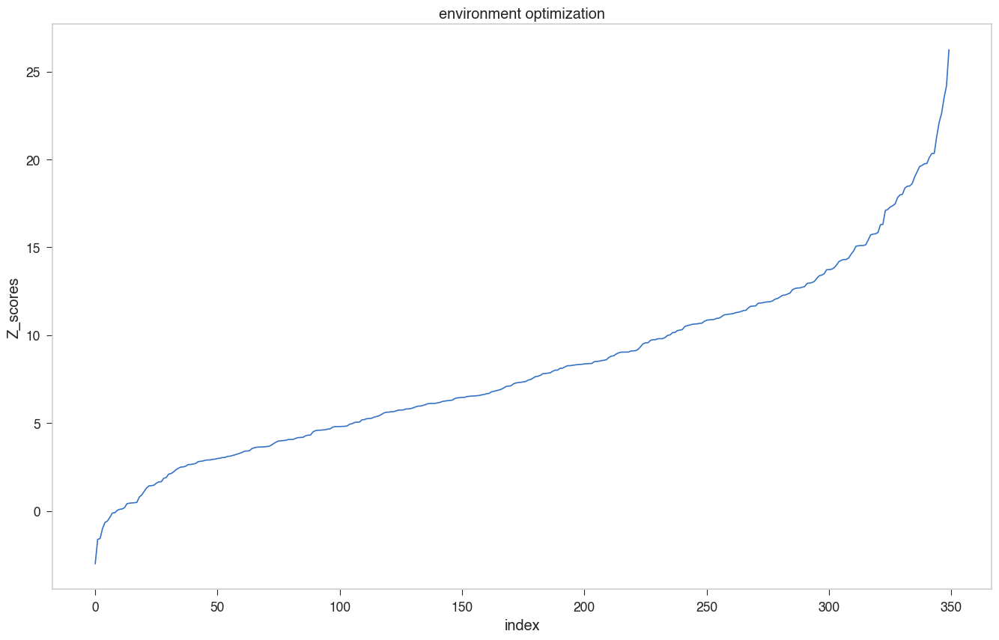

In [33]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_10_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_10_frag_zBias_1"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_10_frag//saved_gammas/iteration_10_frag_cutoff400_impose_Aprime_constraint
0 27.412271457831544
/Users/weilu/Research/data/optimization_2020_iteration_10_frag_400_iteration_10_frag.csv
mean 8.19799881748019
std 6.652939578207888


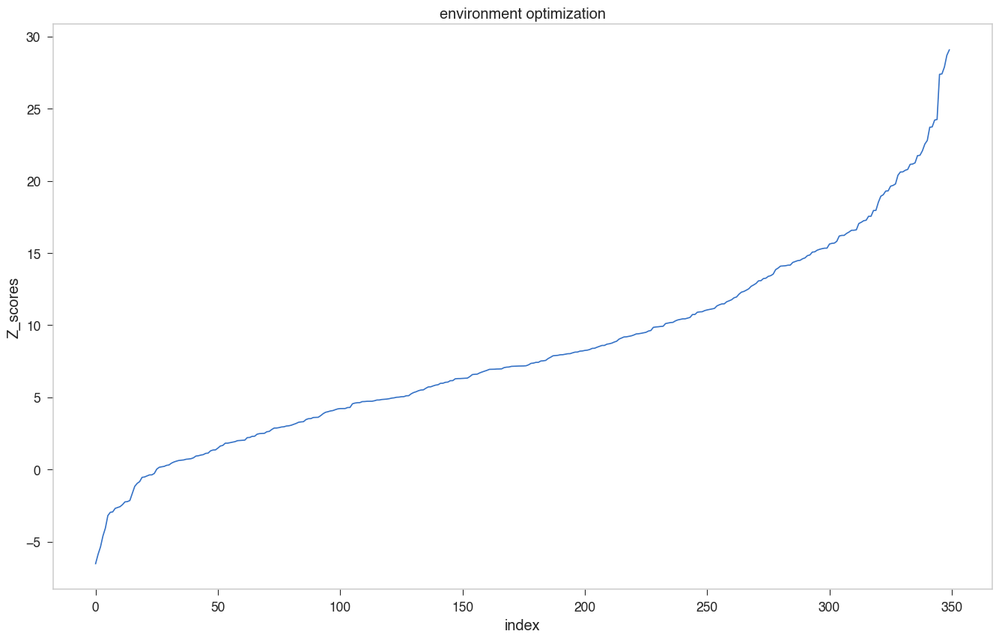

In [30]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_10_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_10_frag"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [31]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1akr_run2_frag_cbd_shift_center_iter7_0,-6.524423,-413.998297,-454.247753,6.169045
1,1,1akr_run2_frag_cbd_shift_center_iter7_1,-5.883406,-413.998297,-456.994162,7.307989
2,2,1opd_run2_frag_cbd_shift_center_iter7_1,-5.360411,-180.809832,-210.147836,5.473088
3,3,1opd_run2_frag_cbd_shift_center_iter7_3,-4.604166,-180.809832,-204.577171,5.162138
4,4,2acy_run2_frag_cbd_shift_center_iter7_0,-4.058403,-259.910475,-286.225000,6.483960
5,5,1tmy_run2_frag_cbd_shift_center_iter7_1,-3.197257,-259.327670,-282.635949,7.290085
6,6,1tmy_run2_frag_cbd_shift_center_iter7_2,-2.967766,-259.327670,-278.607463,6.496399
7,7,1akr_run2_frag_cbd_shift_center_iter7_2,-2.936807,-413.998297,-434.565195,7.003150
8,8,1ptf_run2_frag_cbd_shift_center_iter7_0,-2.693714,-197.762032,-213.146593,5.711282
9,9,1ptf_run2_frag_cbd_shift_center_iter7_3,-2.631869,-197.762032,-216.108702,6.970967


/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_9_frag//saved_gammas/iteration_9_frag_cutoff400_impose_Aprime_constraint
0 29.131560848726043
/Users/weilu/Research/data/optimization_2020_iteration_9_frag_400_iteration_9_frag.csv
mean 8.668670431737313
std 6.4883333271619


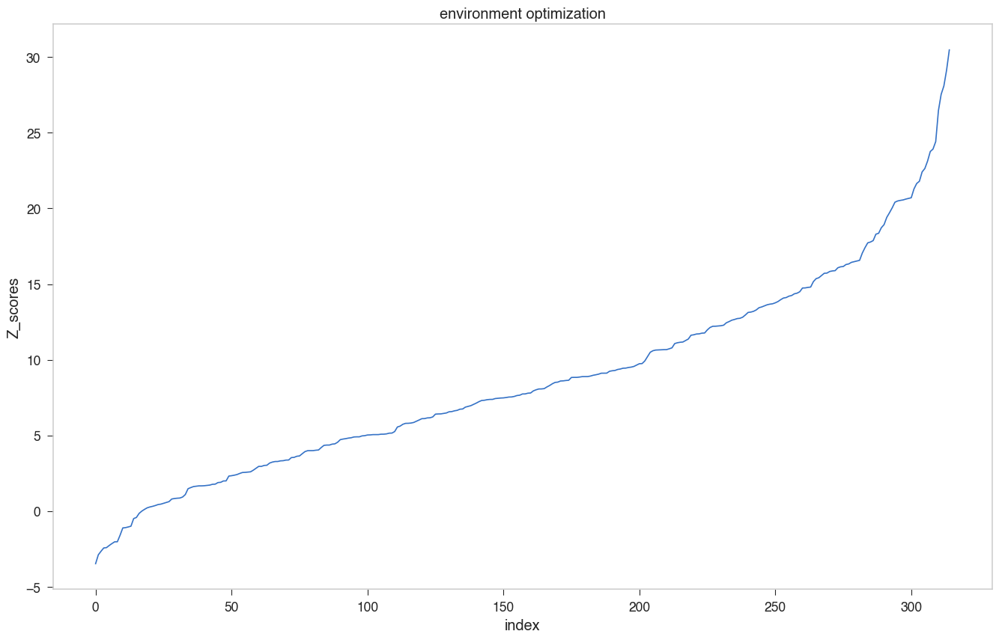

In [27]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_9_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_9_frag"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint
0 34.88012007827977
/Users/weilu/Research/data/optimization_2020_iteration_8_frag_400_iteration_8_frag.csv
mean 8.104899187290306
std 11.112229741098815


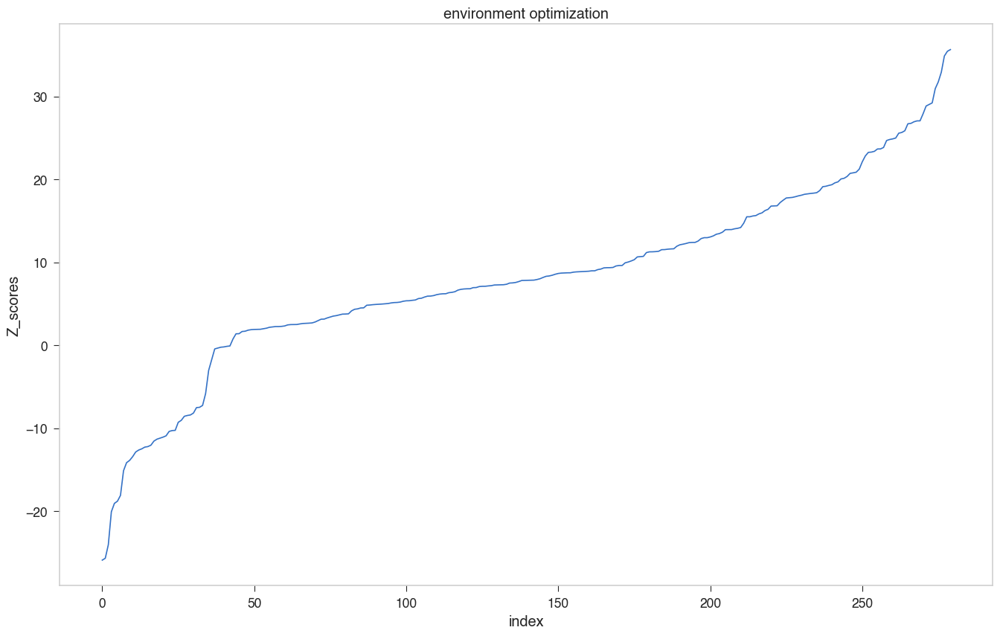

In [25]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_8_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_8_frag"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint
0 34.88012007827977
/Users/weilu/Research/data/optimization_2020_iteration_7_frag_400_iteration_7_frag.csv
mean 11.098839521025239
std 8.092937714040938


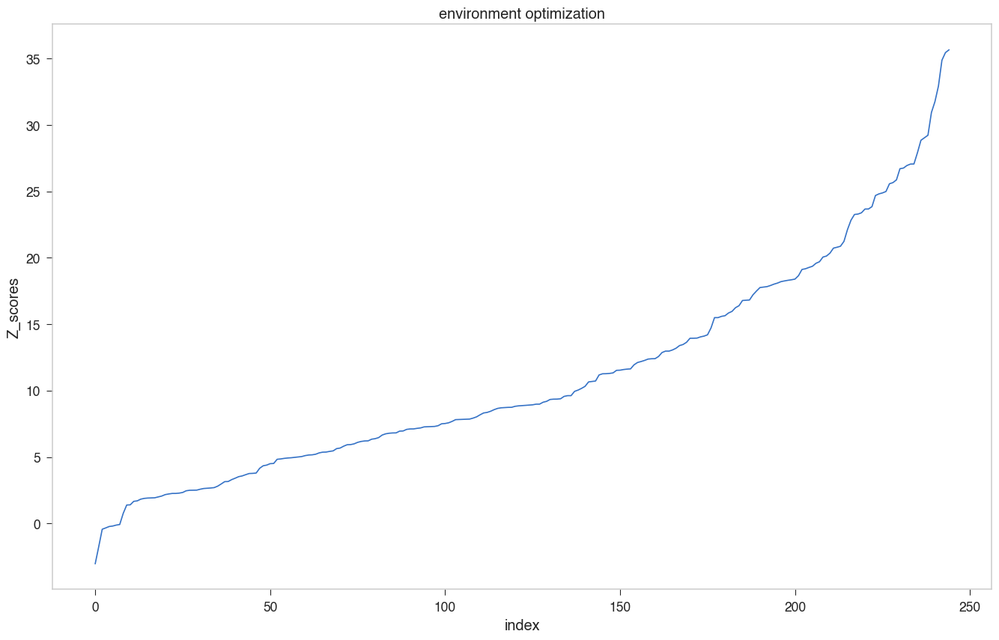

In [13]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_7_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_7_frag"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = '/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [16]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1opd_run2_frag_cbd_shift_center_iter1_0,-3.031392,-216.220433,-244.939811,9.473991
1,1,1opd_run2_frag_cbd_shift_center_iter4_3,-1.750543,-216.220433,-230.023386,7.884957
2,2,1opd_run2_frag_cbd_shift_center_iter5_0,-0.438243,-216.220433,-220.024713,8.680765
3,3,1opd_run2_frag_cbd_shift_center_iter5_1,-0.339332,-216.220433,-219.042604,8.316854
4,4,1tig_run2_frag_cbd_shift_center_iter1_1,-0.233030,-231.245216,-233.144018,8.148300


In [20]:
def extract_iter(s):
    return s.split("_")[-2]
data["iter"] = data["Protein"].apply(extract_iter)

/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint
0 34.88012007827977
/Users/weilu/Research/data/optimization_2020_iteration_6_frag_400_iteration_6_frag.csv
mean 11.745306252349058
std 8.432915975731456


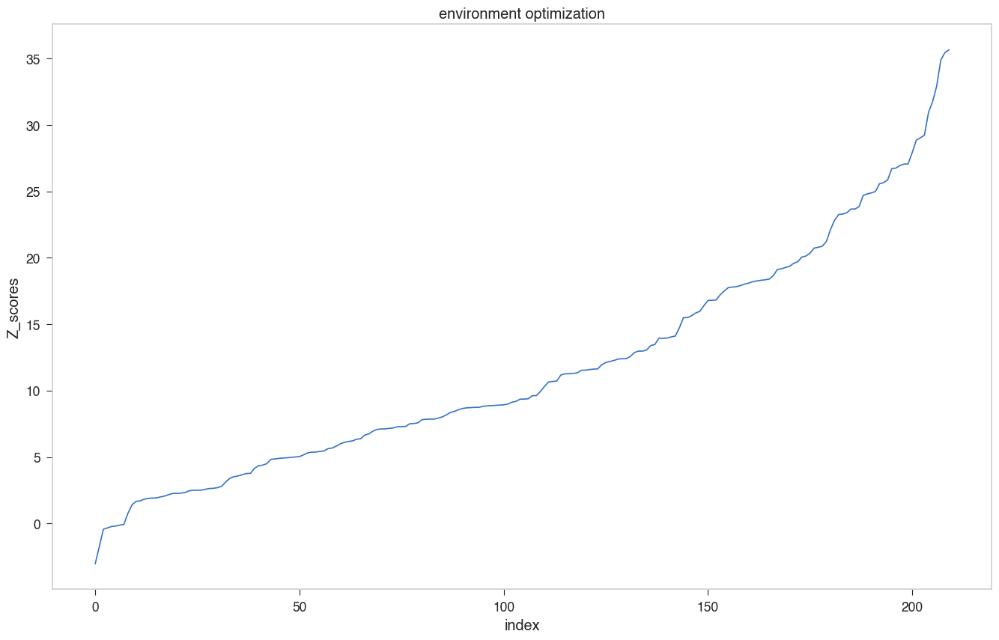

In [8]:


cutoff = 400
pre = "/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iteration_6_frag"
# trial_name = "iter4_environment"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [10]:
gamma_file_name

'/Users/weilu/Research/server/may_week2_2020/small_frag_optimization/iteration_6_frag//saved_gammas/iteration_6_frag_cutoff400_impose_Aprime_constraint'

In [9]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1opd_run2_frag_cbd_shift_center_iter1_0,-3.031392,-216.220433,-244.939811,9.473991
1,1,1opd_run2_frag_cbd_shift_center_iter4_3,-1.750543,-216.220433,-230.023386,7.884957
2,2,1opd_run2_frag_cbd_shift_center_iter5_0,-0.438243,-216.220433,-220.024713,8.680765
3,3,1opd_run2_frag_cbd_shift_center_iter5_1,-0.339332,-216.220433,-219.042604,8.316854
4,4,1tig_run2_frag_cbd_shift_center_iter1_1,-0.233030,-231.245216,-233.144018,8.148300
5,5,1tig_run2_frag_cbd_shift_center_iter1_4,-0.197868,-231.245216,-233.059415,9.168710
6,6,1opd_run2_frag_cbd_shift_center_iter3_1,-0.126778,-216.220433,-217.050430,6.546873
7,7,1opd_run2_frag_cbd_shift_center_iter1_3,-0.082838,-216.220433,-216.907514,8.294294
8,8,1ptf_run2_frag_cbd_shift_center_iter1_2,0.755505,-241.510196,-235.406384,8.079113
9,9,1tmy_run2_frag_cbd_shift_center_iter1_4,1.398553,-311.262799,-298.722647,8.966517


/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/new_iter5_environment//saved_gammas/new_iter5_environment_zBias_1_cutoff400_impose_Aprime_constraint
0 4.061009835045291
/Users/weilu/Research/data/optimization_2020_new_iter5_environment_zBias_1_400_new_iter5_environment_zBias_1.csv
mean 6.973895598900782
std 4.283271305087508


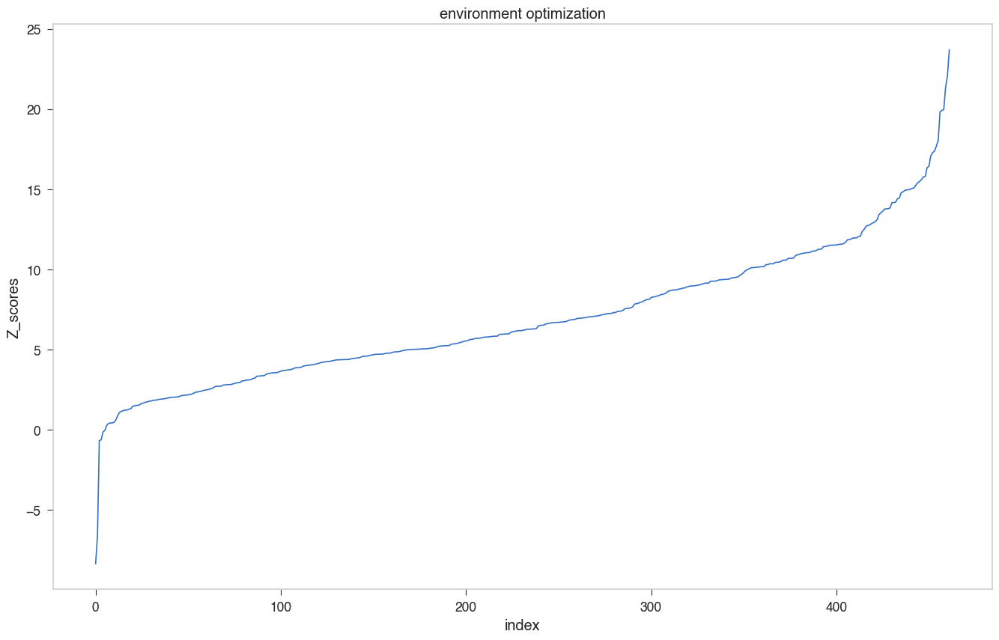

In [26]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/new_iter5_environment/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "new_iter5_environment_zBias_1"
# trial_name = "iter4_environment"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [25]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1cc5_iter0_environment_new,-7.355234,-41.828108,-137.644281,13.026938
1,1,1osa_new_iter1_environment_new,-2.380226,-58.428796,-69.295988,4.565613
2,2,1dun_iter0_environment_new,-1.134870,-80.577935,-87.174995,5.813053
3,3,1vcc_iter0_environment,-0.303353,-65.633591,-67.692868,6.788396
4,4,1cyo_iter0_environment,-0.260452,-64.688263,-66.385913,6.518085


/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/new_iter3_environment//saved_gammas/new_iter3_environment_zBias_1_cutoff400_impose_Aprime_constraint
0 4.010697045937299
/Users/weilu/Research/data/optimization_2020_new_iter3_environment_zBias_1_400_new_iter3_environment_zBias_1.csv
mean 7.298101907375812
std 4.6058297228553515


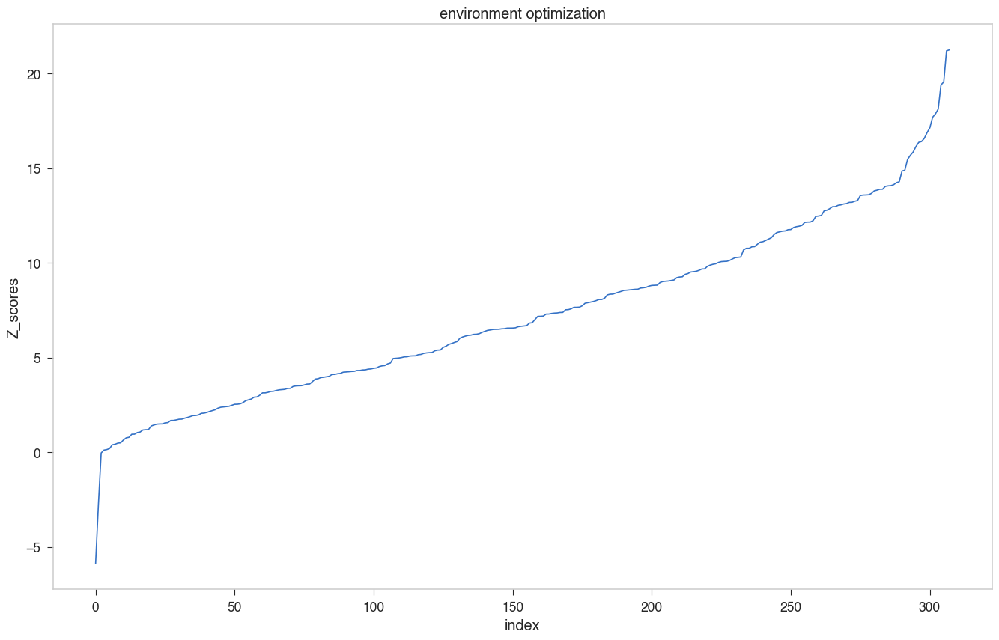

In [22]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/new_iter3_environment/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "new_iter3_environment_zBias_1"
# trial_name = "iter4_environment"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [23]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1cc5_iter0_environment_new,-5.879224,-39.957344,-113.608596,12.527375
1,1,1dun_iter0_environment_new,-2.785846,-82.405617,-97.401795,5.382988
2,2,5nul_iter0_environment_new,-0.035717,-108.880489,-109.072708,5.381650
3,3,1by9_iter0_environment,0.113688,-61.494441,-60.692737,7.051780
4,4,1vcc_iter0_environment,0.141178,-73.557013,-72.592301,6.833278
5,5,1fna_new_iter2_environment_new,0.194358,-67.342534,-66.095599,6.415664
6,6,1dun_iter0_environment,0.392990,-82.405617,-78.410224,10.166642
7,7,1akr_iter0_environment,0.422981,-154.262339,-145.485752,20.749349
8,8,1cyo_iter0_environment,0.481693,-64.616188,-61.488502,6.493113
9,9,1btn_iter0_environment,0.496937,-87.871304,-83.200343,9.399501


/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/new_iter2_environment//saved_gammas/new_iter2_environment_zBias_1_cutoff400_impose_Aprime_constraint
0 6.051189556377593
/Users/weilu/Research/data/optimization_2020_new_iter2_environment_zBias_1_400_new_iter2_environment_zBias_1.csv
mean 9.269685557934395
std 6.082075351358121


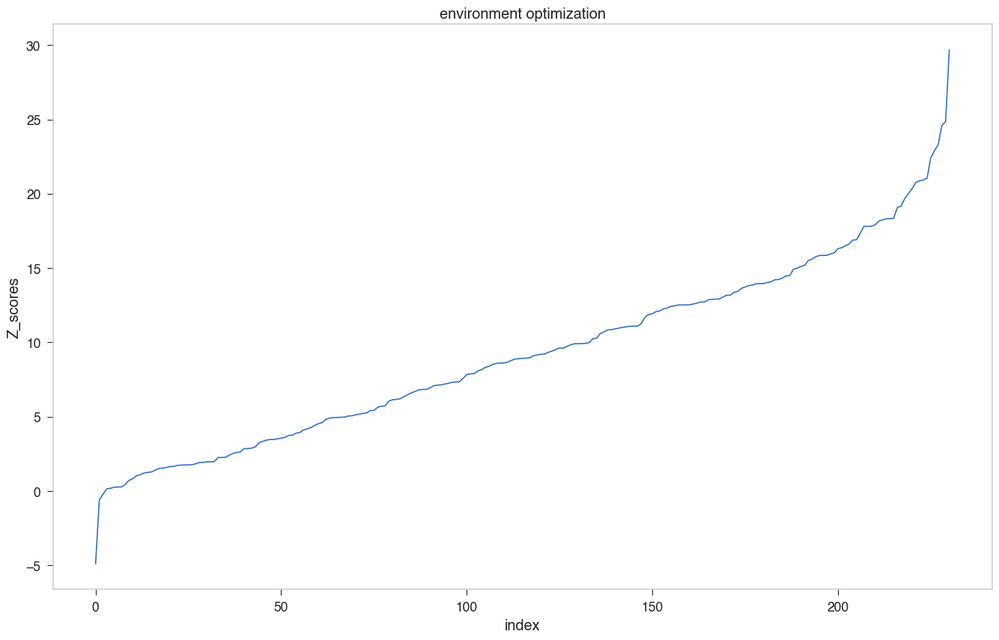

In [20]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/new_iter2_environment/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "new_iter2_environment_zBias_1"
# trial_name = "iter4_environment"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [21]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1cc5_iter0_environment_new,-4.883171,-62.849777,-125.099787,12.747866
1,1,1by9_iter0_environment,-0.589674,-59.363054,-64.039795,7.931067
2,2,1tig_iter0_environment,-0.206060,-84.839194,-86.692040,8.991770
3,3,1fna_iter0_environment,0.151151,-65.856547,-64.572645,8.494166
4,4,1vcc_iter0_environment,0.183601,-92.555835,-91.128596,7.773577
5,5,1btn_iter0_environment,0.261533,-114.600455,-111.487195,11.903906
6,6,1akr_iter0_environment,0.270734,-193.555221,-188.157244,19.938338
7,7,2sak_iter0_environment,0.281489,-103.120437,-98.345560,16.962930
8,8,1dun_iter0_environment,0.445071,-87.183252,-81.863135,11.953423
9,9,1cyo_iter0_environment,0.724705,-66.242004,-61.209873,6.943693


/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter4_environment//saved_gammas/iter4_environment_zBias_1_cutoff400_impose_Aprime_constraint
0 3.447261442401005
/Users/weilu/Research/data/optimization_2020_iter4_environment_zBias_1_400_iter4_environment_zBias_1.csv
mean 5.278530727320106
std 4.054380621092851


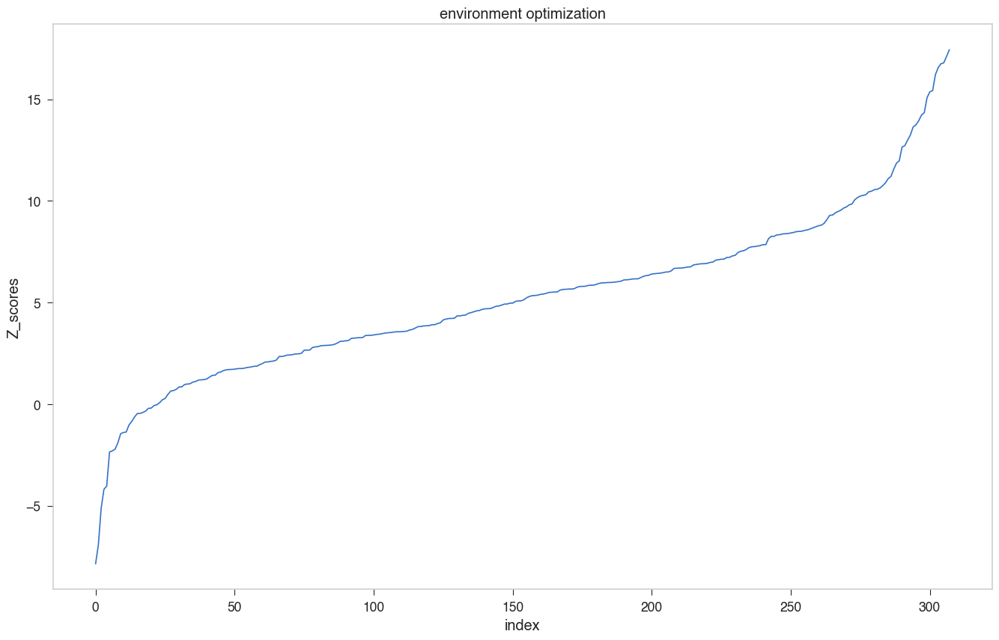

In [19]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter4_environment/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter4_environment_zBias_1"
# trial_name = "iter4_environment"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter3_environment//saved_gammas/iter3_environment_cutoff400_impose_Aprime_constraint
0 18.637215688289363
/Users/weilu/Research/data/optimization_2020_iter3_environment_400_iter3_environment.csv
mean 10.552758473450528
std 5.624777177826374


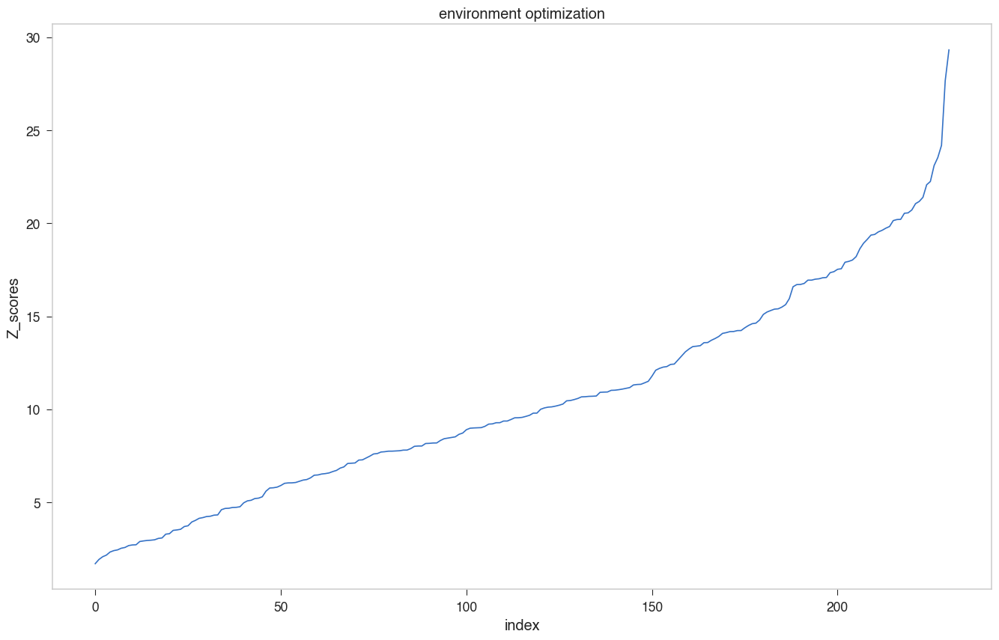

In [16]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter3_environment/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
# trial_name = "iter2_environment_zBias_1"
trial_name = "iter3_environment"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter2_environment//saved_gammas/iter2_environment_zBias_1_cutoff400_impose_Aprime_constraint
0 0.5083643775797365
/Users/weilu/Research/data/optimization_2020_iter2_environment_zBias_1_400_iter2_environment_zBias_1.csv
mean 1.826016081864286
std 2.751343105831047


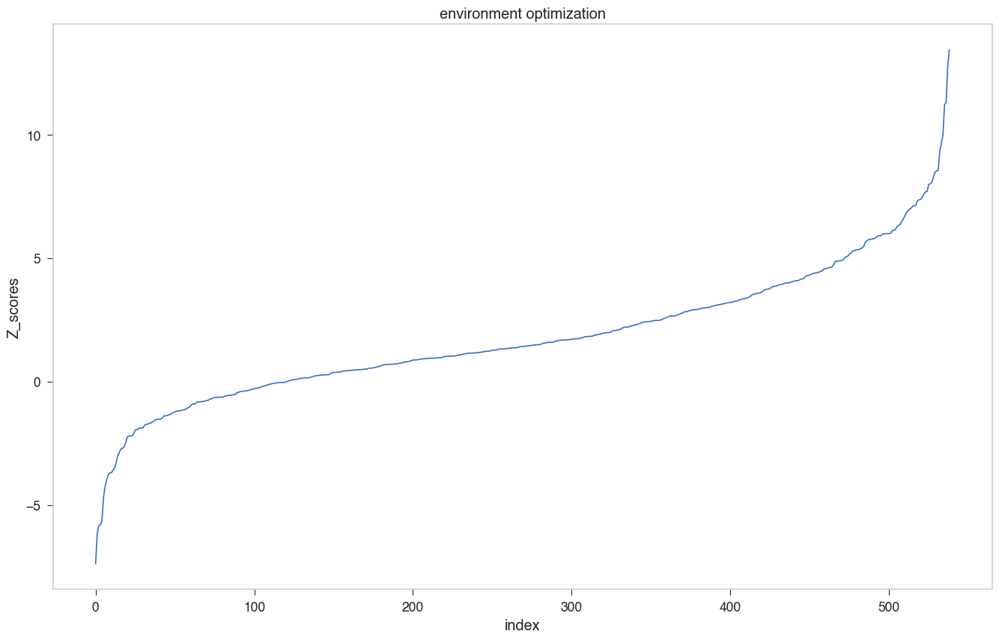

In [14]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter2_environment/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2_environment_zBias_1"
# trial_name = "iter2_environment"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [13]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1a32_iteration_1_stronger_exclude_withoutBuria...,-7.815785,-31.879235,-62.039232,3.858857
1,1,1ycc_iteration_2_bug_fixed,-6.073221,-92.813552,-123.496103,5.052105
2,2,1rss_iteration_1_stronger_exclude_withoutBuria...,-5.590039,-101.994421,-133.774164,5.685066
3,3,1cc5_iter3_shift_well,-5.486940,-42.631811,-65.132267,4.100729
4,4,1cxc_iteration_1_stronger_exclude_withoutBuria...,-5.377366,-105.275016,-143.074516,7.029370
5,5,1cc5_iteration_2_bug_fixed,-5.080371,-42.631811,-60.456206,3.508483
6,6,1a1x_iteration_1_stronger_exclude_withoutBuria...,-3.734990,-100.428005,-121.505599,5.643280
7,7,2sns_iteration_2_bug_fixed,-3.644671,-140.877509,-163.402633,6.180291
8,8,1bfg_iteration_1_stronger_exclude_withoutBuria...,-3.562134,-125.662979,-150.694193,7.027028
9,9,1btn_iteration_1_stronger_exclude_withoutBuria...,-3.461313,-79.479153,-98.137779,5.390620


/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter2_environment//saved_gammas/iter2_environment_cutoff400_impose_Aprime_constraint
0 0.46647384647128204
/Users/weilu/Research/data/optimization_2020_iter2_environment_400_iter2_environment.csv
mean 2.109677908804416
std 3.051403372180238


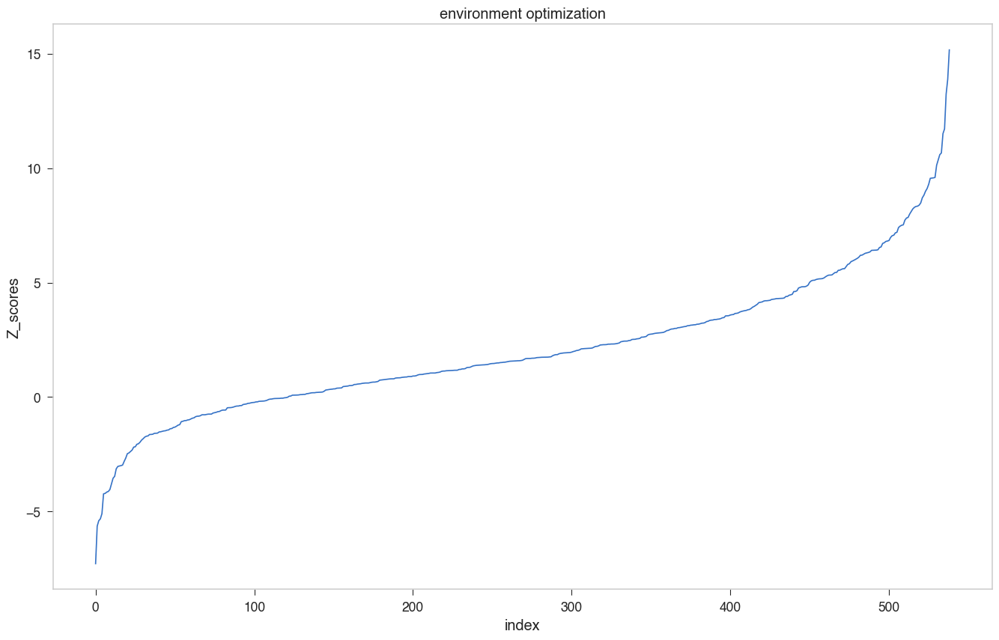

In [10]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter2_environment/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
# trial_name = "iter1_environment_zBias_2"
trial_name = "iter2_environment"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [11]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1a32_iteration_1_stronger_exclude_withoutBuria...,-7.273711,-28.957579,-61.739768,4.506941
1,1,1cc5_iter3_shift_well,-5.635419,-40.552637,-64.134272,4.184540
2,2,1ycc_iteration_2_bug_fixed,-5.397404,-85.801702,-116.602400,5.706576
3,3,1rss_iteration_1_stronger_exclude_withoutBuria...,-5.316372,-98.545940,-133.878113,6.645918
4,4,1cxc_iteration_1_stronger_exclude_withoutBuria...,-5.089575,-110.160056,-150.231416,7.873222
5,5,1bfg_iteration_1_stronger_exclude_withoutBuria...,-4.224360,-123.133327,-152.737892,7.008059
6,6,1cyo_iteration_1_stronger_exclude_withoutBuria...,-4.206590,-64.530228,-90.153978,6.091335
7,7,1cc5_iteration_1_stronger_exclude_withoutBuria...,-4.149728,-40.552637,-58.969235,4.438025
8,8,1ycc_iteration_1_stronger_exclude_withoutBuria...,-4.120499,-85.801702,-116.708746,7.500800
9,9,1btn_iter3_shift_well,-4.037491,-75.225916,-98.580050,5.784319


/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter1_environment//saved_gammas/iter1_environment_zBias_2_cutoff400_impose_Aprime_constraint
0 2.853421755522984
/Users/weilu/Research/data/optimization_2020_iter1_environment_zBias_2_400_iter1_environment_zBias_2.csv
mean 2.265712770234946
std 2.3569552978499484


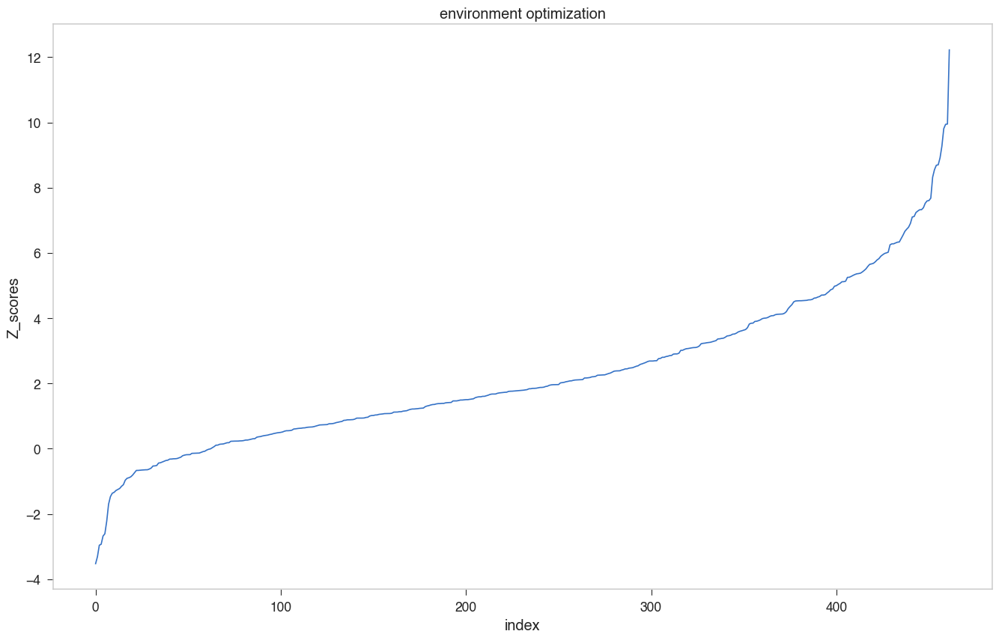

In [9]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter1_environment/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter1_environment_zBias_2"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter1_environment//saved_gammas/iter1_environment_zBias_1_cutoff400_impose_Aprime_constraint
0 3.138992024213359
/Users/weilu/Research/data/optimization_2020_iter1_environment_zBias_1_400_iter1_environment_zBias_1.csv
mean 2.6413136592125634
std 2.735208251900007


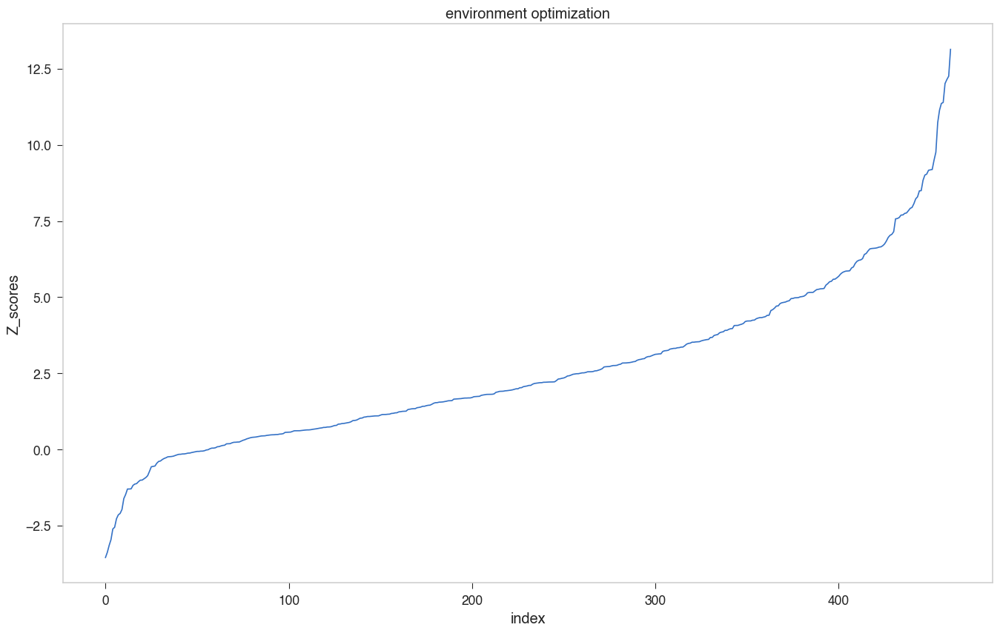

In [8]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter1_environment/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter1_environment_zBias_1"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter1_environment//saved_gammas/iter1_environment_cutoff400_impose_Aprime_constraint
0 3.8449447380525332
/Users/weilu/Research/data/optimization_2020_iter1_environment_400_iter1_environment.csv
mean 3.29315191438089
std 3.5089595625506016


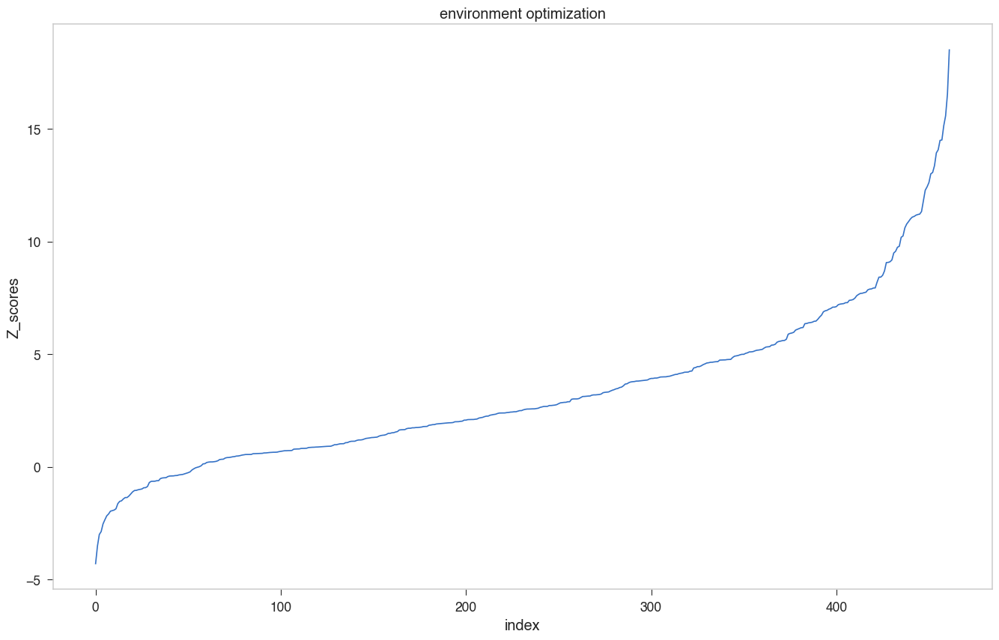

In [7]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/iter1_environment/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter1_environment"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff400_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/data/optimization_2020_iter1_environment_400_iter1_environment.csv
mean 3.1096741130655263
std 3.4786383428318906


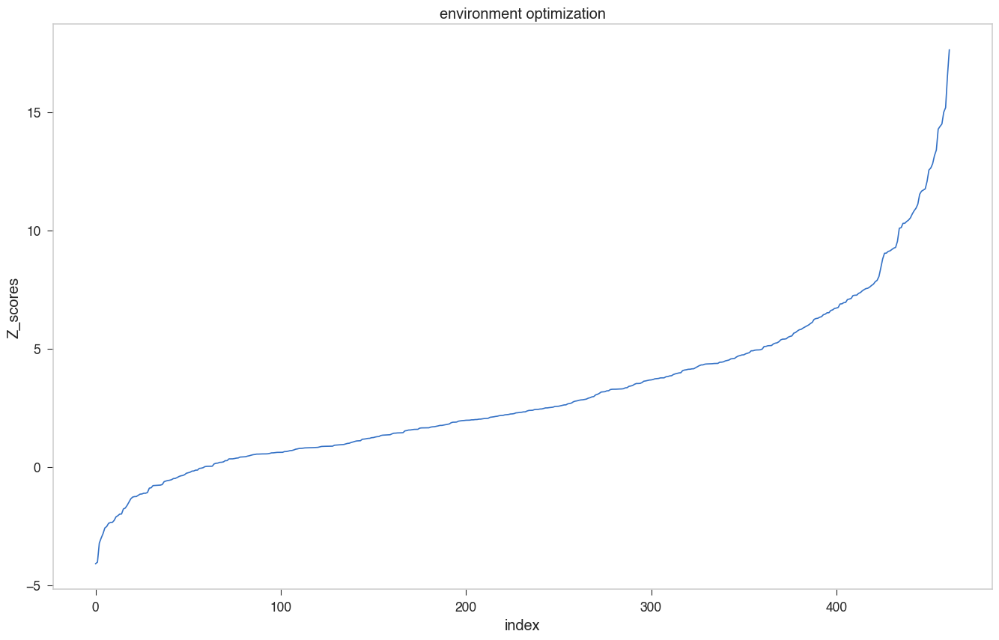

In [5]:
trial_name = "iter1_environment"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff300_impose_Aprime_constraint"
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())


In [6]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1btn_iter3_shift_well,-4.097955,-36.622234,-48.141514,2.810983
1,1,1cc5_iter3_shift_well,-4.034608,-22.188187,-30.947445,2.171030
2,2,1a32_iteration_1_stronger_exclude_withoutBuria...,-3.228306,-20.926307,-29.342187,2.606903
3,3,1cxc_iteration_1_stronger_exclude_withoutBuria...,-3.016539,-55.011725,-69.369698,4.759750
4,4,2cbp_iter3_shift_well,-2.830343,-49.999821,-58.441356,2.982513
5,5,1ycc_iteration_1_stronger_exclude_withoutBuria...,-2.587141,-44.893653,-54.753423,3.811067
6,6,1cyo_iteration_1_stronger_exclude_withoutBuria...,-2.525493,-32.569398,-39.869899,2.890724
7,7,1cpq_iteration_0_stronger_exclude_volume,-2.391994,-42.857739,-48.376428,2.307149
8,8,1rss_iteration_1_stronger_exclude_withoutBuria...,-2.359814,-53.825186,-63.327235,4.026610
9,9,1btn_iteration_0_stronger_exclude_volume,-2.355192,-36.622234,-42.216680,2.375367


/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization_complete//saved_gammas/iter0_cutoff300_impose_Aprime_constraint
0 6.855100934237718
/Users/weilu/Research/data/optimization_2020_iter4_shift_center_z_weighted_2_400_iter4_shift_center_z_weighted_2.csv
mean 3.4250030731166046
std 3.1850964032816145


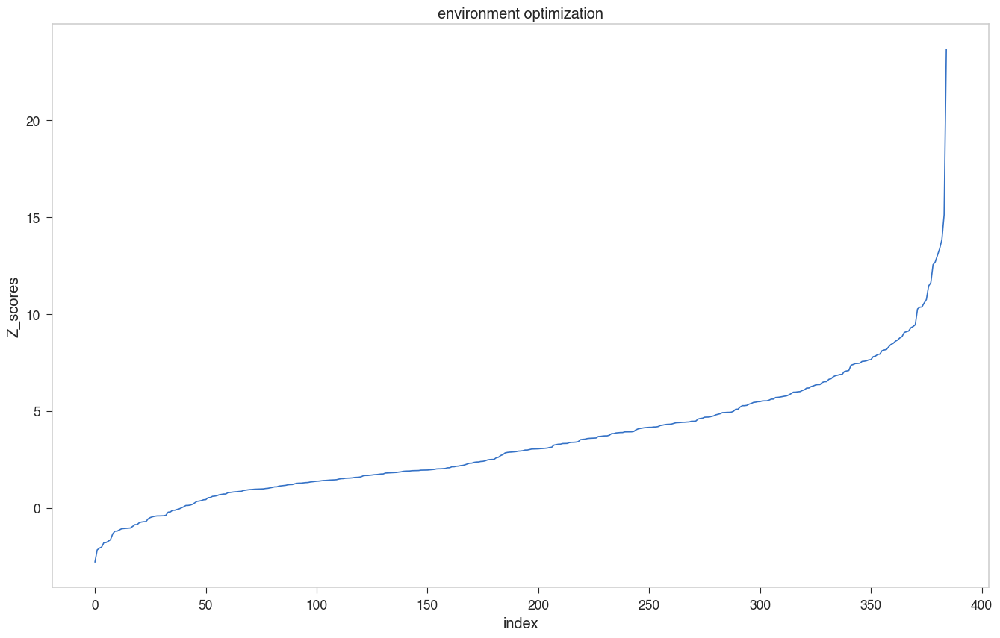

In [55]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization_complete/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
# trial_name = "iter4_shift_center_z_weighted_2"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/iter0_cutoff300_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [57]:
gammaFile = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization_complete/saved_gammas/iter0_cutoff300_impose_Aprime_constraint"

In [60]:
phiFile = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/phis/phi_pairwise_contact_environment_com_shift_center_well_1hmt_iter3_shift_well_native_2.5_6.5_5.0_10"

In [65]:
phiMediatedFile = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/phis/phi_density_mediated_contact_com_shift_center_well_1hmt_iter3_shift_well_native_6.5_9.5_5.0_10_2.6_7.0"

In [66]:
phiMediated = np.loadtxt(phiMediatedFile)

In [67]:
np.dot(phiMediated, gamma[420:])

-28.596683678993003

In [61]:
phi = np.loadtxt(phiFile)

In [58]:
gamma = np.loadtxt(gammaFile)

In [63]:
np.dot(phi, gamma[:420])

-33.738326454816196

In [ ]:
-33.738326454816196

In [64]:
-62.335010 + 33.738326454816196

-28.5966835451838

In [59]:
gamma.shape

(840,)

In [56]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1rss_iteration_1_stronger_exclude_withoutBuria...,-2.782080,-58.968461,-72.978840,5.035936
1,1,1hmt_iteration_1_stronger_exclude_withoutBuria...,-2.163898,-62.335010,-76.211456,6.412707
2,2,1opy_iteration_1_stronger_exclude_withoutBuria...,-2.071783,-49.988043,-58.253377,3.989479
3,3,1a1x_iteration_1_stronger_exclude_withoutBuria...,-2.019010,-45.559985,-55.307353,4.827795
4,4,1ycc_iteration_1_stronger_exclude_withoutBuria...,-1.791802,-52.635117,-61.259672,4.813342


/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization_complete//saved_gammas/iter0_cutoff600_impose_Aprime_constraint
0 7.944870680544339
/Users/weilu/Research/data/optimization_2020_iter4_shift_center_z_weighted_2_400_iter4_shift_center_z_weighted_2.csv
mean 5.045777305087922
std 3.5826650414165675


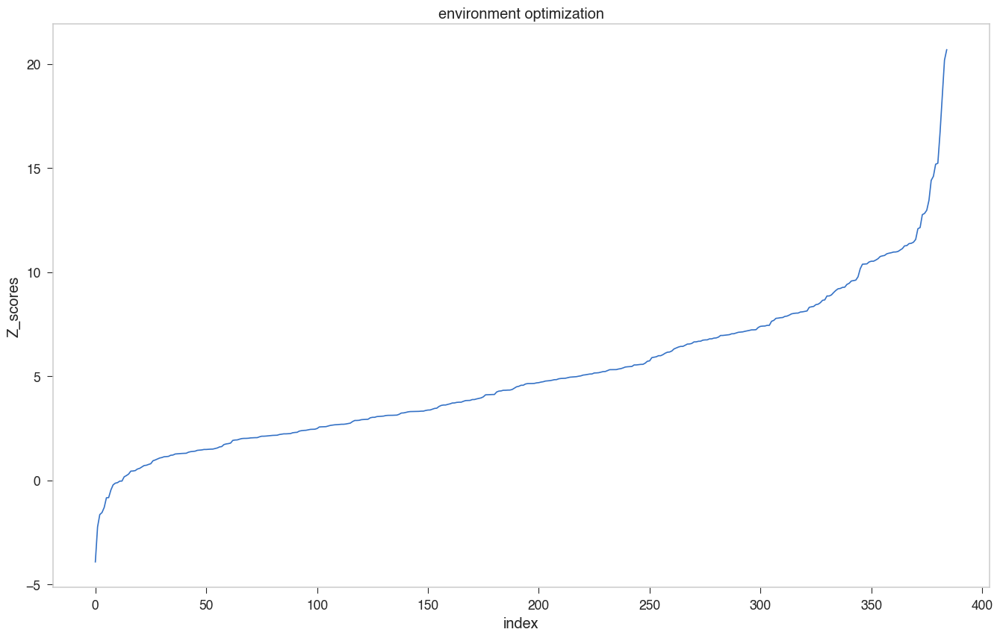

In [51]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization_complete/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
# trial_name = "iter4_shift_center_z_weighted_2"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/iter0_cutoff600_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [50]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter4_shift_center_z_weighted_2"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/iter0_cutoff200_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization/saved_gammas/iter0_cutoff600_impose_Aprime_constraint


OSError: /Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization/saved_gammas/iter0_cutoff600_impose_Aprime_constraint not found.

/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization/saved_gammas/iter0_cutoff200_impose_Aprime_constraint
0 3.4885365153290433
/Users/weilu/Research/data/optimization_2020_iter4_shift_center_z_weighted_2_400_iter4_shift_center_z_weighted_2.csv
mean 4.45320896447067
std 3.7603120361710847


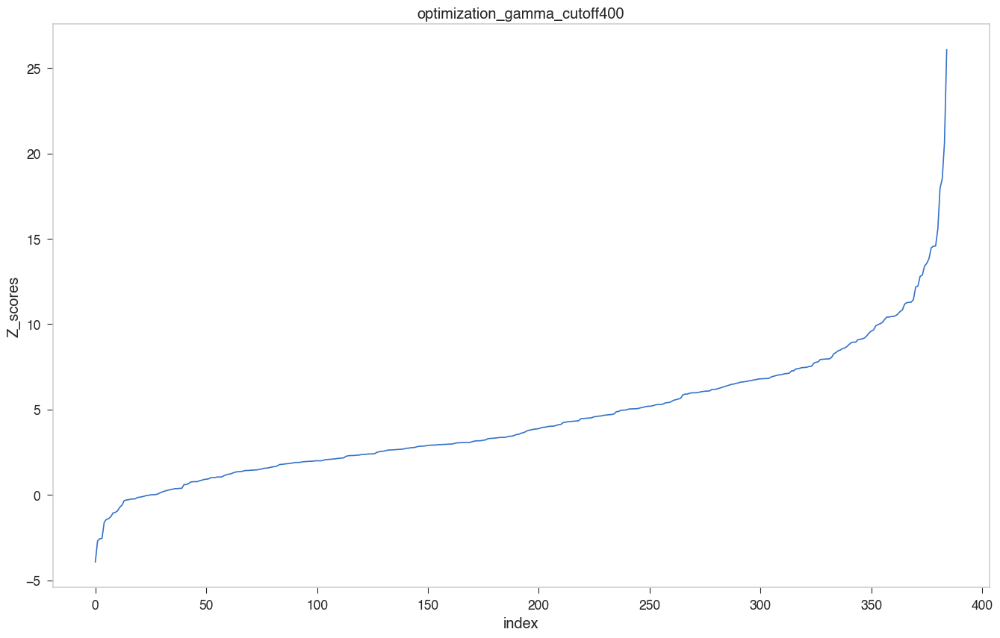

In [34]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter4_shift_center_z_weighted_2"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/iter0_cutoff200_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("environment optimization")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [36]:
data_envr = data

In [39]:
d = pd.concat([data_envr.assign(Scheme='environment based direct only'), data.assign(Scheme='traditional direct contact only')])

In [42]:
d2 = pd.concat([data.assign(Scheme="contact and mediated"), d])

In [45]:
d3 = pd.concat([data.assign(Scheme="contact and mediated iter5"), d2])

In [48]:
d4 = pd.concat([data.assign(Scheme="environment_direct_and_normal_contact"), d3])

In [52]:
d5 = pd.concat([data.assign(Scheme="environment_direct_and_normal_contact_cutoff600"), d4])

In [ ]:
environment_optimization_complete

Text(0.5, 1.0, 'environment optimization')

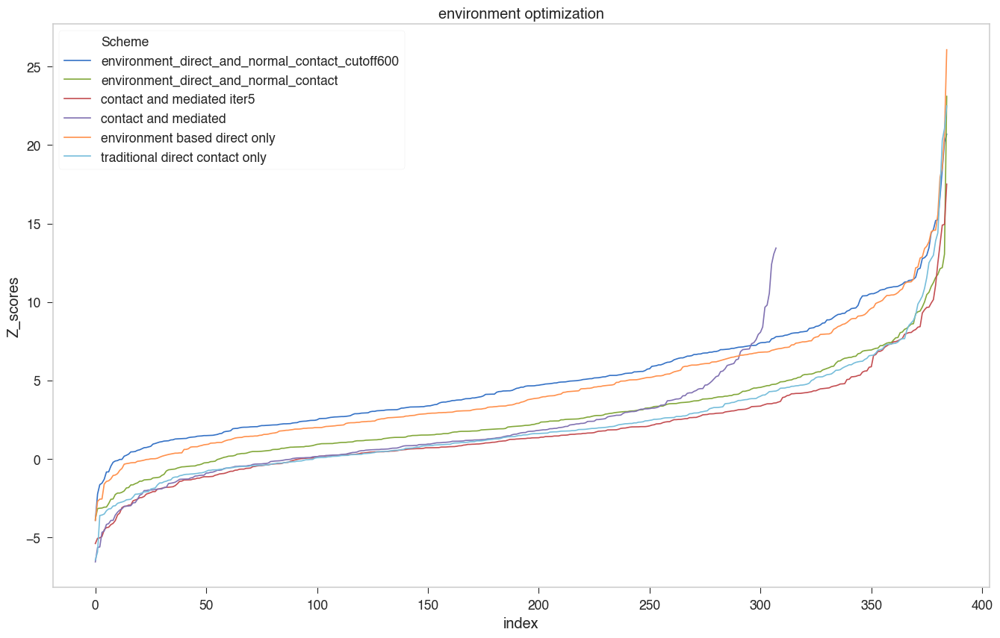

In [54]:
sns.lineplot("index", "Z_scores", hue="Scheme", data=d5)
plt.title("environment optimization")

/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization_compare/saved_gammas/iter0_cutoff200_impose_Aprime_constraint
0 7.331361915116595
/Users/weilu/Research/data/optimization_2020_iter4_shift_center_z_weighted_2_400_iter4_shift_center_z_weighted_2.csv
mean 2.149365436713202
std 3.5979396491547226


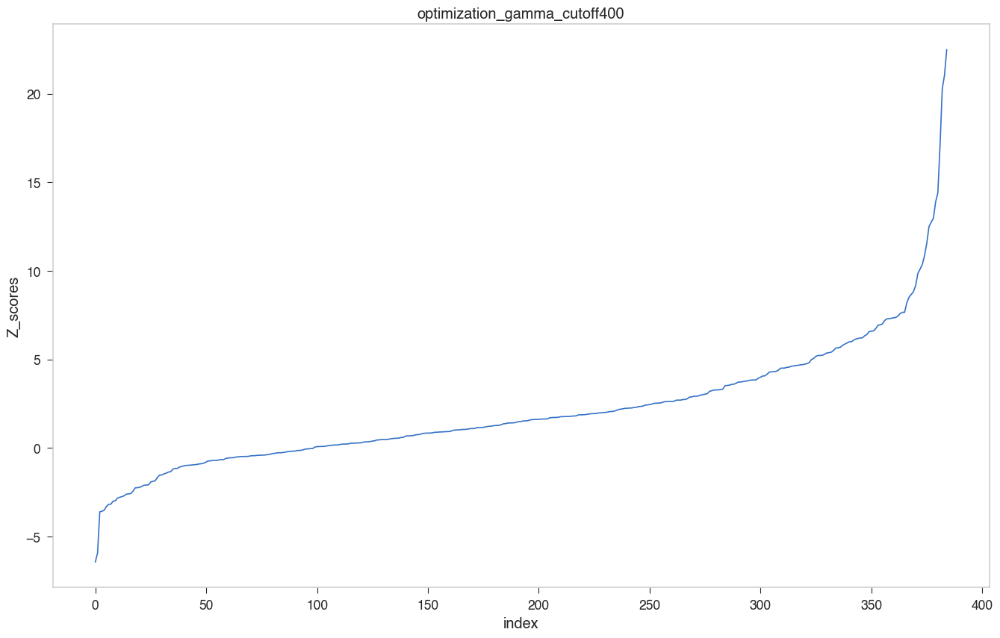

In [37]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/environment_optimization_compare"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
# trial_name = "iter4_shift_center_z_weighted_2"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{gamma_pre}/iter0_cutoff200_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [33]:
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

mean 2.149365436713202
std 3.5979396491547226


/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/optimization_iter5_shift_center//saved_gammas/iter5_shift_center_cutoff400_impose_Aprime_constraint
0 9.93204016954161
/Users/weilu/Research/data/optimization_2020_iter5_shift_center_400_iter5_shift_center.csv
mean 1.7680556322472853
std 3.1813604414396655


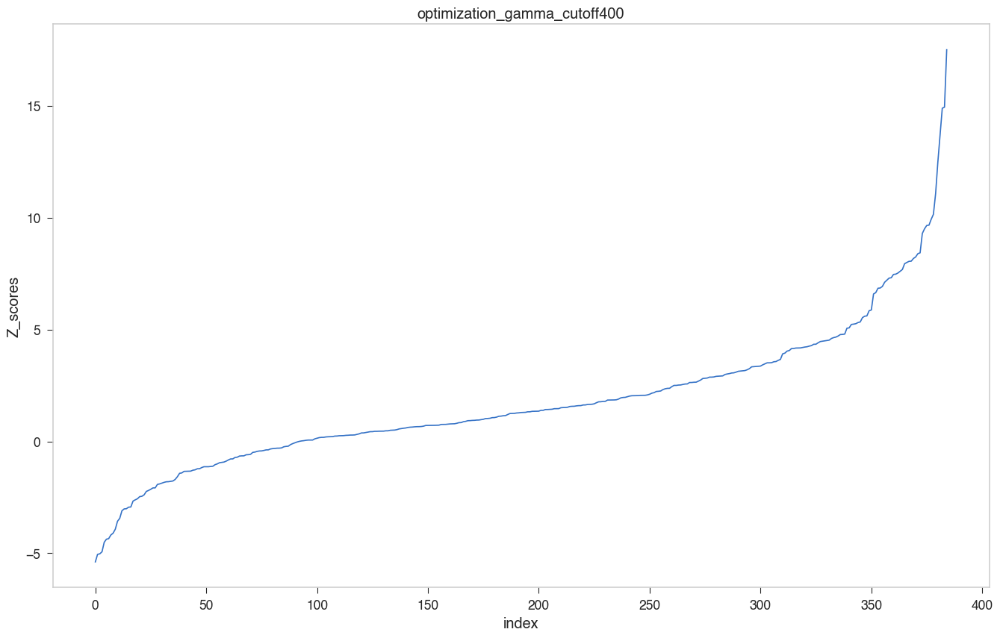

In [44]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/optimization_iter5_shift_center/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter4_shift_center_z_weighted_2"
trial_name = "iter5_shift_center"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/optimization_iter4_shift_center//saved_gammas/iter4_shift_center_cutoff400_impose_Aprime_constraint
0 8.073524526343457
/Users/weilu/Research/data/optimization_2020_iter4_shift_center_400_iter4_shift_center.csv
mean 1.3365763031220188
std 2.885463439737958


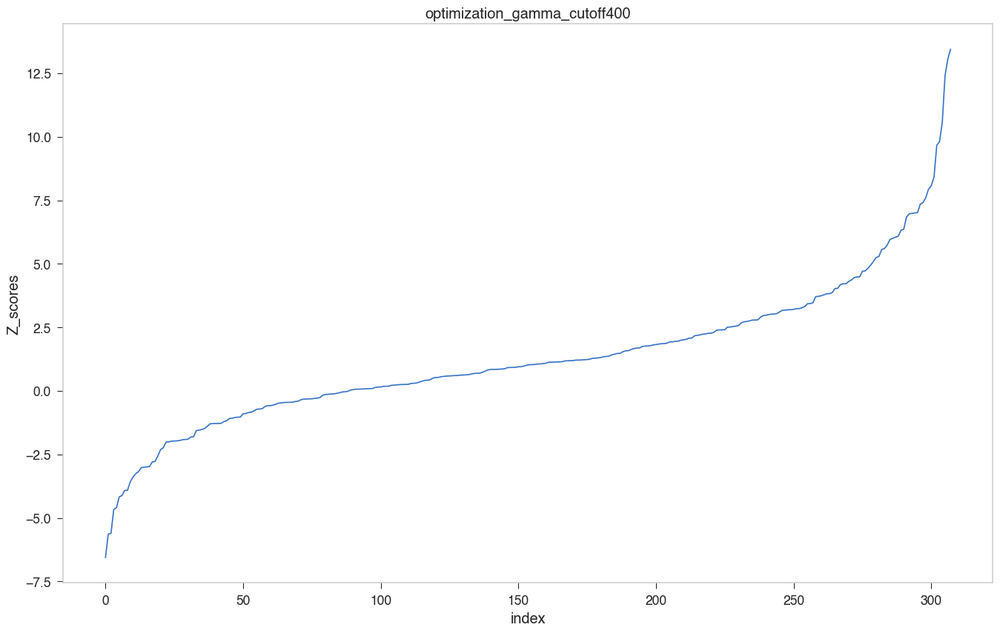

In [41]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/optimization_iter5_shift_center/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter4_shift_center_z_weighted_2"
trial_name = "iter5_shift_center"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter4_shift_center//saved_gammas/iter4_shift_center_z_weighted_2_cutoff400_impose_Aprime_constraint
0 5.704180534166037
/Users/weilu/Research/data/optimization_2020_iter4_shift_center_z_weighted_2_400_iter4_shift_center_z_weighted_2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

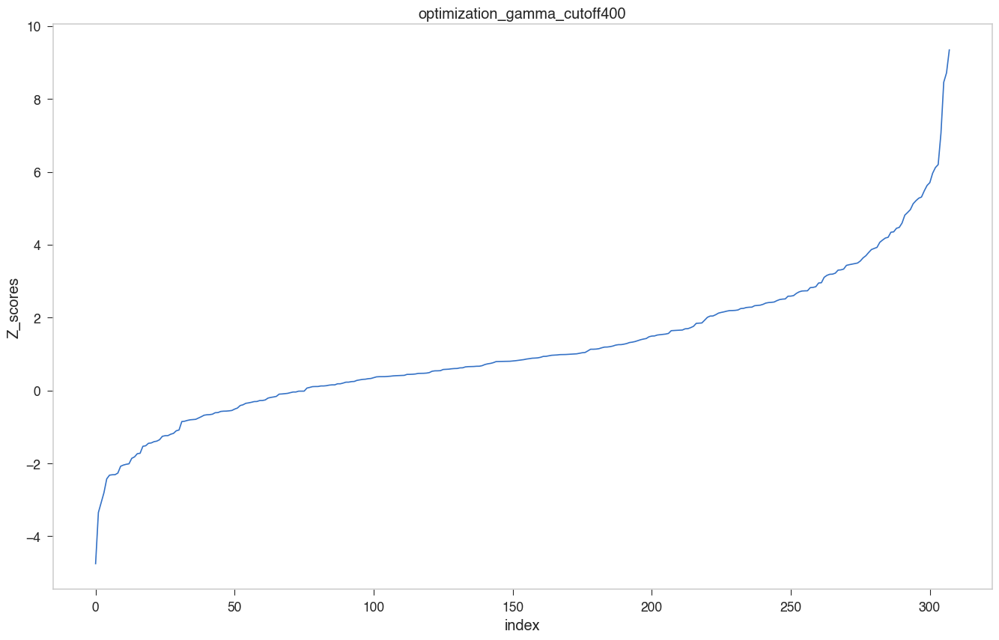

In [21]:


cutoff = 400
pre = "/Users/weilu/Research/server/apr_2020/mass_iterative_optimization/optimization_iter4_shift_center/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter4_shift_center_z_weighted_2"
trial_name = "iter4_shift_center"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

In [22]:
data.head(10)

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1a32_iteration_1_stronger_exclude_withoutBuria...,-4.752785,-19.308070,-27.785213,1.783616
1,1,1ycc_iteration_2_bug_fixed,-3.349575,-51.209676,-61.328015,3.020783
2,2,1cc5_iter3_shift_well,-3.080586,-24.609185,-31.019197,2.080777
3,3,1cxc_iteration_1_stronger_exclude_withoutBuria...,-2.805475,-52.073453,-62.130873,3.584926
4,4,1dhn_iter3_shift_well,-2.426138,-50.756799,-57.696096,2.860223
5,5,1rss_iteration_1_stronger_exclude_withoutBuria...,-2.323939,-48.433320,-55.530680,3.054022
6,6,1cpq_iteration_0_stronger_exclude_volume,-2.313011,-35.710573,-42.915014,3.114746
7,7,3pyp_iter3_shift_well,-2.311088,-55.309126,-62.379878,3.059491
8,8,1neu_iter3_shift_well,-2.266225,-67.343289,-74.441644,3.132238
9,9,1cpq_iter3_shift_well,-2.079605,-35.710573,-42.709197,3.365361


In [20]:
data.head(10)

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1a32_iteration_1_stronger_exclude_withoutBuria...,-5.905109,-17.684430,-29.603607,2.018452
1,1,1cc5_iter3_shift_well,-4.417613,-22.669899,-32.205695,2.158586
2,2,1ycc_iteration_2_bug_fixed,-3.879074,-49.053546,-60.971038,3.072252
3,3,1cxc_iteration_1_stronger_exclude_withoutBuria...,-3.735640,-50.241715,-63.640009,3.586613
4,4,1cpq_iter3_shift_well,-3.587638,-33.279809,-45.019091,3.272148
5,5,1neu_iter3_shift_well,-3.524042,-66.549408,-77.885647,3.216828
6,6,3pyp_iter3_shift_well,-3.102792,-55.615692,-65.437377,3.165435
7,7,1cxc_iter3_shift_well,-3.069015,-50.241715,-61.050368,3.521864
8,8,1rss_iteration_1_stronger_exclude_withoutBuria...,-3.046761,-46.881295,-56.960797,3.308268
9,9,1btn_iter3_shift_well,-2.828364,-50.301283,-59.068631,3.099795


In [16]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1a32_iteration_1_stronger_exclude_withoutBuria...,-6.556180,-15.871499,-30.133640,2.175374
1,1,1cpq_iter3_shift_well,-5.635842,-30.872980,-47.254052,2.906588
2,2,1cc5_iter3_shift_well,-5.605439,-20.641286,-33.147346,2.231058
3,3,1sfp_iter3_shift_well,-4.669628,-56.490520,-74.964678,3.956237
4,4,1neu_iter3_shift_well,-4.590755,-65.950690,-80.869727,3.249800
5,5,1cxc_iteration_1_stronger_exclude_withoutBuria...,-4.171677,-49.488148,-65.777808,3.904823
6,6,1btn_iter3_shift_well,-4.117672,-47.572218,-61.274239,3.327614
7,7,1ycc_iteration_2_bug_fixed,-3.915471,-46.556604,-58.403380,3.025632
8,8,3pyp_iter3_shift_well,-3.909769,-55.648607,-68.465415,3.278150
9,9,1cxc_iter3_shift_well,-3.578211,-49.488148,-63.316785,3.864679


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter4////saved_gammas/iter4_z_weighted_3_cutoff400_impose_Aprime_constraint
0 1.1977201508977962
/Users/weilu/Research/data/optimization_2020_iter4_z_weighted_3_400_iter4_z_weighted_3.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

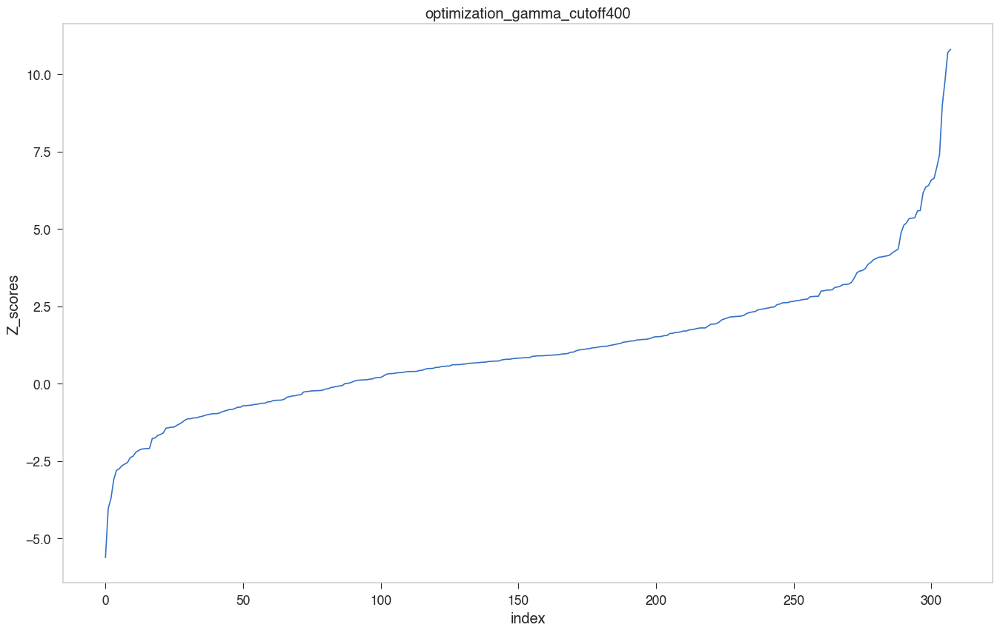

In [8]:


cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter4///"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter4_z_weighted_3"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [10]:
data["Z_scores"].mean()

1.1332703930340695

In [11]:
data["Z_scores"].std()

2.214890987989688

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter4////saved_gammas/iter4_z_weighted_2_cutoff400_impose_Aprime_constraint
0 2.5190137090951032
/Users/weilu/Research/data/optimization_2020_iter4_z_weighted_2_400_iter4_z_weighted_2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

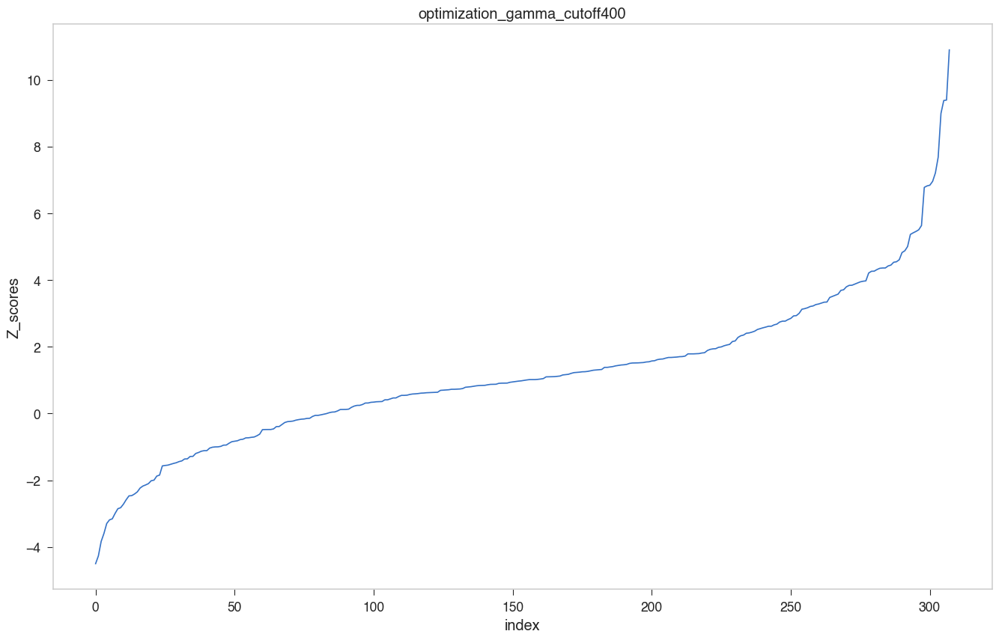

In [12]:


cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter4///"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter4_z_weighted_2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [13]:
print("mean", data["Z_scores"].mean())
print("std", data["Z_scores"].std())

mean 1.1870005393842264
std 2.2871335863826965


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter4////saved_gammas/iter4_z_weighted_cutoff400_impose_Aprime_constraint
0 3.7520227955986134
/Users/weilu/Research/data/optimization_2020_iter4_z_weighted_400_iter4_z_weighted.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

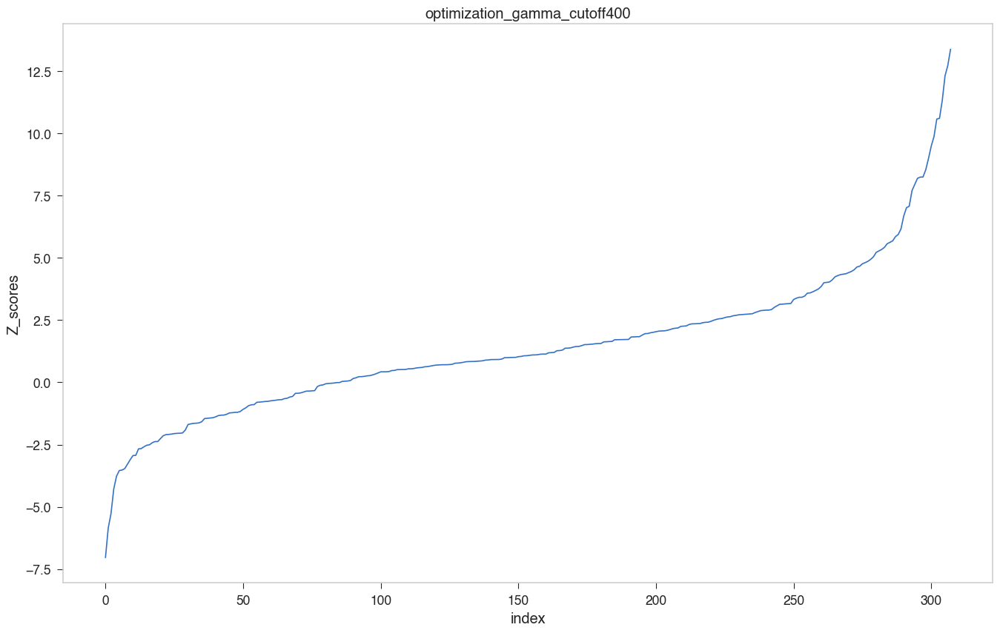

In [5]:


cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter4///"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter4_z_weighted"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter4////saved_gammas/iter4_cutoff400_impose_Aprime_constraint
0 4.935021875646127
/Users/weilu/Research/data/optimization_2020_iter4_400_iter4.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

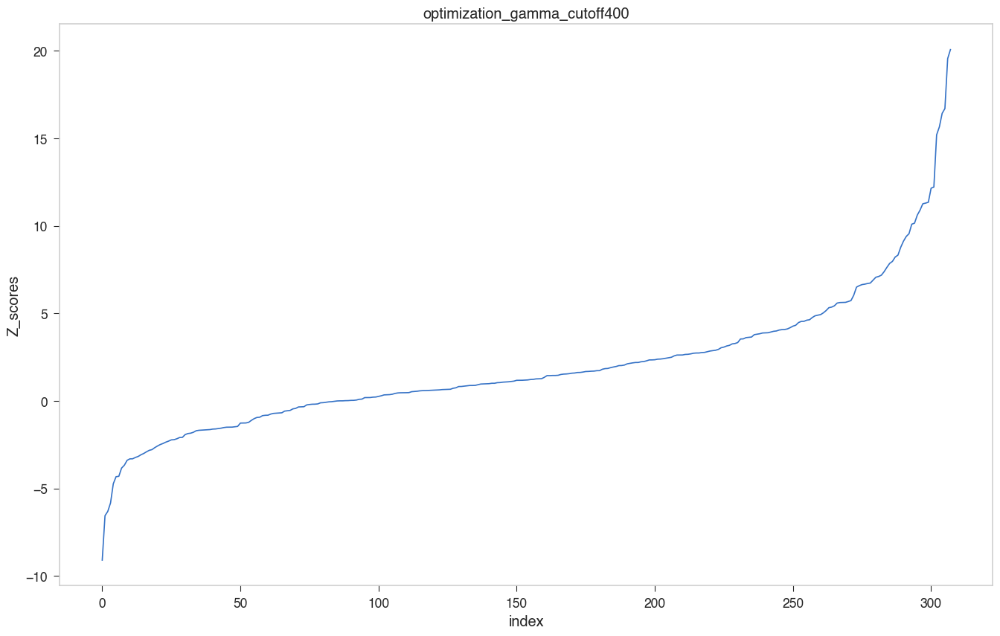

In [250]:


cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter4///"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_shift_center_bugfixed///saved_gammas/shift_center_cutoff400_impose_Aprime_constraint
0 11.117730751981833
/Users/weilu/Research/data/optimization_2020_shift_center_400_shift_center.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

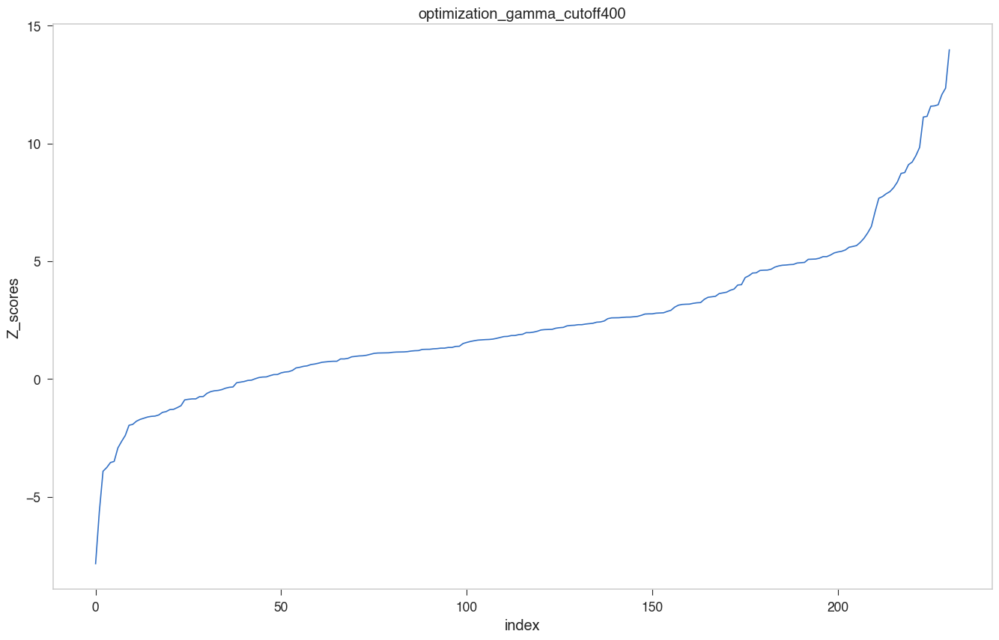

In [249]:


cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_shift_center_bugfixed//"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "shift_center"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter3//saved_gammas/iter3_z_weighted_2_cutoff400_impose_Aprime_constraint
0 3.6232765288412856
/Users/weilu/Research/data/optimization_2020_iter3_z_weighted_2_400_iter3_z_weighted_2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

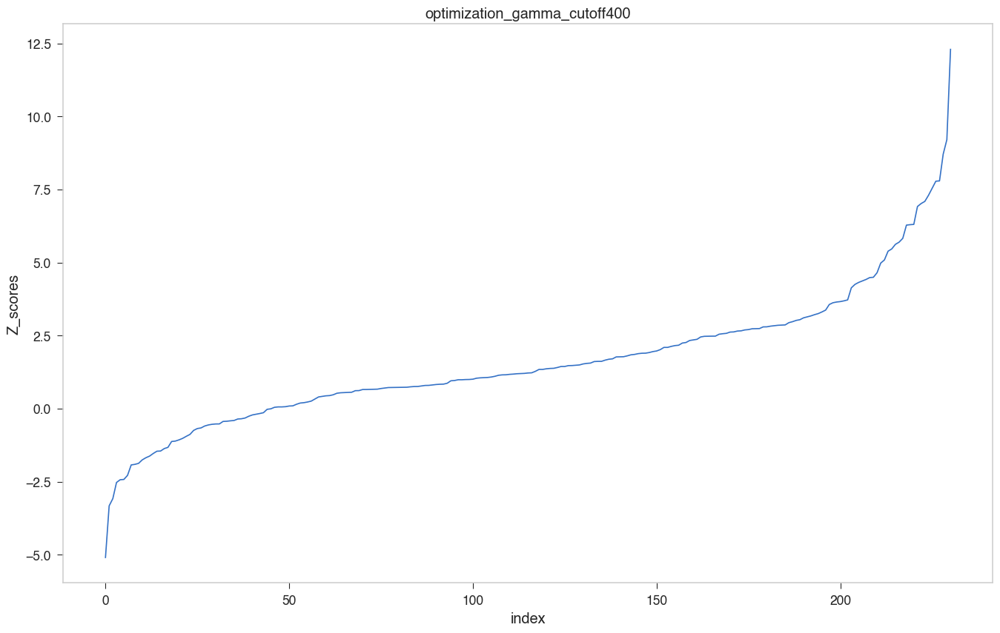

In [247]:


cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter3/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter3_z_weighted_2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [248]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1a32_iteration_1_stronger_exclude_withoutBuria...,-5.095388,-13.951892,-24.623546,2.094375
1,1,1cxc_iteration_1_stronger_exclude_withoutBuria...,-3.327525,-43.384737,-54.284480,3.275631
2,2,1hoe_iteration_2_bug_fixed,-3.080382,-26.697860,-32.990503,2.042813
3,3,1pht_iteration_1_stronger_exclude_withoutBuria...,-2.528310,-24.715374,-30.491704,2.284660
4,4,1a32_iteration_2_bug_fixed,-2.433985,-13.951892,-19.116248,2.121770
5,5,1bfg_iteration_1_stronger_exclude_withoutBuria...,-2.424732,-57.793030,-66.416573,3.556493
6,6,1rss_iteration_1_stronger_exclude_withoutBuria...,-2.285185,-49.951173,-58.762858,3.856004
7,7,1mba_iteration_1_stronger_exclude_withoutBuria...,-1.927558,-42.734333,-51.684882,4.643465
8,8,1btn_iteration_1_stronger_exclude_withoutBuria...,-1.907688,-49.556937,-55.918991,3.334955
9,9,1osa_iteration_2_bug_fixed,-1.874353,-41.354393,-47.939233,3.513126


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter3//saved_gammas/iter3_z_weighted_cutoff400_impose_Aprime_constraint
0 4.288551799455472
/Users/weilu/Research/data/optimization_2020_iter3_z_weighted_400_iter3_z_weighted.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

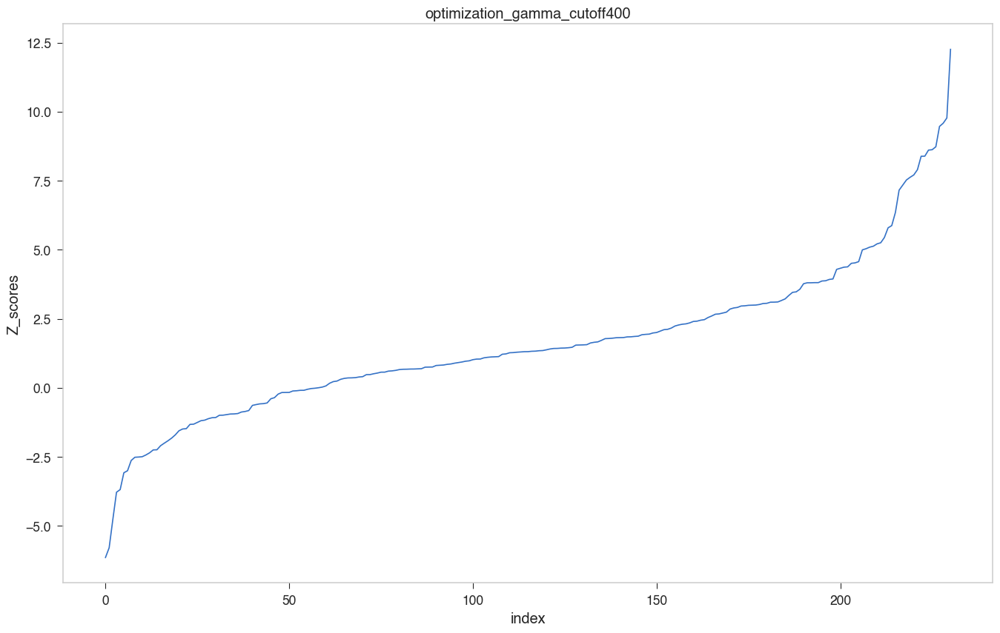

In [246]:


cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter3/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter3_z_weighted"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter3//saved_gammas/iter3_cutoff400_impose_Aprime_constraint
0 5.559048393093149
/Users/weilu/Research/data/optimization_2020_iter3_400_iter3.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

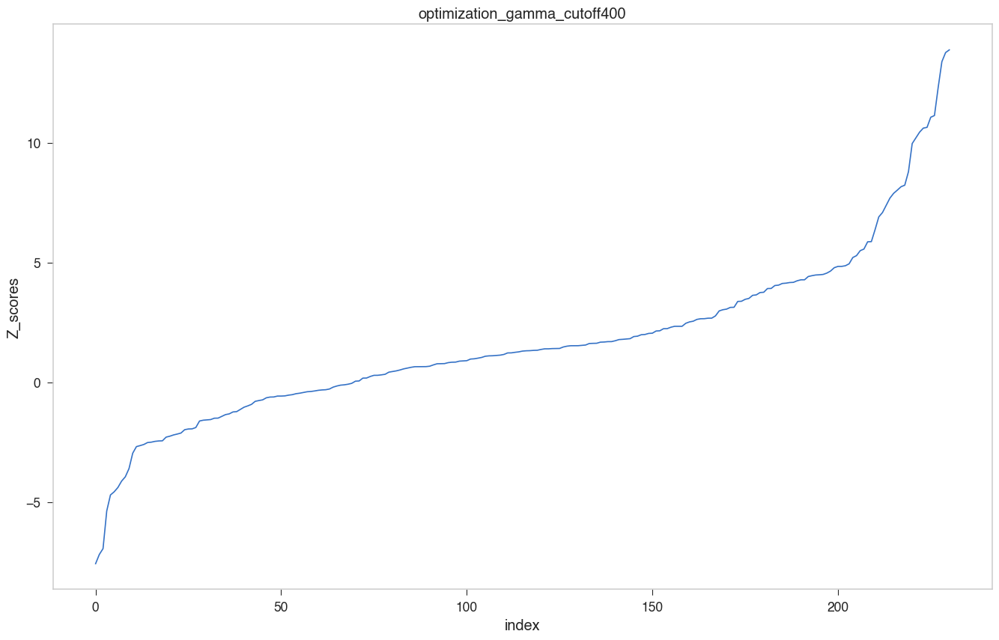

In [243]:


cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter3/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter3"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [244]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1ycc_iteration_2_bug_fixed,-7.567572,-39.008226,-62.981487,3.167894
1,1,1cxc_iteration_1_stronger_exclude_withoutBuria...,-7.184673,-42.000372,-73.733111,4.416727
2,2,1a32_iteration_1_stronger_exclude_withoutBuria...,-6.941135,-8.854426,-28.876084,2.884493
3,3,1ycc_iteration_1_stronger_exclude_withoutBuria...,-5.368692,-39.008226,-59.432512,3.804332
4,4,1a32_iteration_2_bug_fixed,-4.701089,-8.854426,-21.258714,2.638599
5,5,1bfg_iteration_1_stronger_exclude_withoutBuria...,-4.569754,-59.224593,-79.579751,4.454322
6,6,1neu_iteration_2_bug_fixed,-4.390651,-49.812946,-65.642579,3.605305
7,7,2sns_iteration_1_stronger_exclude_withoutBuria...,-4.123906,-62.377962,-77.482736,3.662735
8,8,1mba_iteration_1_stronger_exclude_withoutBuria...,-3.944665,-32.075662,-55.159340,5.851873
9,9,1rss_iteration_1_stronger_exclude_withoutBuria...,-3.600847,-52.658828,-70.790131,5.035288


/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630
0 -1.6770547577200425
/Users/weilu/Research/data/optimization_2020_iter2_bugfix_z_weighted_400_iter2_bugfix_z_weighted.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

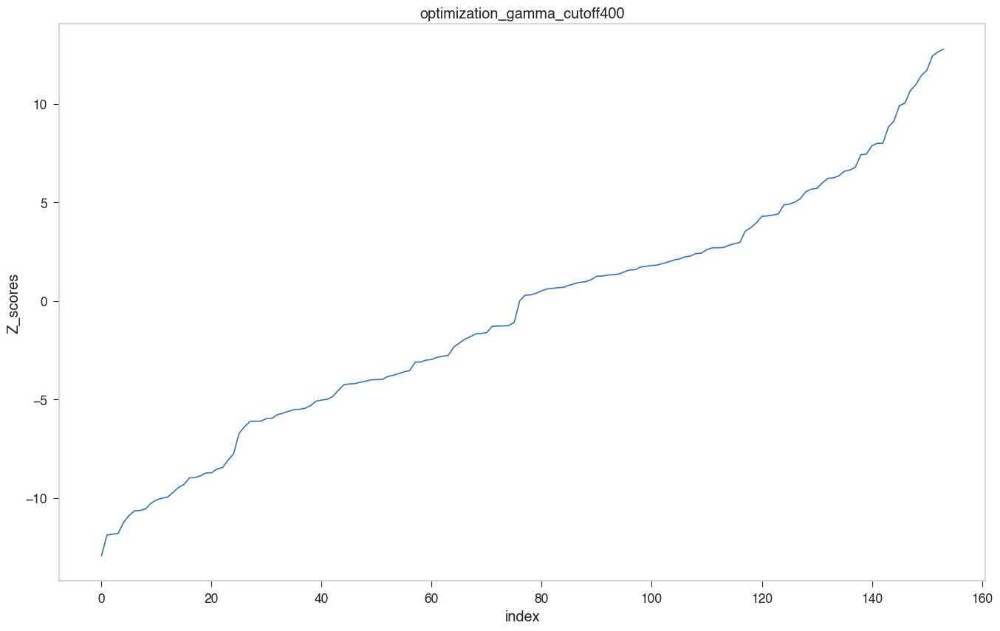

In [239]:


cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2_bugfix_z_weighted"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix//iter_iter2_bugfix_z_weighted_30
0 -0.2792320202057799
/Users/weilu/Research/data/optimization_2020_iter2_bugfix_z_weighted_400_iter2_bugfix_z_weighted.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

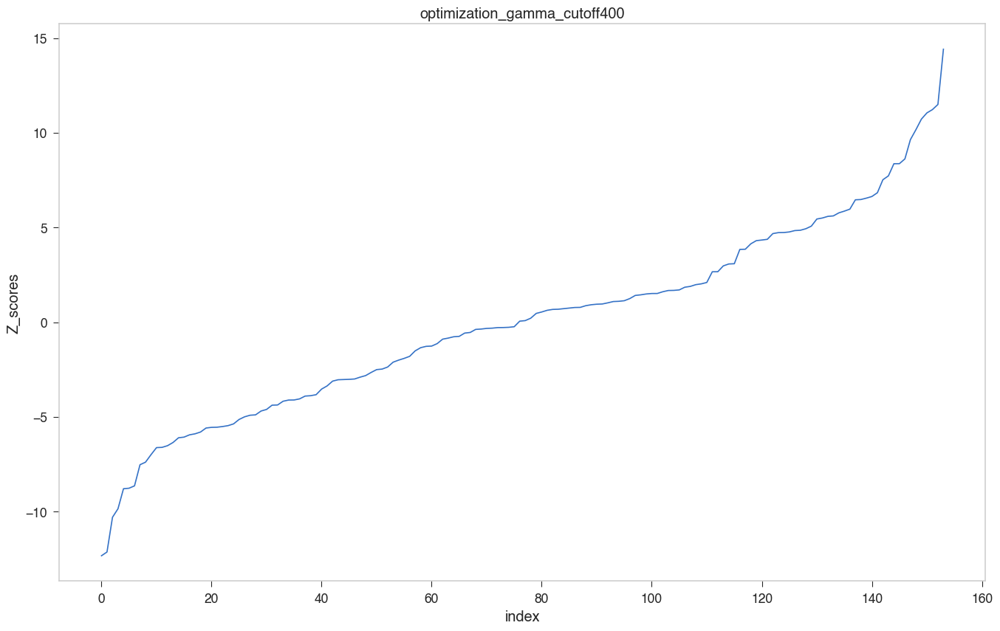

In [241]:


cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2_bugfix_z_weighted"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_iter2_bugfix_z_weighted_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix//saved_gammas/iter2_bugfix_z_weighted_cutoff400_impose_Aprime_constraint
0 4.8964714440340105
/Users/weilu/Research/data/optimization_2020_iter2_bugfix_z_weighted_400_iter2_bugfix_z_weighted.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

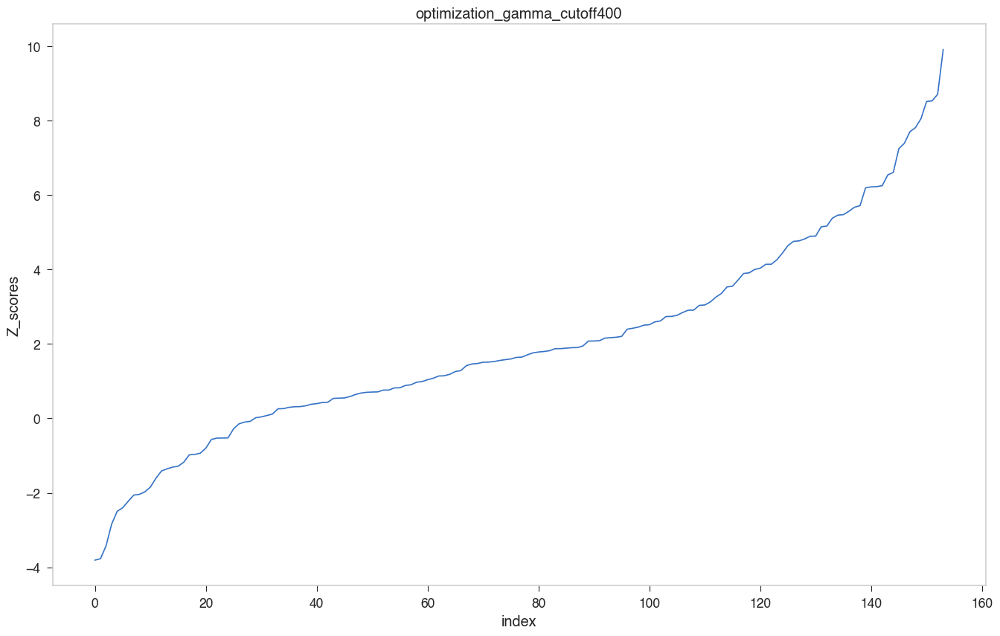

In [234]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2_bugfix_z_weighted"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [236]:
data.head(40)

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1ycc_iteration_1_stronger_exclude_withoutBuria...,-3.809822,-46.914166,-65.599914,4.904625
1,1,1cxc_iteration_1_stronger_exclude_withoutBuria...,-3.770462,-75.190164,-97.400443,5.890598
2,2,1ctj_iteration_1_stronger_exclude_withoutBuria...,-3.424942,-36.151189,-51.344006,4.435934
3,3,1a32_iteration_1_stronger_exclude_withoutBuria...,-2.842764,-14.239410,-25.381362,3.919409
4,4,1bfg_iteration_1_stronger_exclude_withoutBuria...,-2.497825,-79.748406,-95.839299,6.441961
5,5,1osa_iteration_1_stronger_exclude_withoutBuria...,-2.400530,-32.979639,-46.099810,5.465532
6,6,1cyo_iteration_1_stronger_exclude_withoutBuria...,-2.226644,-34.483576,-45.076482,4.757342
7,7,1ax8_iteration_1_stronger_exclude_withoutBuria...,-2.060314,-76.540428,-94.661085,8.795094
8,8,1neu_iteration_1_stronger_exclude_withoutBuria...,-2.042082,-94.646227,-115.817028,10.367263
9,9,1ptf_iteration_1_stronger_exclude_withoutBuria...,-1.974151,-42.281087,-53.361003,5.612495


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix//saved_gammas/iter2_bugfix_z_weighted_cutoff400_impose_Aprime_constraint
0 5.8390558152633965
/Users/weilu/Research/data/optimization_2020_iter2_bugfix_z_weighted_400_iter2_bugfix_z_weighted.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

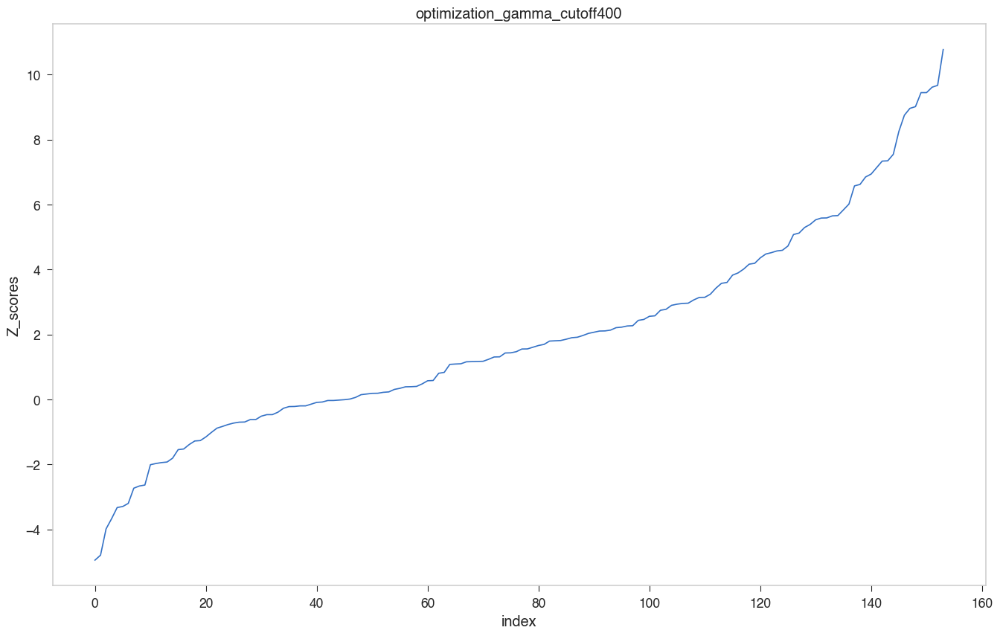

In [232]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2_bugfix_z_weighted"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [233]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1cxc_iteration_1_stronger_exclude_withoutBuria...,-4.943710,-75.944135,-107.682218,6.419891
1,1,1ycc_iteration_1_stronger_exclude_withoutBuria...,-4.790502,-46.723177,-73.687149,5.628632
2,2,1ctj_iteration_1_stronger_exclude_withoutBuria...,-3.981095,-38.971791,-57.676074,4.698276
3,3,1osa_iteration_1_stronger_exclude_withoutBuria...,-3.666645,-30.922674,-53.622133,6.190797
4,4,1bfg_iteration_1_stronger_exclude_withoutBuria...,-3.324322,-82.239197,-105.322556,6.943779


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix//saved_gammas/iter2_bugfix_cutoff400_impose_Aprime_constraint
0 6.791510945471681
/Users/weilu/Research/data/optimization_2020_iter2_bugfix_400_iter2_bugfix.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

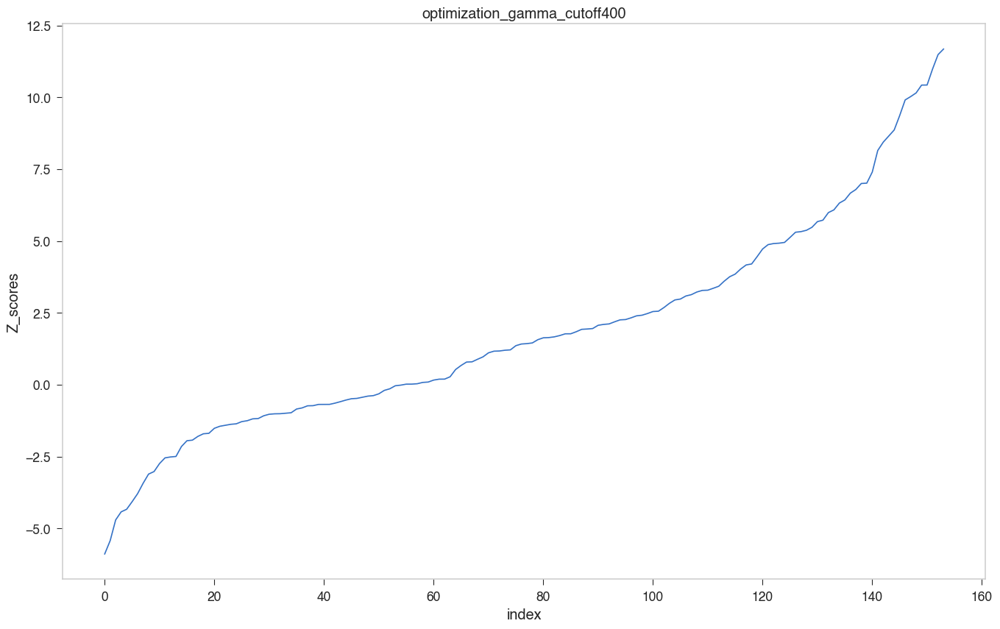

In [230]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2_bugfix"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [231]:
data.head(10)

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1cxc_iteration_1_stronger_exclude_withoutBuria...,-5.889506,-77.953984,-118.884603,6.949754
1,1,1ycc_iteration_1_stronger_exclude_withoutBuria...,-5.425041,-47.575340,-82.344197,6.408957
2,2,1osa_iteration_1_stronger_exclude_withoutBuria...,-4.704617,-29.164087,-61.829843,6.943340
3,3,1ctj_iteration_1_stronger_exclude_withoutBuria...,-4.424244,-42.408955,-64.424101,4.976024
4,4,1mba_iteration_1_stronger_exclude_withoutBuria...,-4.334482,-30.620417,-60.843634,6.972741
5,5,1bfg_iteration_1_stronger_exclude_withoutBuria...,-4.071054,-85.233407,-115.593925,7.457656
6,6,1a32_iteration_1_stronger_exclude_withoutBuria...,-3.791875,-14.214634,-31.366079,4.523209
7,7,1neu_iteration_1_stronger_exclude_withoutBuria...,-3.432299,-97.001502,-137.137674,11.693669
8,8,1ax8_iteration_1_stronger_exclude_withoutBuria...,-3.110006,-75.632490,-107.254470,10.167820
9,9,1cyo_iteration_1_stronger_exclude_withoutBuria...,-3.022164,-38.055178,-54.736718,5.519733


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix//saved_gammas/iter2_bugfix_cutoff400_impose_Aprime_constraint
0 6.517374718825284
/Users/weilu/Research/data/optimization_2020_iter2_bugfix_400_iter2_bugfix.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

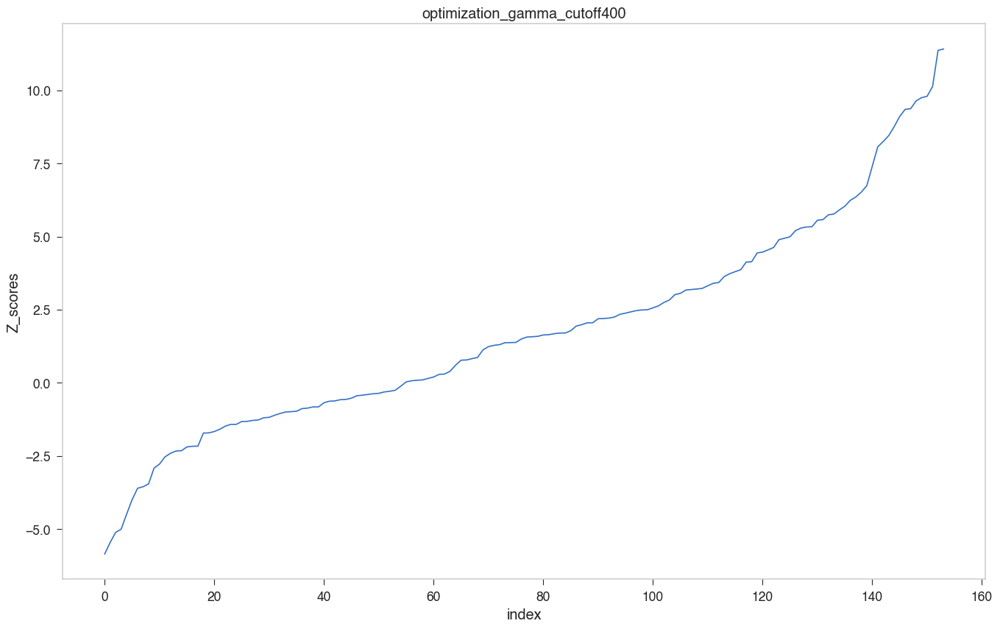

In [226]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2_bugfix"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [228]:
data.head(10)

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1cxc_iteration_1_stronger_exclude_withoutBuria...,-5.852654,-74.666303,-114.471185,6.801168
1,1,1osa_iteration_1_stronger_exclude_withoutBuria...,-5.457908,-28.739218,-65.756973,6.782408
2,2,1ycc_iteration_1_stronger_exclude_withoutBuria...,-5.113668,-48.426422,-79.958708,6.166275
3,3,1bfg_iteration_1_stronger_exclude_withoutBuria...,-5.006398,-81.717001,-118.050071,7.257328
4,4,1ctj_iteration_1_stronger_exclude_withoutBuria...,-4.489619,-42.747385,-64.436524,4.830953
5,5,1mba_iteration_1_stronger_exclude_withoutBuria...,-3.997814,-39.750932,-68.182035,7.111663
6,6,1a32_iteration_1_stronger_exclude_withoutBuria...,-3.605594,-16.209388,-32.097839,4.406612
7,7,1ax8_iteration_1_stronger_exclude_withoutBuria...,-3.554801,-73.157935,-109.441559,10.206935
8,8,1neu_iteration_1_stronger_exclude_withoutBuria...,-3.457507,-91.659243,-130.710552,11.294645
9,9,1cyo_iteration_1_stronger_exclude_withoutBuria...,-2.918444,-39.241290,-55.020097,5.406582


In [229]:
data.tail(10)

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
144,144,1bb9_iteration_0_stronger_exclude_volume,8.757175,-69.881619,-26.701721,4.930802
145,145,1ax8_iteration_0_stronger_exclude_volume,9.103885,-73.157935,-25.163338,5.271881
146,146,2mcm_iteration_0_stronger_exclude_volume,9.348436,-86.767069,-33.440607,5.704319
147,147,1bqk_iteration_0_stronger_exclude_volume,9.370790,-112.366626,-51.749768,6.468703
148,148,2sns_iteration_0_stronger_exclude_volume,9.635916,-105.344275,-41.053083,6.672037
149,149,1pne_iteration_0_stronger_exclude_volume,9.747928,-107.920884,-49.764369,5.966038
150,150,1bkf_iteration_0_stronger_exclude_volume,9.793597,-98.967857,-34.481707,6.584521
151,151,1rss_iteration_0_stronger_exclude_volume,10.128418,-78.130200,-26.185881,5.128572
152,152,1htp_iteration_0_stronger_exclude_volume,11.365678,-132.818128,-59.886744,6.416809
153,153,1flp_iteration_0_stronger_exclude_volume,11.409975,-72.669631,-10.358277,5.461130


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix//saved_gammas/iter2_bugfix_cutoff400_impose_Aprime_constraint
0 12.126525877339615
/Users/weilu/Research/data/optimization_2020_iter2_bugfix_400_iter2_bugfix.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

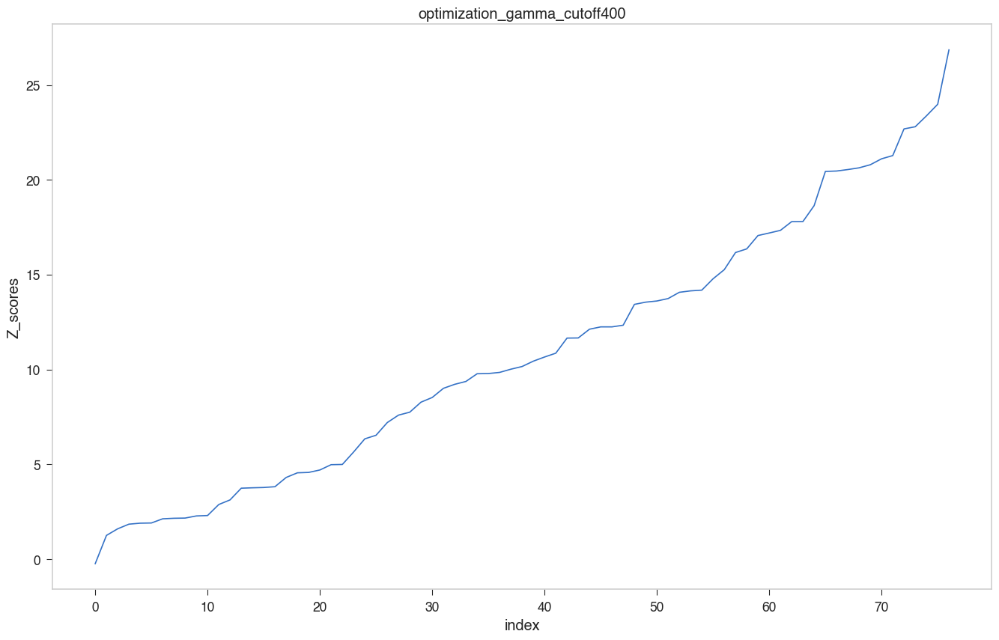

In [224]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_bugfix/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2_bugfix"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [225]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1opd_iteration_1_stronger_exclude_withoutBuria...,-0.236315,-175.075286,-178.288522,13.597248
1,1,1opc_iteration_1_stronger_exclude_withoutBuria...,1.253814,-174.192428,-152.918672,16.967228
2,2,1tul_iteration_1_stronger_exclude_withoutBuria...,1.601984,-241.478285,-126.889332,71.529419
3,3,1bm8_iteration_1_stronger_exclude_withoutBuria...,1.846690,-146.937825,-71.775492,40.701109
4,4,1ptf_iteration_1_stronger_exclude_withoutBuria...,1.897965,-196.811751,-166.018446,16.224379
5,5,1erv_iteration_1_stronger_exclude_withoutBuria...,1.908867,-248.048269,-133.905564,59.796063
6,6,451c_iteration_1_stronger_exclude_withoutBuria...,2.128069,-78.772179,-35.856965,20.166270
7,7,1tif_iteration_1_stronger_exclude_withoutBuria...,2.156767,-132.507024,-85.819847,21.646836
8,8,1pdo_iteration_1_stronger_exclude_withoutBuria...,2.167419,-256.799645,-158.069806,45.551800
9,9,1pht_iteration_1_stronger_exclude_withoutBuria...,2.279700,-45.238497,-25.223558,8.779636


/Users/weilu/Research/server/mar_2020/optimization_3dRobot/optimization//saved_gammas/3dRobot_cutoff400_impose_Aprime_constraint
0 1.9607956410998786
/Users/weilu/Research/data/optimization_2020_3dRobot_400_3dRobot.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

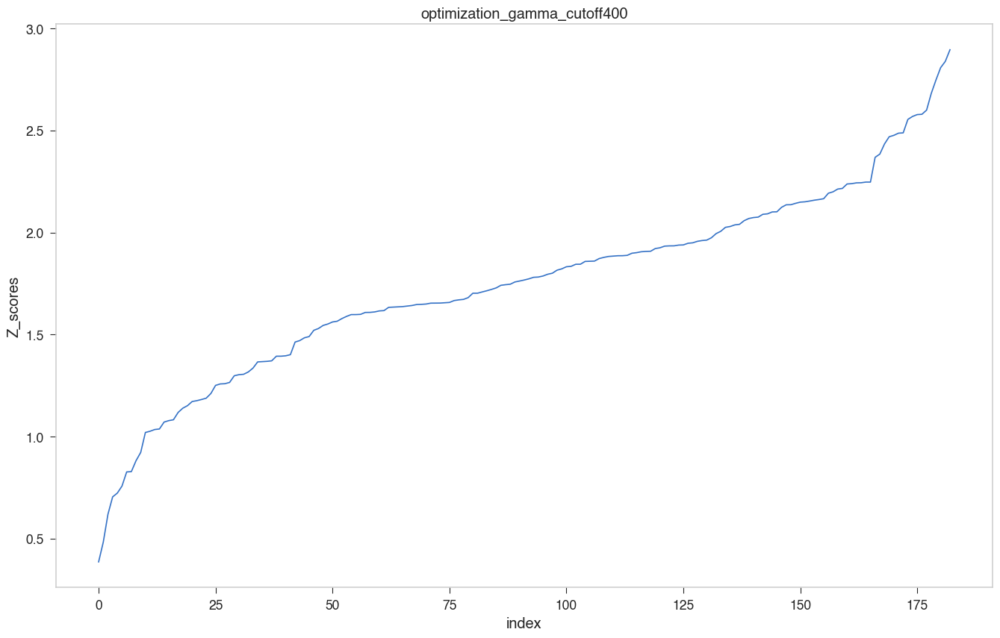

In [194]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/optimization_3dRobot/optimization/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "3dRobot"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_iter2_80"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "3DRobot", 300, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_iter2//iter_larger_excl_withoutBurial_iter2_80
0 1.7189748735575627
/Users/weilu/Research/data/optimization_2020_larger_excl_withoutBurial_iter2_400_larger_excl_withoutBurial_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

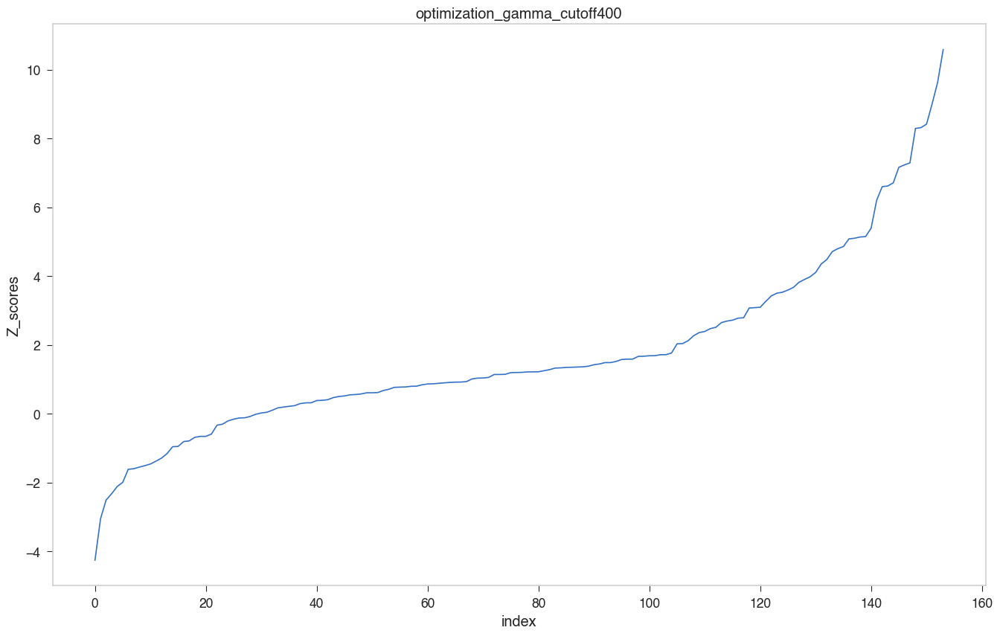

In [192]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_iter2/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl_withoutBurial_iter2"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_iter2_80"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [193]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1neu_iteration_1_stronger_exclude_withoutBurial,-4.254817,-94.142652,-134.376529,9.456077
1,1,1kpf_iteration_1_stronger_exclude_withoutBurial,-3.052566,-54.240080,-70.540534,5.339919
2,2,1bfg_iteration_0_stronger_exclude_volume,-2.508414,-74.737086,-91.584820,6.716490
3,3,1crb_iteration_0_stronger_exclude_volume,-2.324067,-97.587944,-110.020174,5.349342
4,4,1osa_iteration_0_stronger_exclude_volume,-2.114814,-42.482888,-52.667237,4.815718
5,5,1cpq_iteration_0_stronger_exclude_volume,-1.994233,-28.422965,-37.611341,4.607475
6,6,1opc_iteration_0_stronger_exclude_volume,-1.613631,-58.602751,-66.139678,4.670787
7,7,1tif_iteration_1_stronger_exclude_withoutBurial,-1.597179,-17.911300,-25.262582,4.602666
8,8,1neu_iteration_0_stronger_exclude_volume,-1.549845,-94.142652,-111.618102,11.275610
9,9,1opc_iteration_1_stronger_exclude_withoutBurial,-1.507449,-58.602751,-64.500593,3.912465


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_iter2//saved_gammas/larger_excl_withoutBurial_iter2_cutoff400_impose_Aprime_constraint
0 1.7041364207621899
/Users/weilu/Research/data/optimization_2020_larger_excl_withoutBurial_iter2_400_larger_excl_withoutBurial_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

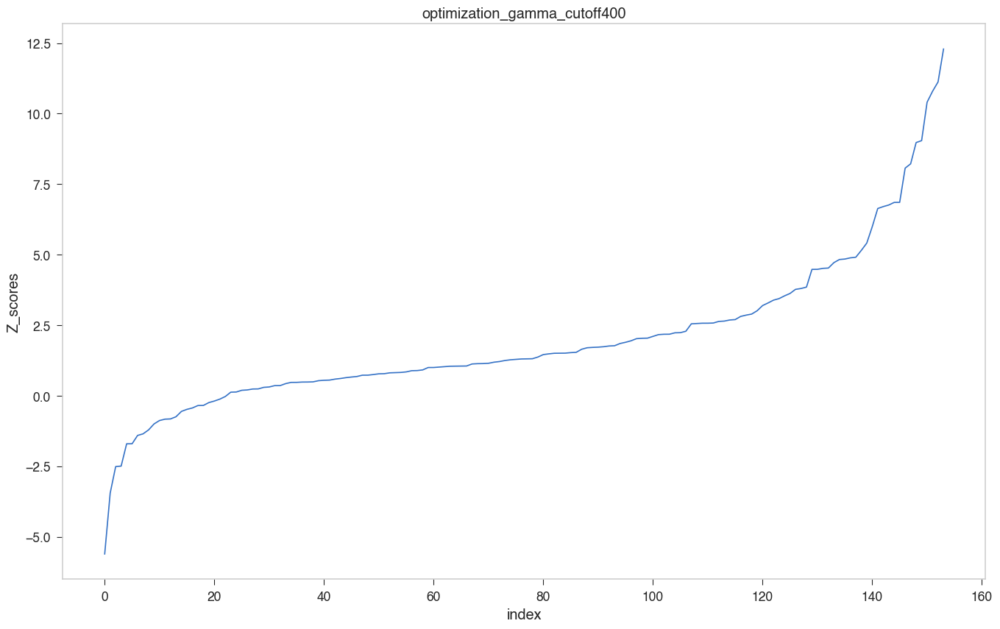

In [189]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_iter2/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl_withoutBurial_iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_iter2_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial//iter_larger_excl_withoutBurial_30
0 7.227706668879872
/Users/weilu/Research/data/optimization_2020_larger_excl_withoutBurial_400_larger_excl_withoutBurial.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

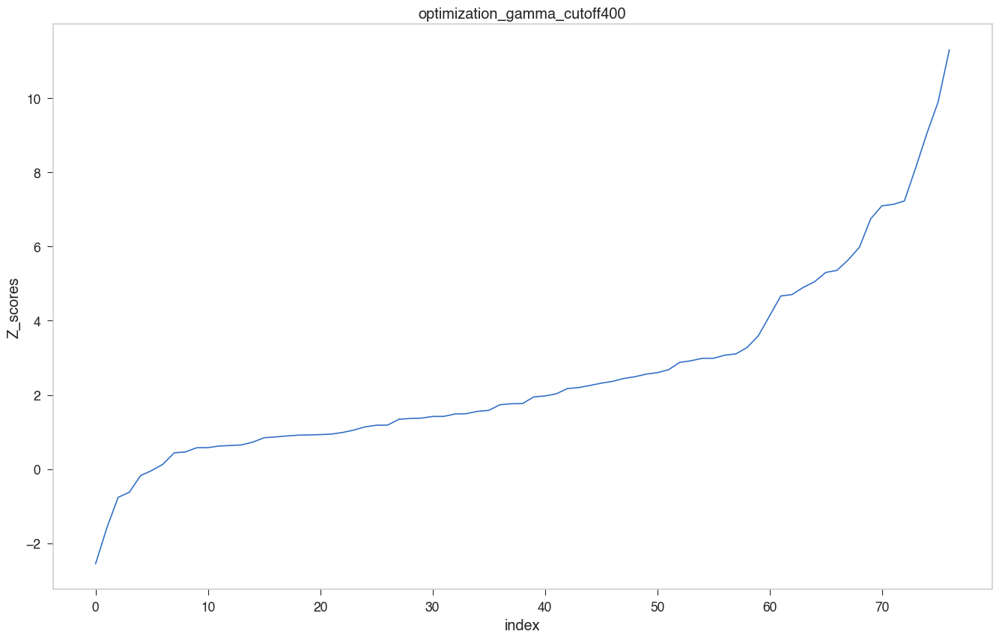

In [209]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl_withoutBurial"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [211]:
data_mix = data

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial//saved_gammas/larger_excl_withoutBurial_cutoff400_impose_Aprime_constraint
0 15.565954227869998
/Users/weilu/Research/data/optimization_2020_larger_excl_withoutBurial_400_larger_excl_withoutBurial.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

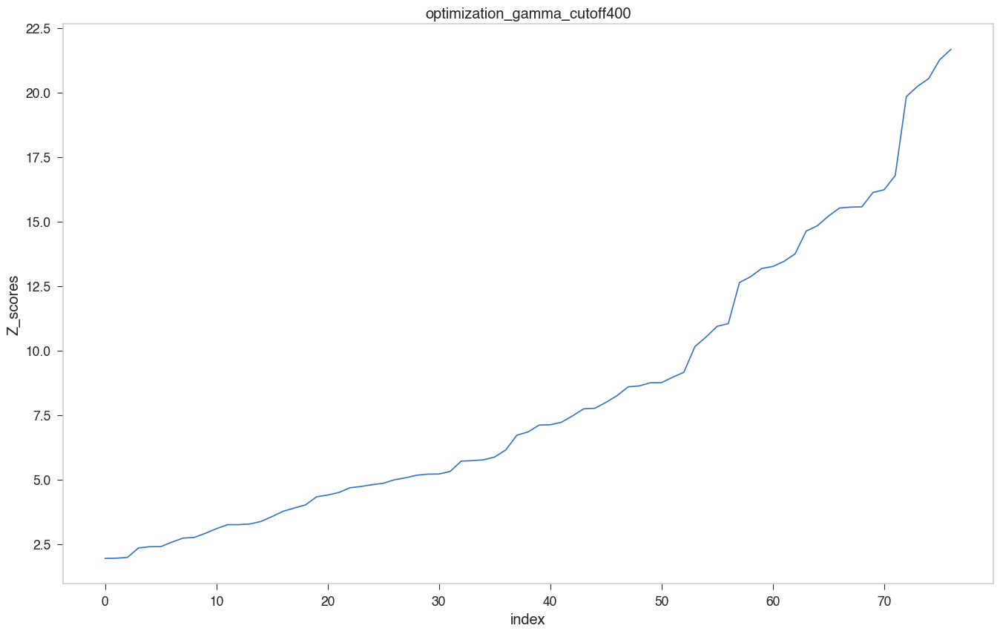

In [212]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl_withoutBurial"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [213]:
data_cutoff400 = data

/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630
0 -1.6770547577200425
/Users/weilu/Research/data/optimization_2020_larger_excl_withoutBurial_400_larger_excl_withoutBurial.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

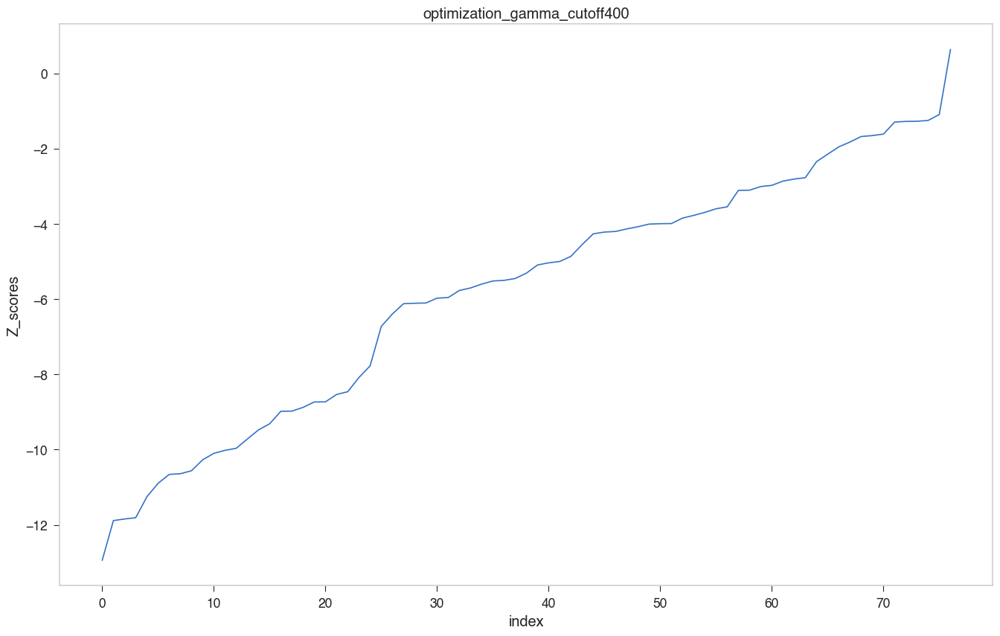

In [215]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl_withoutBurial"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [216]:
data_iter0 = data

In [217]:
data_mix.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1vcc_iteration_0_stronger_exclude_volume,-2.548605,-80.319656,-89.216588,3.490903
1,1,1osa_iteration_0_stronger_exclude_volume,-1.585598,-85.609842,-97.921399,7.764612
2,2,1cpq_iteration_0_stronger_exclude_volume,-0.761644,-95.168170,-97.947669,3.649342
3,3,2sak_iteration_0_stronger_exclude_volume,-0.624884,-119.107179,-124.742398,9.018021
4,4,3chy_iteration_0_stronger_exclude_volume,-0.175795,-132.678162,-133.403404,4.125486


In [218]:
data.query("Protein == '1vcc_iteration_0_stronger_exclude_volume'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
46,46,1vcc_iteration_0_stronger_exclude_volume,-4.200283,-37.933451,-81.807235,10.445436


In [219]:
data_cutoff400.query("Protein == '1vcc_iteration_0_stronger_exclude_volume'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
13,13,1vcc_iteration_0_stronger_exclude_volume,3.280097,-179.220801,-106.505078,22.168773


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial_debug//saved_gammas/larger_excl_withoutBurial_cutoff400_impose_Aprime_constraint
0 4.864957759315939
/Users/weilu/Research/data/optimization_2020_larger_excl_withoutBurial_400_larger_excl_withoutBurial.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

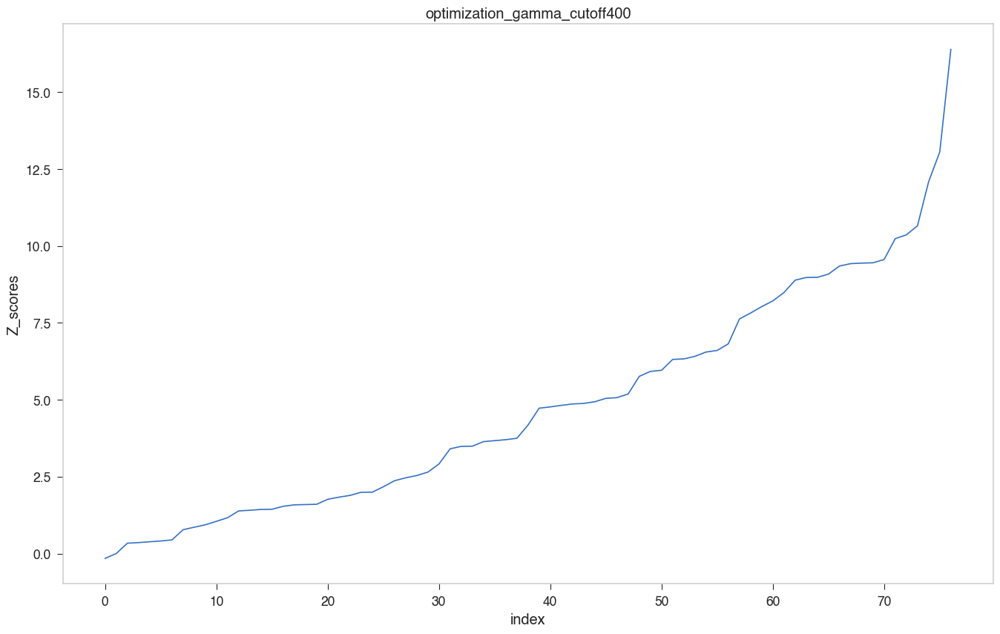

In [222]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial_debug/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl_withoutBurial"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [221]:
81*0.7+106*0.3

88.5

In [206]:
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"
# gamma = np.loadtxt(gamma_file_name)
# first630 = gamma[:630]
# np.savetxt("/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630", first630)

/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630
0 -1.6770547577200425
/Users/weilu/Research/data/optimization_2020_larger_excl_withoutBurial_400_larger_excl_withoutBurial.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

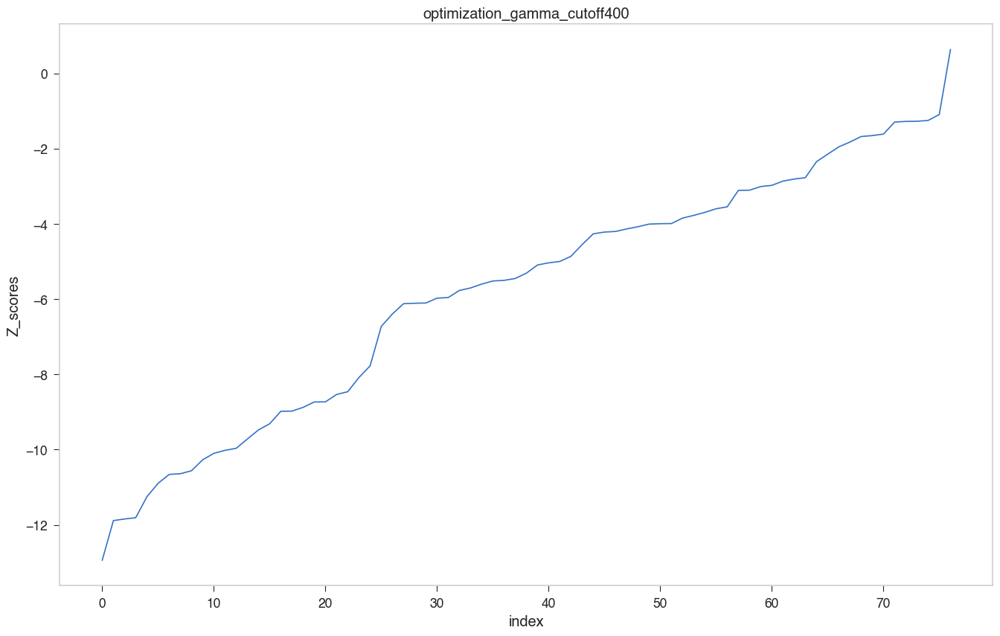

In [207]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl_withoutBurial"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint_first630"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [208]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,3chy_iteration_0_stronger_exclude_volume,-12.938215,-95.711730,-162.763751,5.182479
1,1,1ax8_iteration_0_stronger_exclude_volume,-11.885834,-97.420487,-142.638290,3.804344
2,2,1bb9_iteration_0_stronger_exclude_volume,-11.844724,-30.655840,-90.689416,5.068381
3,3,1hmt_iteration_0_stronger_exclude_volume,-11.810063,-38.879623,-116.841879,6.601341
4,4,1bfg_iteration_0_stronger_exclude_volume,-11.254175,-64.215462,-173.298274,9.692653


In [199]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1vcc_iteration_0_stronger_exclude_volume,-2.548605,-80.319656,-89.216588,3.490903
1,1,1osa_iteration_0_stronger_exclude_volume,-1.585598,-85.609842,-97.921399,7.764612
2,2,1cpq_iteration_0_stronger_exclude_volume,-0.761644,-95.168170,-97.947669,3.649342
3,3,2sak_iteration_0_stronger_exclude_volume,-0.624884,-119.107179,-124.742398,9.018021
4,4,3chy_iteration_0_stronger_exclude_volume,-0.175795,-132.678162,-133.403404,4.125486


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial//iter_larger_excl_withoutBurial_30
0 6.56250263976306
/Users/weilu/Research/data/optimization_2020_larger_excl_withoutBurial_400_larger_excl_withoutBurial.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

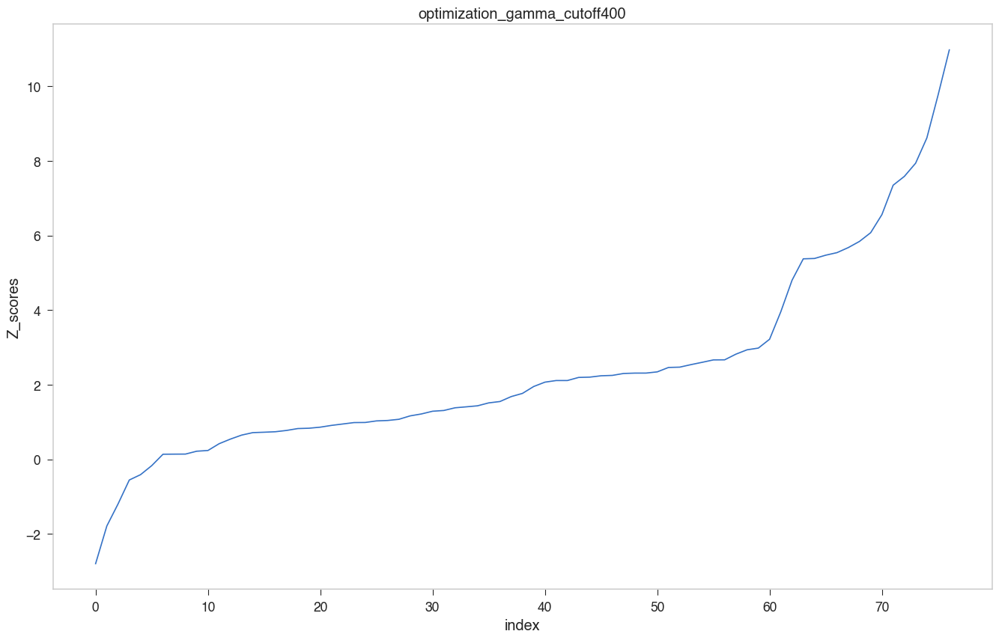

In [187]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl_withoutBurial"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_larger_excl_withoutBurial_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [188]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1vcc_iteration_0_stronger_exclude_volume,-2.793355,-70.065988,-80.541830,3.750273
1,1,1osa_iteration_0_stronger_exclude_volume,-1.783393,-79.891367,-92.425395,7.028190
2,2,3chy_iteration_0_stronger_exclude_volume,-1.191489,-124.587948,-129.125902,3.808641
3,3,2sak_iteration_0_stronger_exclude_volume,-0.550874,-111.834587,-116.634057,8.712464
4,4,1cpq_iteration_0_stronger_exclude_volume,-0.408025,-94.598620,-96.058473,3.577853


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl//iter_larger_excl_30
0 6.522567674615555
/Users/weilu/Research/data/optimization_2020_larger_excl_400_larger_excl.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

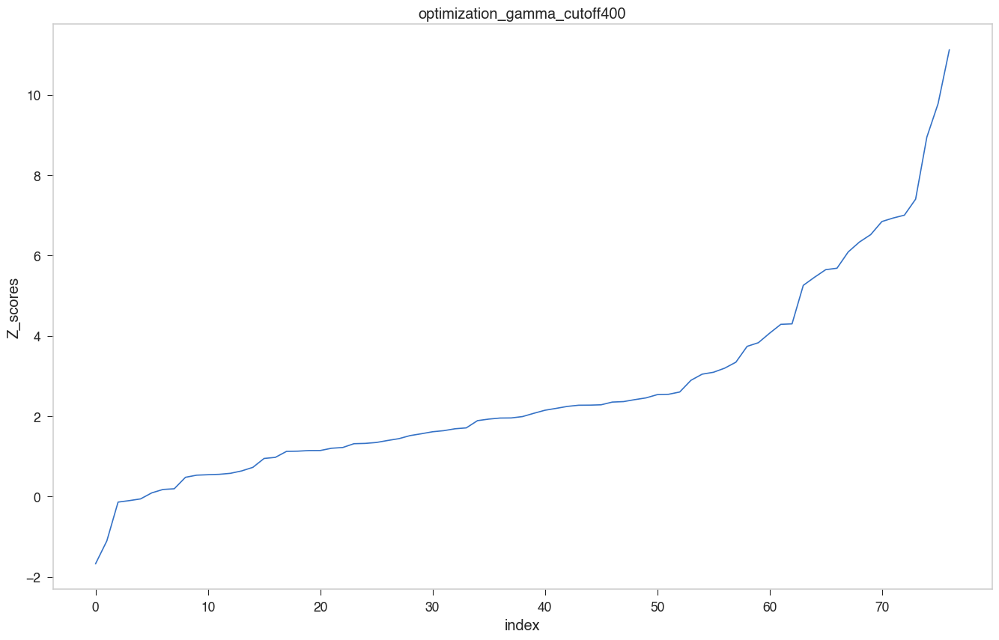

In [180]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_larger_excl_30"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint
0 -0.38294034938049515
/Users/weilu/Research/data/optimization_2020_larger_excl_400_larger_excl.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

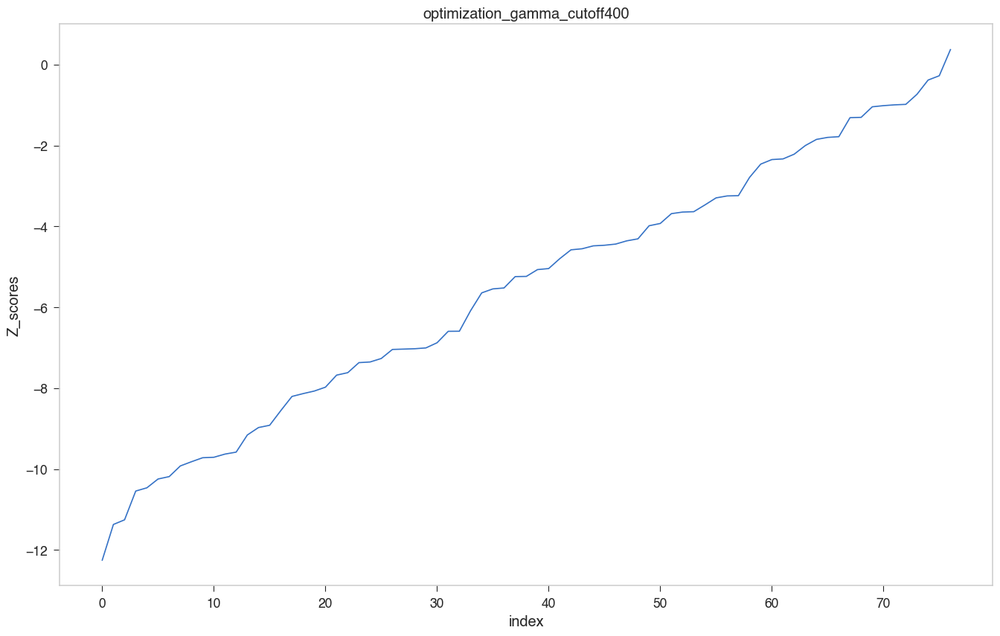

In [177]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [178]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1bfg_iteration_0_stronger_exclude_volume,-12.250238,-170.508874,-284.431495,9.299625
1,1,1ax8_iteration_0_stronger_exclude_volume,-11.368463,-246.973548,-294.521055,4.182404
2,2,1bb9_iteration_0_stronger_exclude_volume,-11.253736,-99.128084,-160.979994,5.496122
3,3,1opc_iteration_0_stronger_exclude_volume,-10.542433,-144.032758,-198.512493,5.167662
4,4,1dun_iteration_0_stronger_exclude_volume,-10.462417,-180.930922,-226.748602,4.379263


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial//saved_gammas/larger_excl_withoutBurial_cutoff300_impose_Aprime_constraint
0 11.721083353779521
/Users/weilu/Research/data/optimization_2020_larger_excl_withoutBurial_300_larger_excl_withoutBurial.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

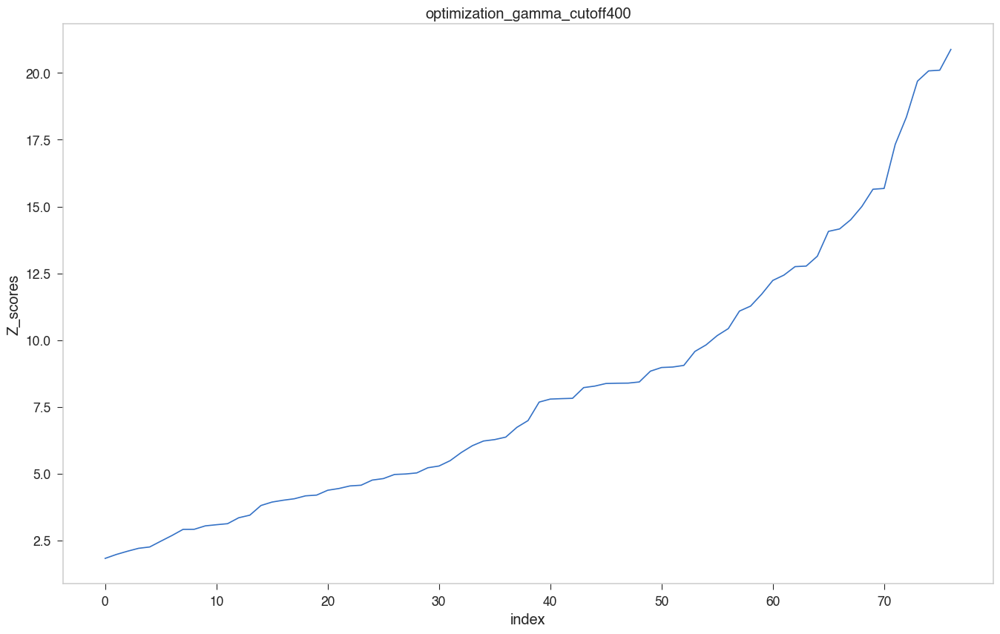

In [186]:

cutoff = 300
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl_withoutBurial/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl_withoutBurial"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl//saved_gammas/larger_excl_cutoff400_impose_Aprime_constraint
0 10.689535107838601
/Users/weilu/Research/data/optimization_2020_larger_excl_400_larger_excl.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

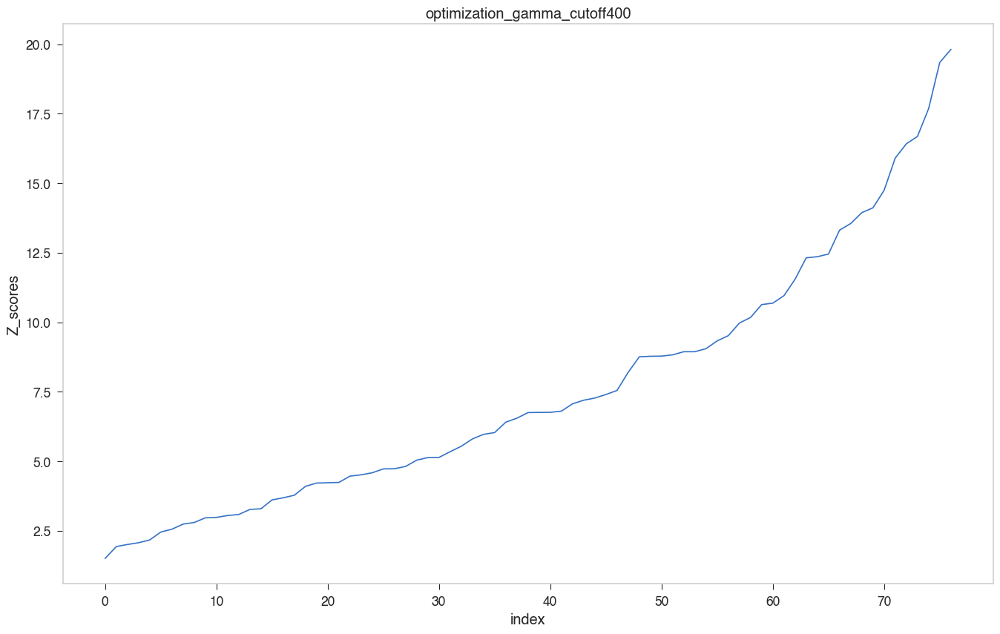

In [182]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [183]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1by9_iteration_0_stronger_exclude_volume,1.512467,-259.781314,-199.505138,39.852873
1,1,1pdo_iteration_0_stronger_exclude_volume,1.937102,-329.454576,-159.118413,87.933490
2,2,1akr_iteration_0_stronger_exclude_volume,2.011465,-335.847703,-161.774278,86.540605
3,3,3pyp_iteration_0_stronger_exclude_volume,2.075005,-387.340374,-198.037106,91.230255
4,4,1bm8_iteration_0_stronger_exclude_volume,2.174403,-305.425406,-165.553893,64.326410


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl//saved_gammas/larger_excl_cutoff400_impose_Aprime_constraint
0 12.02774216518557
/Users/weilu/Research/data/optimization_2020_larger_excl_400_larger_excl.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

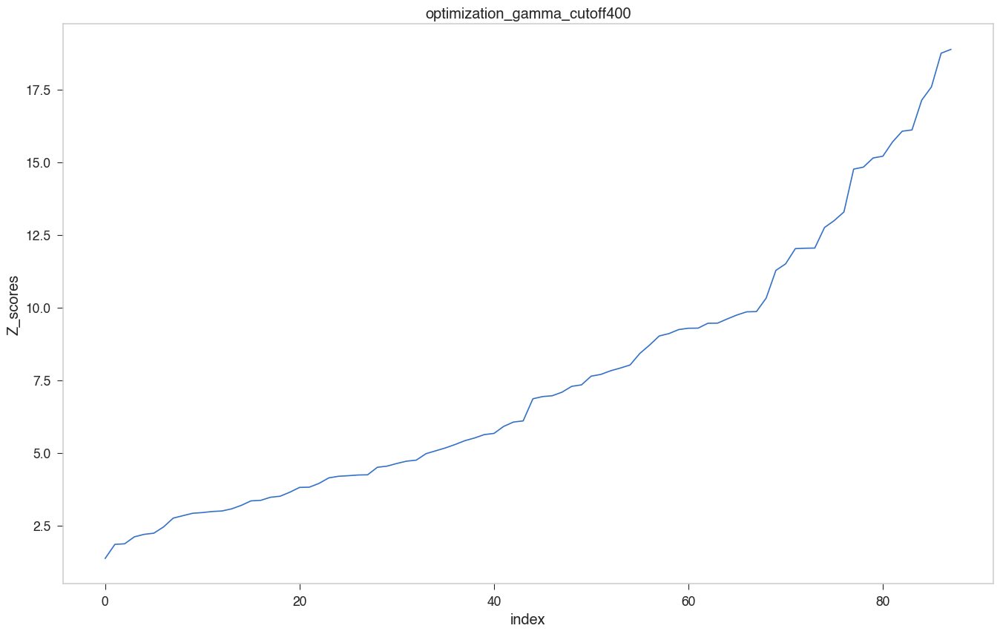

In [172]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_larger_excl/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "larger_excl"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_4//saved_gammas/new_4_cutoff600_impose_Aprime_constraint
0 1.4218388408145284
/Users/weilu/Research/data/optimization_2020_new_4_600_new_4.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

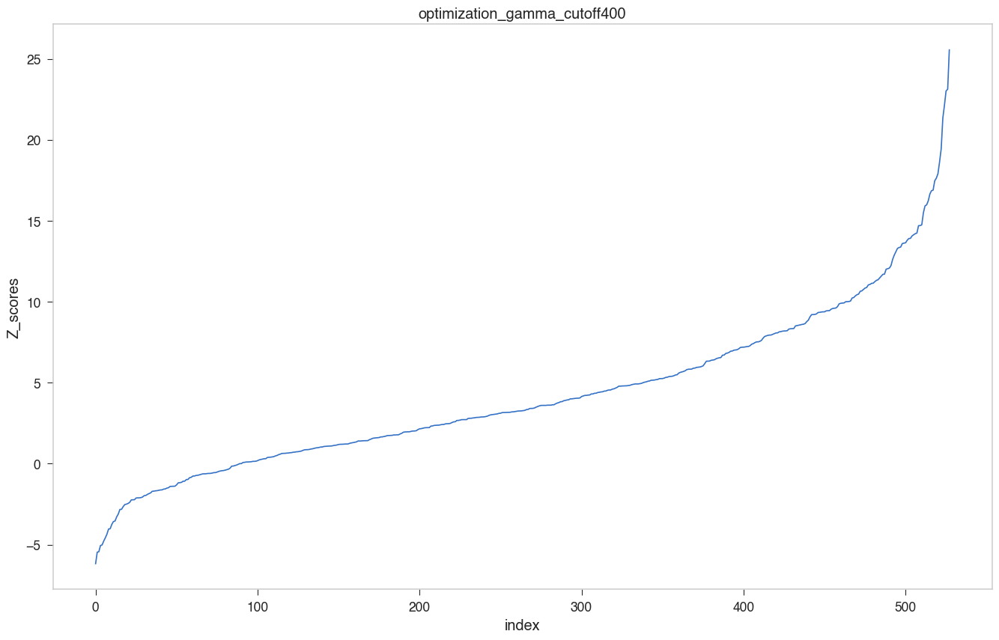

In [161]:

cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_4/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "new_4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

Text(0.5, 1.0, 'optimization_gamma_cutoff400')

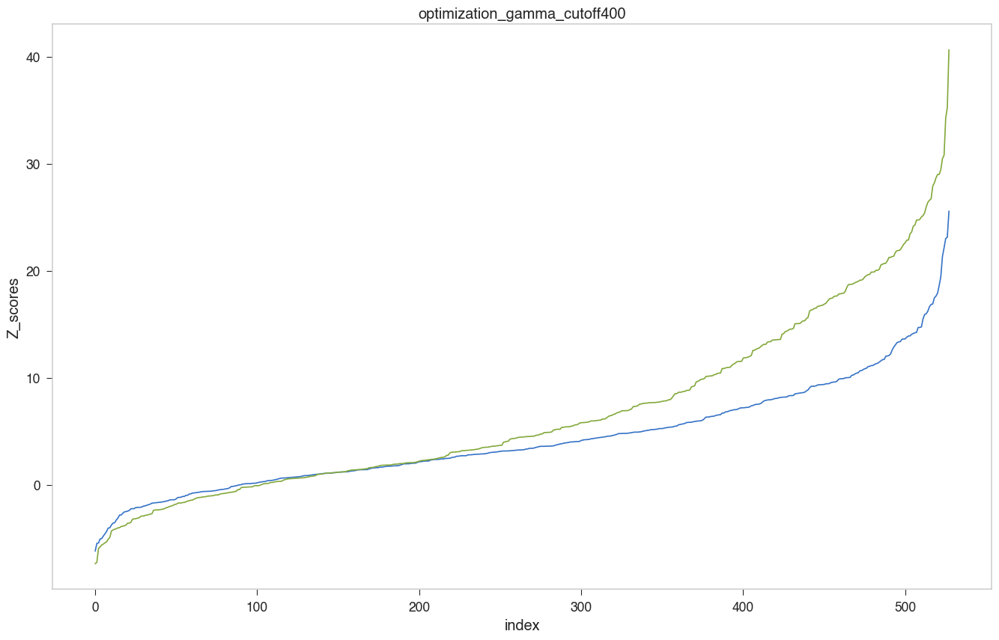

In [162]:
sns.lineplot("index", "Z_scores", data=data)
sns.lineplot("index", "Z_scores", data=data_new_4)

plt.title("optimization_gamma_cutoff400")

In [170]:
data.query("Z_scores < 0")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,3lzt_iteration_0_cbd,-6.174898,-189.989650,-253.631359,10.306520
1,1,2pii_iteration_0_cbd,-5.466234,-112.559913,-144.073971,5.765223
2,2,1osa_iteration_new_3,-5.437884,-124.285369,-160.122081,6.590194
3,3,1rie_iteration_0_cbd,-5.055980,-184.462504,-222.257836,7.475372
4,4,1rlw_iteration_new_3,-5.017679,-167.130986,-216.966820,9.932050
5,5,1kpf_iteration_new_3,-4.782946,-178.737843,-212.118105,6.979017
6,6,1opy_iteration_new_3,-4.578770,-202.045476,-233.446824,6.858031
7,7,1tif_iteration_0_cbd,-4.351672,-84.730672,-110.697883,5.967180
8,8,1dhn_iteration_new_3,-4.037218,-113.692896,-139.339849,6.352630
9,9,1ctj_iteration_0_cbd,-4.018594,-99.923668,-123.736263,5.925603


In [163]:
data.query("Protein == '1poc_iteration_1_cbd'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
527,527,1poc_iteration_1_cbd,25.558382,-236.608552,-88.328823,5.801609


In [157]:
data.query("Protein == '1poc_iteration_1_cbd'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
523,523,1poc_iteration_1_cbd,12.402159,-240.171828,-165.898873,5.988712


In [158]:
data.query("Protein == '1rie_iteration_0_cbd'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
24,24,1rie_iteration_0_cbd,-2.943935,-184.892657,-205.623676,7.041941


In [164]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,3lzt_iteration_0_cbd,-6.174898,-189.989650,-253.631359,10.306520
1,1,2pii_iteration_0_cbd,-5.466234,-112.559913,-144.073971,5.765223
2,2,1osa_iteration_new_3,-5.437884,-124.285369,-160.122081,6.590194
3,3,1rie_iteration_0_cbd,-5.055980,-184.462504,-222.257836,7.475372
4,4,1rlw_iteration_new_3,-5.017679,-167.130986,-216.966820,9.932050


In [159]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1poa_iteration_1_cbd,-11.582551,-168.010990,-246.212972,6.751706
1,1,1vls_iteration_1_cbd,-9.994652,-175.286384,-242.113277,6.686265
2,2,3lzt_iteration_1_cbd,-6.633985,-187.827477,-243.570820,8.402693
3,3,1vls_iteration_2_cbd,-6.301276,-175.286384,-205.721780,4.830037
4,4,451c_iteration_2_cbd,-6.298637,-100.745110,-122.326384,3.426340


In [165]:
data_new_4.query("Protein == '2pii_iteration_0_cbd'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
4,4,2pii_iteration_0_cbd,-5.621942,-132.69096,-178.421288,8.134259


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_4//saved_gammas/new_4_cutoff600_impose_Aprime_constraint
0 1.1107098759322158
/Users/weilu/Research/data/optimization_2020_new_4_600_new_4.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

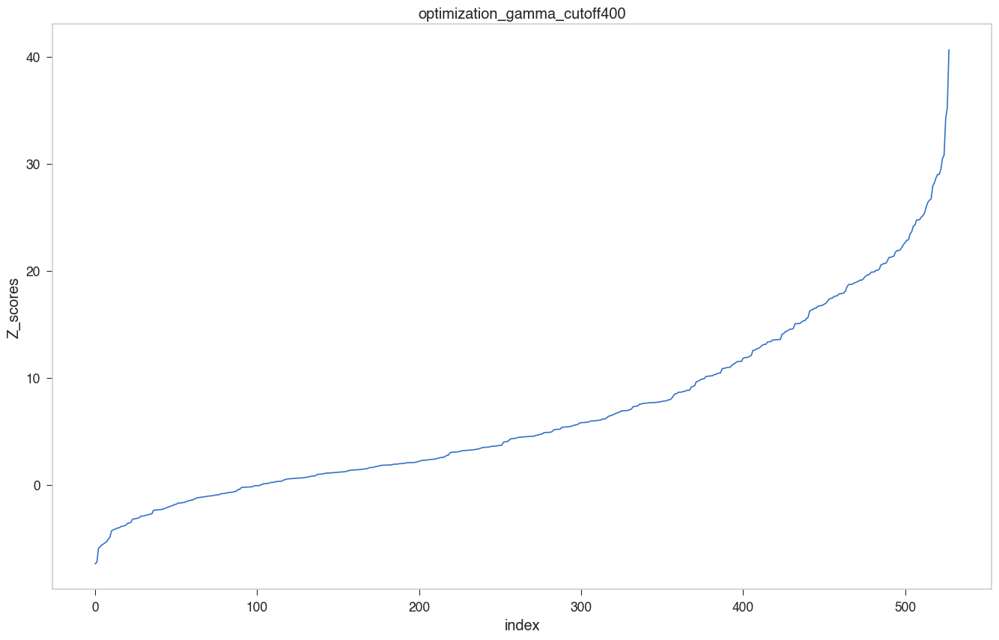

In [150]:

cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_4/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "new_4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [152]:
data_new_4 = data

In [153]:
data_new_4

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1rie_iteration_0_cbd,-7.364311,-189.791948,-249.979243,8.172835
1,1,3lzt_iteration_0_cbd,-7.245170,-200.730214,-279.185783,10.828672
2,2,1rlw_iteration_new_3,-5.951108,-180.800092,-232.846066,8.745594
3,3,1osa_iteration_new_3,-5.790611,-145.476124,-187.654673,7.283955
4,4,2pii_iteration_0_cbd,-5.621942,-132.690960,-178.421288,8.134259
5,5,1tif_iteration_0_cbd,-5.533986,-93.829318,-131.168128,6.747182
6,6,1ctj_iteration_0_cbd,-5.410743,-105.609675,-139.739171,6.307728
7,7,1b6e_iteration_0_cbd,-5.330704,-209.032169,-271.540384,11.726072
8,8,1opy_iteration_new_3,-5.076672,-214.557928,-252.186657,7.412086
9,9,1kpf_iteration_new_3,-4.923968,-193.954332,-231.846249,7.695403


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_4//saved_gammas/new_4_cutoff600_impose_Aprime_constraint
0 -3.5229100324861733
/Users/weilu/Research/data/optimization_2020_new_4_600_new_4.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

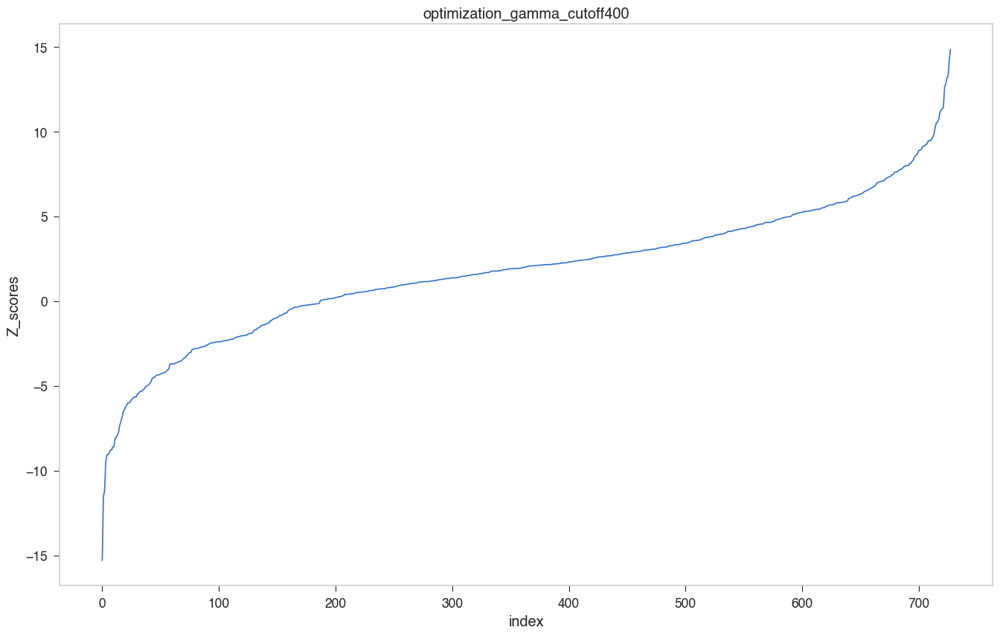

In [149]:

cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_4/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "new_4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_3//saved_gammas/new_3_cutoff600_impose_Aprime_constraint
0 -3.37435710370785
/Users/weilu/Research/data/optimization_2020_new_3_600_new_3.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

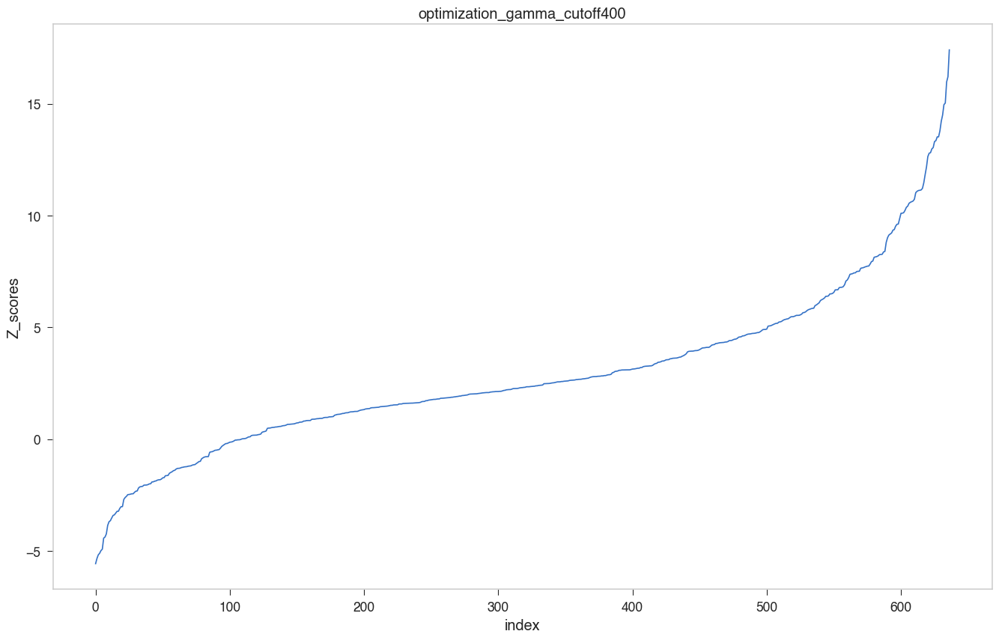

In [141]:

cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_3/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "new_3"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_3//saved_gammas/new_3_cutoff600_impose_Aprime_constraint
0 -2.5077857554834773
/Users/weilu/Research/data/optimization_2020_new_3_600_new_3.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

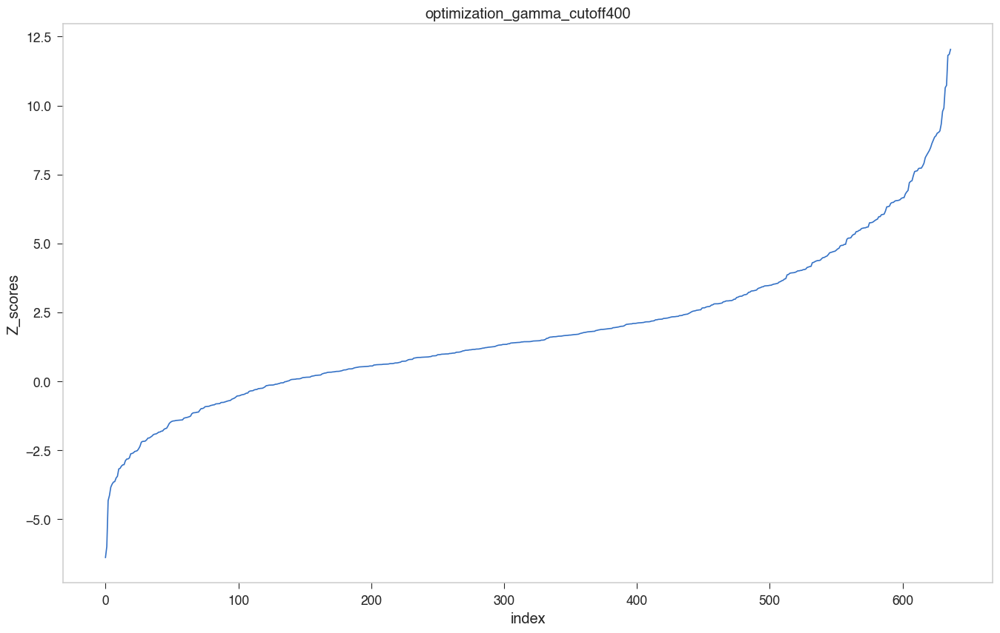

In [137]:

cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_3/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "new_3"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [140]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,3cyr_iteration_new_1,-6.384755,-117.554340,-145.343822,4.352474
1,1,1b6e_iteration_new_2,-5.987415,-190.273693,-223.442963,5.539832
2,2,2sns_iteration_start_native,-4.321739,-85.346672,-116.491555,7.206563
3,3,1aly_iteration_start_native,-4.135424,-221.925852,-255.748419,8.178742
4,4,3lzt_iteration_new_2,-3.835336,-193.453471,-221.566615,7.330034
5,5,1a32_iteration_start_native,-3.725371,-31.030167,-42.806077,3.161004
6,6,1b6e_iteration_start_native_iter5,-3.651715,-190.273693,-221.208422,8.471287
7,7,1cpq_iteration_start_native_iter2,-3.632026,-110.109330,-129.605714,5.367909
8,8,1cyo_iteration_start_native,-3.502140,-70.766256,-89.527067,5.356956
9,9,1ptf_iteration_start_native,-3.439938,-92.109901,-107.832514,4.570609


In [138]:
data.query("Protein == '3lzt_iteration_new_2'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
4,4,3lzt_iteration_new_2,-3.835336,-193.453471,-221.566615,7.330034


In [139]:
data.query("Protein == '1b6e_iteration_new_2'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
1,1,1b6e_iteration_new_2,-5.987415,-190.273693,-223.442963,5.539832


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_3//saved_gammas/new_3_cutoff600_impose_Aprime_constraint
0 -3.955315684461095
/Users/weilu/Research/data/optimization_2020_new_3_600_new_3.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

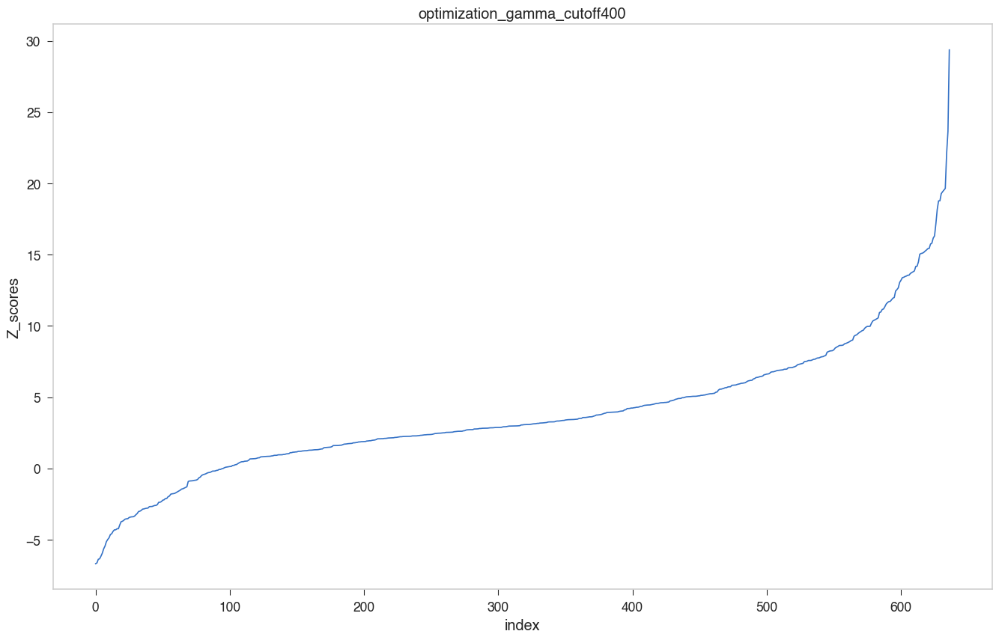

In [145]:

cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_new_3/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "new_3"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [133]:
data.query("Protein == '3lzt_iteration_new_2'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
112,112,3lzt_iteration_new_2,0.517881,-173.161939,-169.968091,6.167149


In [134]:
data.query("Protein == '1b6e_iteration_new_2'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
200,200,1b6e_iteration_new_2,1.895614,-187.629566,-177.997611,5.08118


In [147]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1osa_iteration_start_native,-6.673977,-142.615904,-192.978763,7.546154
1,1,1hmt_iteration_start_native,-6.621407,-154.496006,-219.722735,9.850887
2,2,1c52_iteration_start_native,-6.368557,-153.107186,-211.667309,9.195195
3,3,1aly_iteration_start_native,-6.331484,-268.608715,-338.320900,11.010403
4,4,1bfg_iteration_start_native,-6.144856,-241.209585,-319.058621,12.668976
5,5,1a32_iteration_start_native,-5.935863,-46.778471,-74.661750,4.697426
6,6,3chy_iteration_start_native,-5.634102,-167.769938,-217.609728,8.846093
7,7,1ax8_iteration_start_native,-5.441177,-256.056114,-304.918262,8.980070
8,8,2sns_iteration_start_native,-5.139721,-114.409158,-172.071856,11.219033
9,9,1cyo_iteration_start_native,-4.981977,-88.056485,-122.094538,6.832238


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter4//saved_gammas/native_iter4_cutoff600_impose_Aprime_constraint
0 -0.9194112222280356
/Users/weilu/Research/data/optimization_2020_native_iter4_600_native_iter4.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

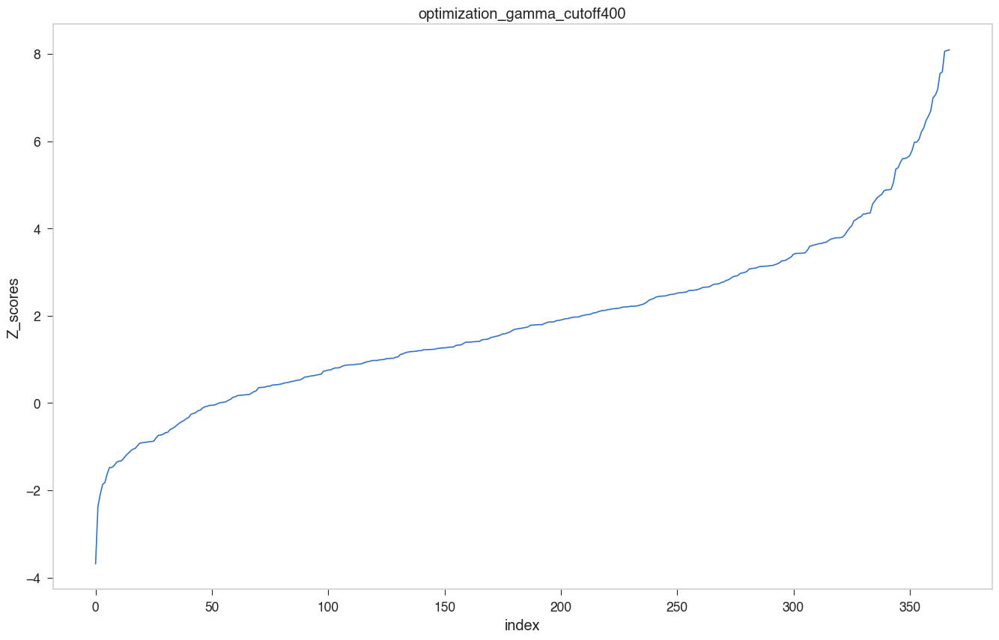

In [129]:

cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter4/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [130]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1hyp_iteration_new_1,-3.681214,-99.478618,-113.254451,3.742199
1,1,3cyr_iteration_new_1,-2.372362,-139.481886,-151.857381,5.216529
2,2,1fna_iteration_new_1,-2.092443,-111.440656,-120.734070,4.441418
3,3,1who_iteration_start_native_iter3,-1.867376,-136.609942,-145.131433,4.563350
4,4,1opy_iteration_new_1,-1.821169,-156.474772,-168.942079,6.845770
5,5,3cyr_iteration_start_native_iter3,-1.618455,-139.481886,-151.445423,7.391951
6,6,1ycc_iteration_new_1,-1.477388,-145.915859,-153.677797,5.253825
7,7,1ptf_iteration_start_native,-1.476549,-106.927148,-112.999828,4.112751
8,8,1vls_iteration_start_native,-1.432396,-98.998107,-105.490755,4.532719
9,9,1who_iteration_new_1,-1.358727,-136.609942,-147.072850,7.700524


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter4//saved_gammas/native_iter4_cutoff600_impose_Aprime_constraint
0 -0.8737983042472431
/Users/weilu/Research/data/optimization_2020_native_iter4_600_native_iter4.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

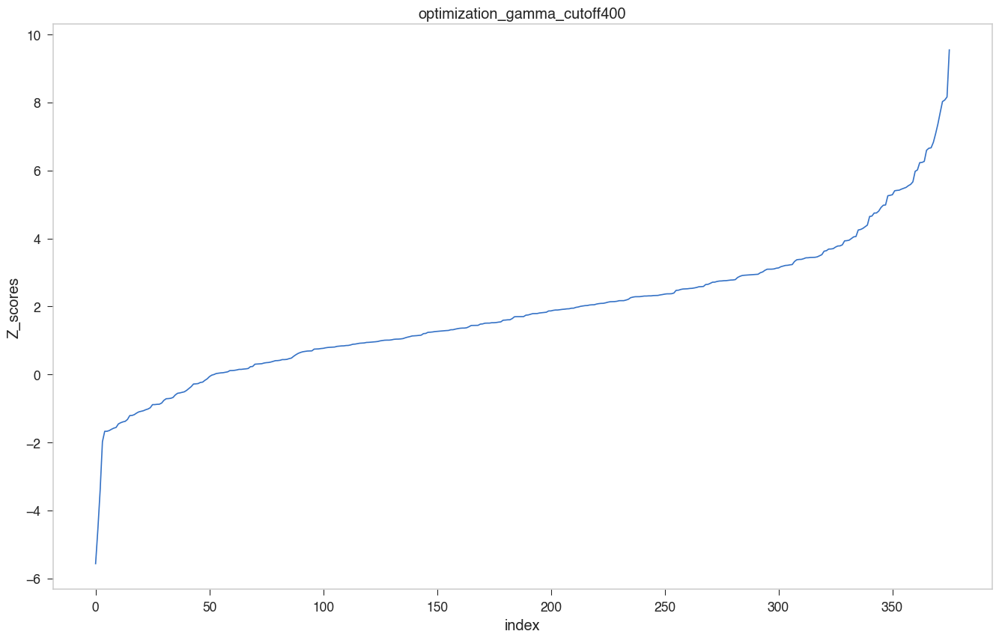

In [125]:

cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter4/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [126]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,2tgi_iteration_new_1,-5.563950,-113.701358,-142.965556,5.259609
1,1,1aqe_iteration_new_1,-4.547950,-158.726861,-181.441470,4.994472
2,2,1hyp_iteration_new_1,-3.401907,-94.085286,-105.555231,3.371622
3,3,1who_iteration_start_native_iter3,-1.976315,-133.198326,-142.068675,4.488328
4,4,1ptf_iteration_start_native,-1.670920,-105.415140,-112.241449,4.085360
5,5,1who_iteration_new_1,-1.669934,-133.198326,-145.035878,7.088633
6,6,2tgi_iteration_start_native_iter3,-1.648713,-113.701358,-128.556457,9.010118
7,7,1vls_iteration_start_native,-1.609922,-100.024022,-107.467138,4.623277
8,8,1ycc_iteration_new_1,-1.577451,-144.558322,-152.314837,4.917121
9,9,1cyo_iteration_start_native_iter3,-1.557569,-99.944389,-106.487055,4.200563


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter4//saved_gammas/native_iter4_cutoff600_impose_Aprime_constraint
0 -2.730070402949008
/Users/weilu/Research/data/optimization_2020_native_iter4_600_native_iter4.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

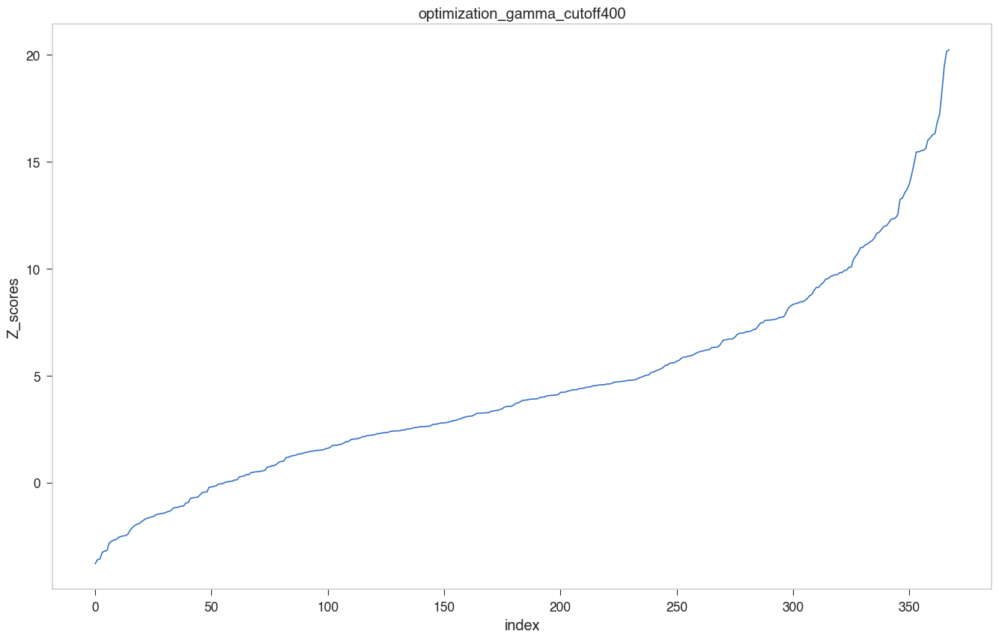

In [127]:

cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter4/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [128]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1a32_iteration_start_native,-3.778771,-36.394272,-52.289560,4.206471
1,1,1vls_iteration_start_native,-3.588665,-115.804501,-135.143269,5.388848
2,2,1ptf_iteration_start_native,-3.561445,-131.316060,-149.949136,5.231886
3,3,1tmy_iteration_start_native,-3.253596,-165.881415,-188.608980,6.985368
4,4,2sns_iteration_start_native,-3.191081,-135.169417,-159.091735,7.496620
5,5,1c52_iteration_start_native,-3.172566,-177.952466,-203.559159,8.071288
6,6,1hmt_iteration_start_native,-2.817995,-168.657235,-193.763709,8.909339
7,7,1baj_iteration_start_native,-2.730070,-54.860123,-71.534821,6.107791
8,8,1osa_iteration_start_native,-2.673893,-152.727533,-171.320758,6.953617
9,9,1div_iteration_start_native,-2.646140,-169.685850,-190.697806,7.940606


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter4//saved_gammas/native_iter4_cutoff600_impose_Aprime_constraint
0 -4.058934006879015
/Users/weilu/Research/data/optimization_2020_native_iter4_600_native_iter4.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

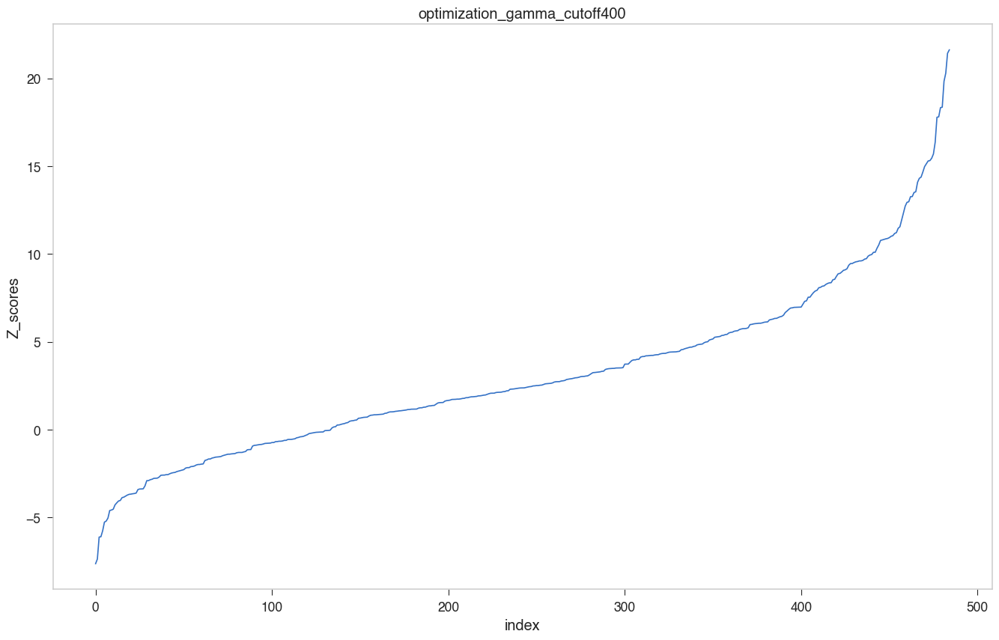

In [119]:

cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter4/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [120]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1msc_iteration_start_native,-7.626201,-143.637561,-190.502274,6.145224
1,1,1gvp_iteration_start_native,-7.363335,-112.365397,-152.306041,5.424260
2,2,1osa_iteration_start_native,-6.112889,-154.651542,-190.233899,5.820874
3,3,1fmb_iteration_start_native,-6.094050,-118.386663,-155.059707,6.017844
4,4,2sns_iteration_start_native,-5.755222,-121.151896,-155.847168,6.028486
5,5,1c52_iteration_start_native,-5.262011,-159.545561,-192.524063,6.267281
6,6,1a32_iteration_start_native,-5.203139,-47.786327,-67.808307,3.848058
7,7,2tgi_iteration_start_native_iter4,-5.031188,-109.089222,-146.998611,7.534878
8,8,1ptf_iteration_start_native,-4.600424,-113.197523,-134.188836,4.562908
9,9,1aqe_iteration_start_native_iter4,-4.572148,-143.692428,-164.800818,4.616734


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter4//saved_gammas/native_iter4_cutoff400_impose_Aprime_constraint
0 -3.7074774183189816
/Users/weilu/Research/data/optimization_2020_native_iter4_400_native_iter4.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

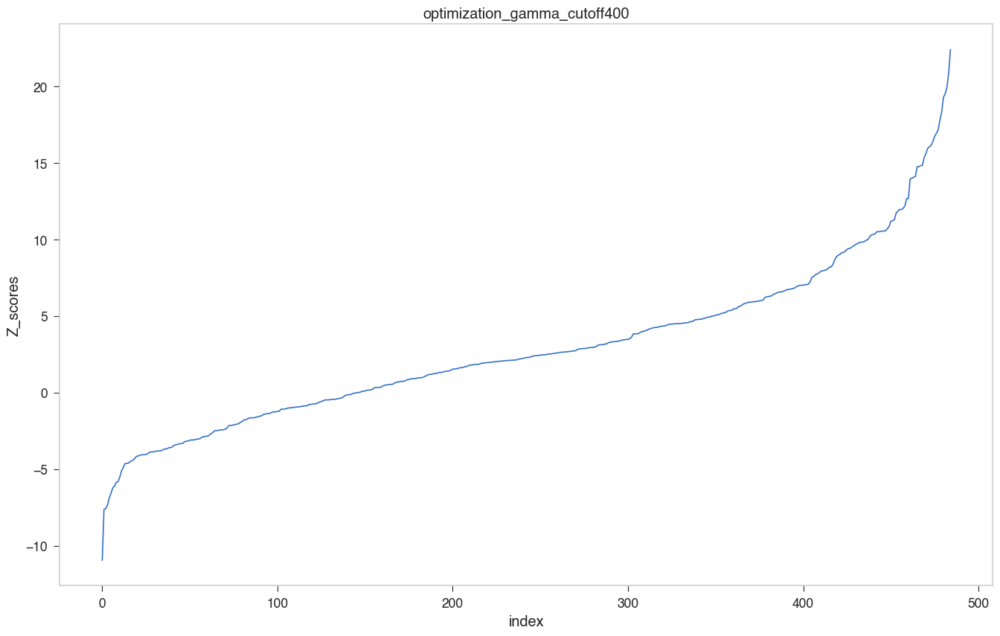

In [121]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter4/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [122]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1msc_iteration_start_native,-10.945211,-142.626833,-199.177701,5.166723
1,1,1fmb_iteration_start_native,-7.621452,-142.053027,-182.776463,5.343265
2,2,1osa_iteration_start_native,-7.587832,-148.746872,-185.699723,4.870014
3,3,1gvp_iteration_start_native,-7.348811,-111.111134,-150.562752,5.368436
4,4,1aqe_iteration_start_native_iter4,-6.881142,-128.497688,-154.604443,3.793957
5,5,1aqe_iteration_new_1,-6.581503,-128.497688,-150.093464,3.281283
6,6,1c52_iteration_start_native,-6.214210,-161.149231,-194.477150,5.363179
7,7,2sns_iteration_start_native,-6.115027,-136.010956,-168.935130,5.384142
8,8,1bfg_iteration_start_native,-5.855655,-177.706162,-223.846341,7.879594
9,9,1hmt_iteration_start_native,-5.831126,-169.826902,-207.241569,6.416371


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter3//saved_gammas/native_iter3_cutoff400_impose_Aprime_constraint
0 -0.8361222931774931
/Users/weilu/Research/data/optimization_2020_native_iter3_400_native_iter3.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

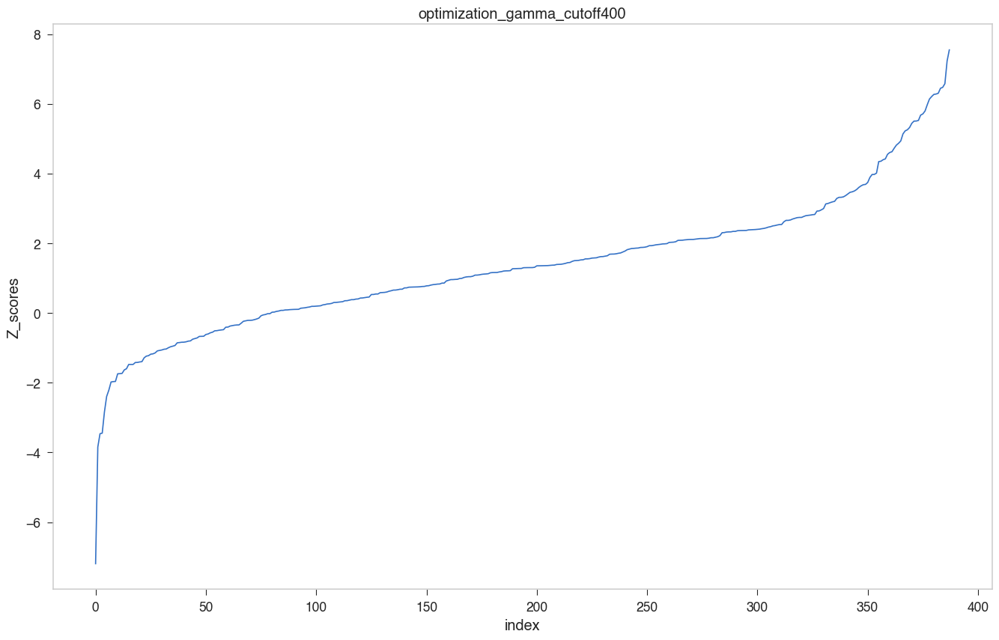

In [114]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter3/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter3"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [116]:
data.query("Protein == '1jon_iteration_new_1'")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
379,379,1jon_iteration_new_1,6.211819,-192.280252,-166.519739,4.147016


In [115]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1aqe_iteration_new_1,-7.191257,-138.398211,-169.144831,4.275556
1,1,1hyp_iteration_new_1,-3.844596,-97.335166,-107.827239,2.729045
2,2,2tgi_iteration_new_1,-3.462878,-117.252458,-133.222443,4.611766
3,3,3cyr_iteration_new_1,-3.446247,-123.003588,-138.189476,4.406500
4,4,1aqe_iteration_start_native_iter3,-2.839254,-138.398211,-161.000045,7.960483
5,5,1vls_iteration_start_native,-2.394256,-110.537474,-119.968880,3.939180
6,6,1pne_iteration_new_1,-2.212344,-181.699831,-199.235709,7.926380
7,7,3cyr_iteration_start_native_iter3,-1.978679,-123.003588,-134.902967,6.013799
8,8,1ycc_iteration_new_1,-1.967488,-137.275503,-146.112547,4.491537
9,9,1tul_iteration_start_native_iter3,-1.962513,-126.927505,-135.910591,4.577338


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter3//saved_gammas/native_iter3_cutoff400_impose_Aprime_constraint
0 -2.51088949772391
/Users/weilu/Research/data/optimization_2020_native_iter3_400_native_iter3.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

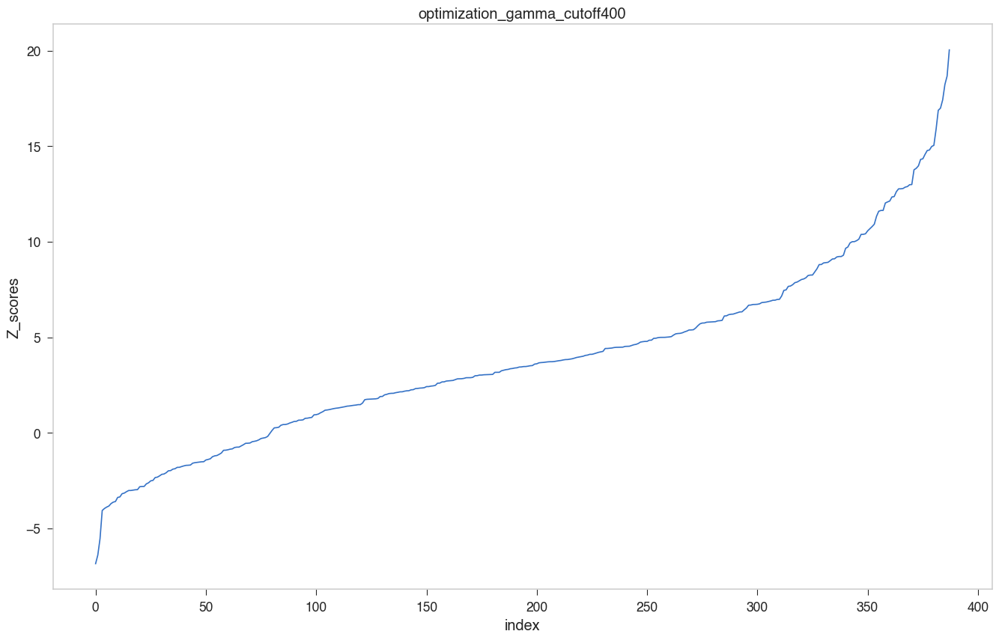

In [112]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter3/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter3"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [113]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1msc_iteration_start_native,-6.845241,-159.817154,-207.805184,7.010422
1,1,1gvp_iteration_start_native,-6.394332,-125.013453,-159.258678,5.355559
2,2,1fmb_iteration_start_native,-5.542375,-152.709567,-186.953999,6.178656
3,3,1vls_iteration_start_native,-4.062062,-124.846401,-143.703932,4.642355
4,4,1rie_iteration_start_native,-3.959594,-170.186568,-196.913989,6.750041
5,5,1c52_iteration_start_native,-3.885508,-172.041641,-197.060860,6.439111
6,6,1a32_iteration_start_native,-3.830180,-55.758789,-69.442444,3.572588
7,7,1ptf_iteration_start_native,-3.701287,-135.851382,-153.379105,4.735575
8,8,2sns_iteration_start_native,-3.625428,-148.814247,-171.276308,6.195700
9,9,1tmy_iteration_start_native,-3.592424,-175.623728,-198.788964,6.448358


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter3//saved_gammas/native_iter3_cutoff400_impose_Aprime_constraint
0 -2.963763905743027
/Users/weilu/Research/data/optimization_2020_native_iter3_400_native_iter3.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

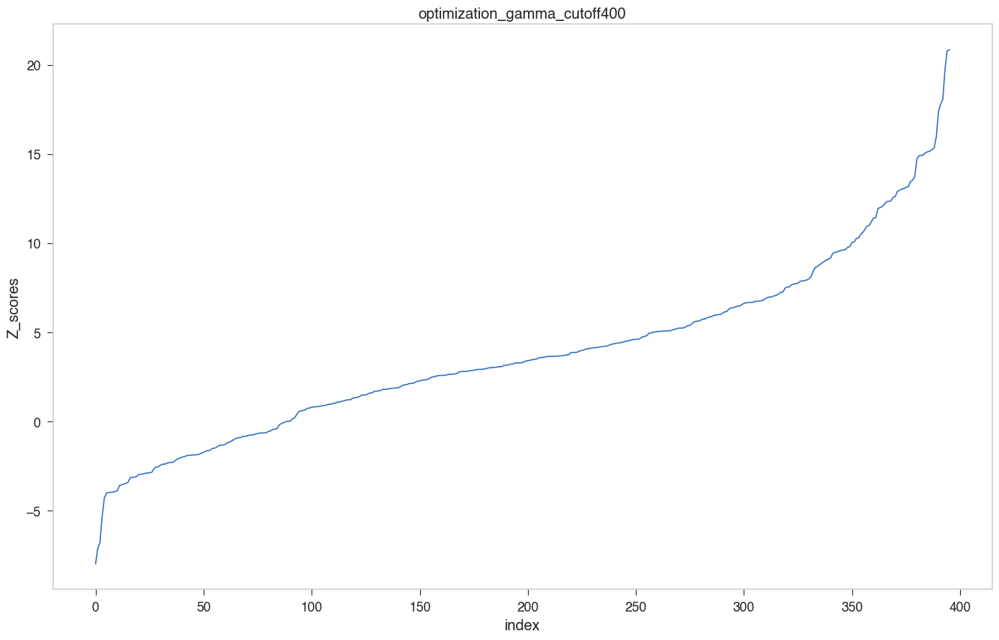

In [110]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter3/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter3"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2//iter_native_iter2_90
0 0.5859501785289644
/Users/weilu/Research/data/optimization_2020_native_iter2_400_native_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

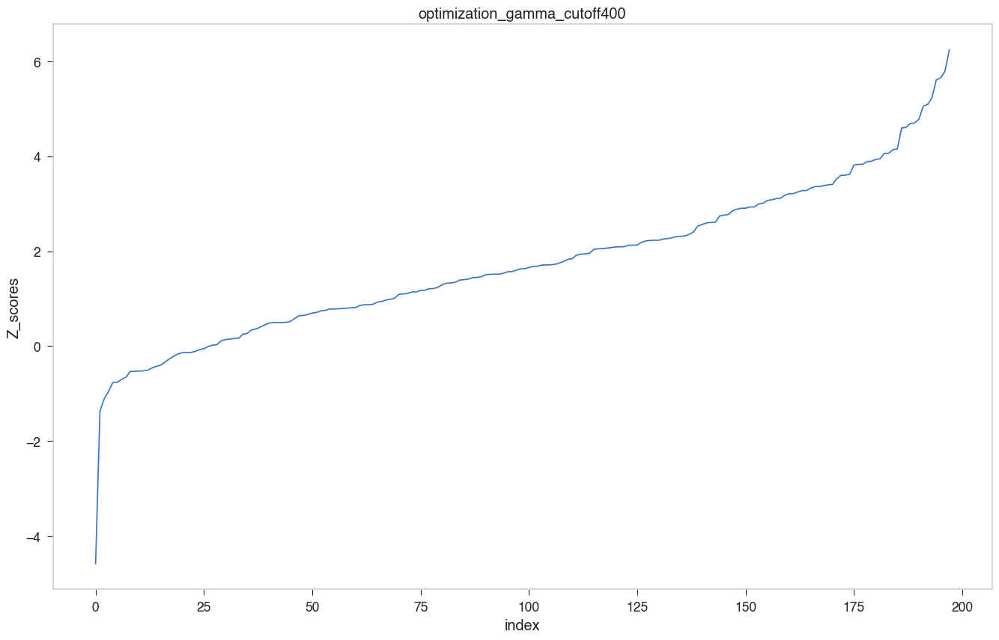

In [109]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter2"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_native_iter2_90"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2//saved_gammas/native_iter2_cutoff400_impose_Aprime_constraint
0 1.0869777346260419
/Users/weilu/Research/data/optimization_2020_native_iter2_400_native_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

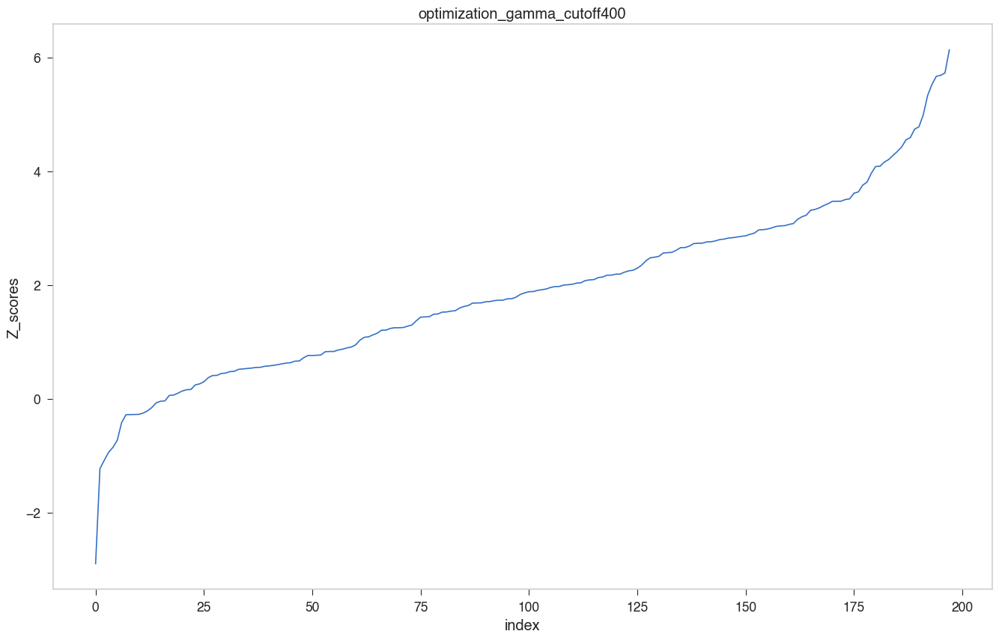

In [104]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_10"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [105]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1aqe_iteration_start_native,-2.900436,-206.654384,-223.623353,5.850488
1,1,1puc_iteration_start_native_iter2,-1.231197,-136.869446,-143.638446,5.497904
2,2,1erv_iteration_start_native_iter2,-1.083518,-179.075715,-186.865289,7.189151
3,3,1baj_iteration_start_native_iter2,-0.942464,-88.701213,-94.689558,6.353926
4,4,1hoe_iteration_start_native,-0.855845,-121.758837,-126.202669,5.192330
5,5,2acy_iteration_start_native_iter2,-0.731340,-149.588186,-153.784844,5.738312
6,6,1by9_iteration_start_native_iter2,-0.421881,-93.976439,-96.035926,4.881677
7,7,1ptf_iteration_start_native,-0.282397,-118.700632,-120.067508,4.840264
8,8,1rie_iteration_start_native,-0.280254,-181.610574,-184.195930,9.225049
9,9,1pne_iteration_start_native_iter2,-0.277417,-220.679623,-223.350737,9.628526


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2//saved_gammas/native_iter2_cutoff400_impose_Aprime_constraint
0 1.5528395125166703
/Users/weilu/Research/data/optimization_2020_native_iter2_400_native_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

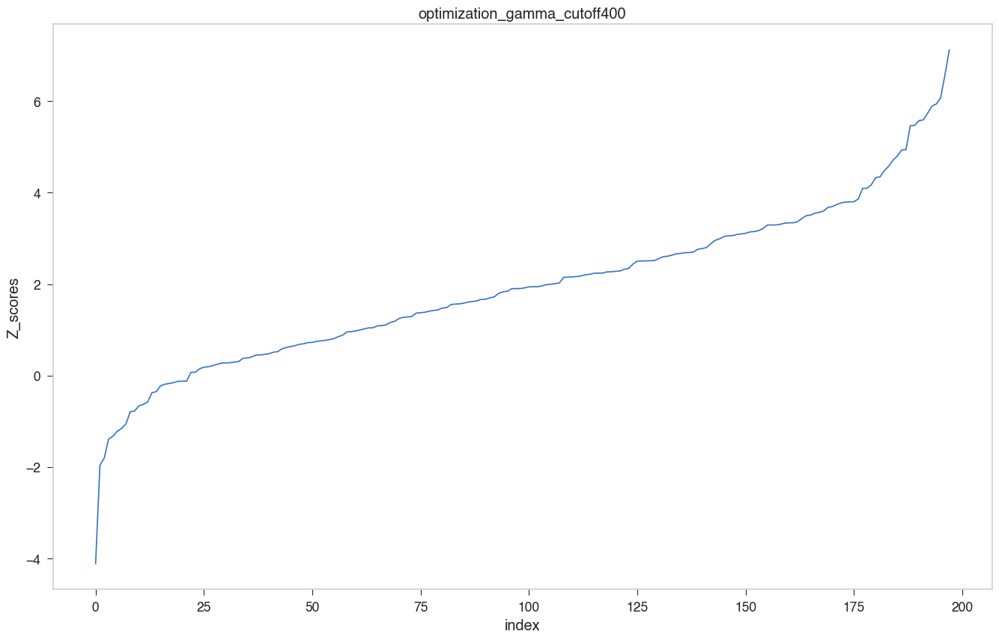

In [102]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_10"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [103]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1aqe_iteration_start_native,-4.112402,-218.629287,-246.346032,6.739795
1,1,1puc_iteration_start_native_iter2,-1.959736,-131.298680,-143.096435,6.020074
2,2,1erv_iteration_start_native_iter2,-1.800179,-184.958747,-198.202734,7.357039
3,3,1hoe_iteration_start_native,-1.385277,-133.425422,-140.873823,5.376830
4,4,1pne_iteration_start_native_iter2,-1.327376,-219.733278,-231.405015,8.793092
5,5,1rcb_iteration_start_native_iter2,-1.215793,-165.733559,-175.433719,7.978460
6,6,1by9_iteration_start_native_iter2,-1.156731,-97.285182,-103.285705,5.187485
7,7,1baj_iteration_start_native_iter2,-1.056842,-90.552438,-98.361935,7.389464
8,8,1div_iteration_start_native_iter2,-0.792376,-149.198576,-157.181212,10.074302
9,9,2acy_iteration_start_native_iter2,-0.774159,-148.773542,-153.280332,5.821532


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2//saved_gammas/native_iter2_cutoff400_impose_Aprime_constraint
0 2.4480032038497974
/Users/weilu/Research/data/optimization_2020_native_iter2_400_native_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

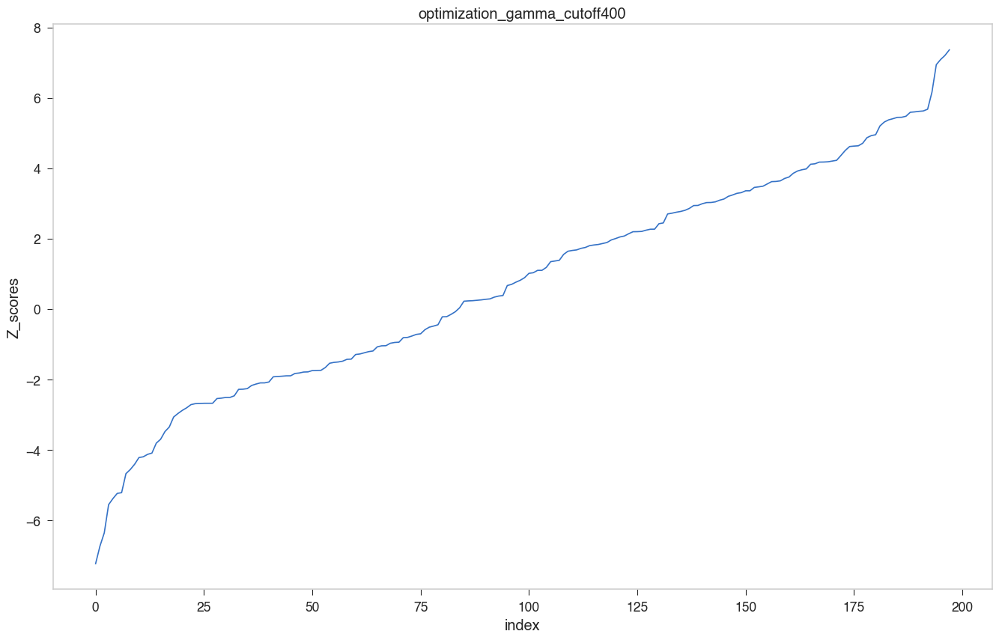

In [100]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_10"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [101]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1puc_iteration_start_native_iter2,-7.230001,-145.108865,-198.580562,7.395807
1,1,1pne_iteration_start_native_iter2,-6.732484,-206.343064,-275.974968,10.342676
2,2,1div_iteration_start_native_iter2,-6.355576,-109.013612,-168.657888,9.384559
3,3,1kte_iteration_start_native_iter2,-5.553535,-145.780419,-185.897399,7.223683
4,4,1ax8_iteration_start_native_iter2,-5.381045,-204.081041,-277.843583,13.707846
5,5,1erv_iteration_start_native_iter2,-5.233623,-193.533198,-237.393142,8.380416
6,6,1rcb_iteration_start_native_iter2,-5.213938,-178.585684,-239.828694,11.746018
7,7,1mai_iteration_start_native_iter2,-4.673719,-203.113049,-238.762386,7.627617
8,8,1bdo_iteration_start_native_iter2,-4.556480,-137.289159,-169.501240,7.069511
9,9,1opd_iteration_start_native_iter2,-4.407407,-121.178295,-149.049050,6.323617


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2//saved_gammas/native_iter2_cutoff400_impose_Aprime_constraint
0 1.9360299658288935
/Users/weilu/Research/data/optimization_2020_native_iter2_400_native_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

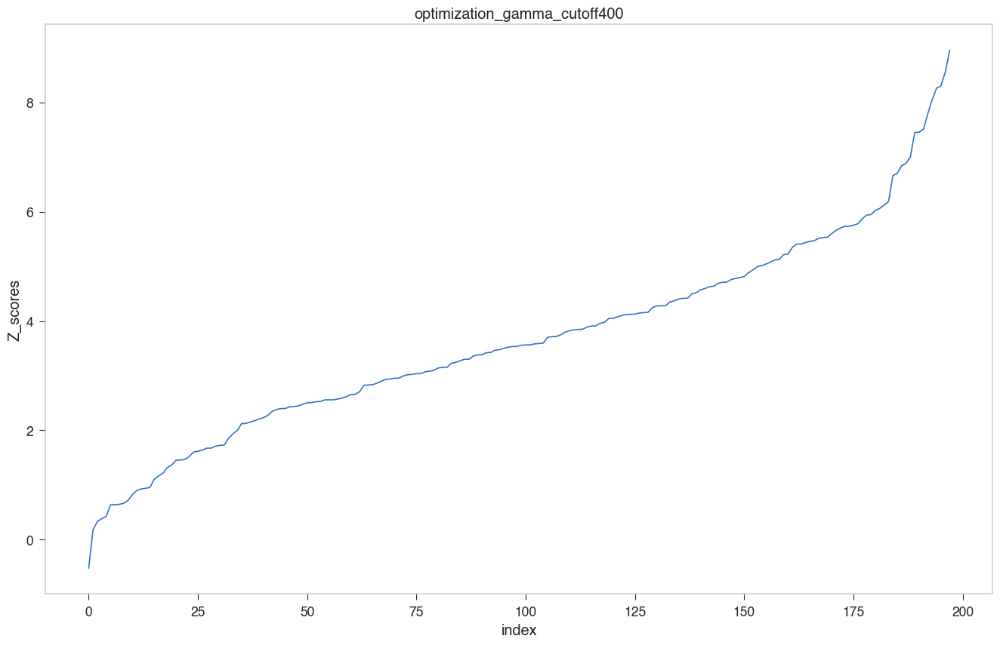

In [93]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_10"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [94]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,7rsa_iteration_start_native,-0.518988,1.811735,-82.291257,162.051959
1,1,7rsa_iteration_start_native_iter2,0.181806,1.811735,26.361110,135.030569
2,2,1cc5_iteration_start_native,0.334112,-366.072042,-328.641759,112.029182
3,3,1ptf_iteration_start_native,0.386201,-474.084854,-415.291799,152.234498
4,4,1hoe_iteration_start_native,0.425165,-141.227479,-94.459110,110.000423
5,5,3pyp_iteration_start_native_iter2,0.636925,-971.182125,-850.936430,188.791107
6,6,1poc_iteration_start_native,0.640472,-302.122962,-192.313416,171.450954
7,7,1rie_iteration_start_native,0.646634,-344.307878,-251.702596,143.211322
8,8,1gvp_iteration_start_native,0.664323,-461.611367,-382.226965,119.496657
9,9,2sns_iteration_start_native,0.718072,-444.199386,-306.233300,192.134148


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2//saved_gammas/native_iter2_cutoff400_impose_Aprime_constraint
0 0.1137272700731012
/Users/weilu/Research/data/optimization_2020_native_iter2_400_native_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

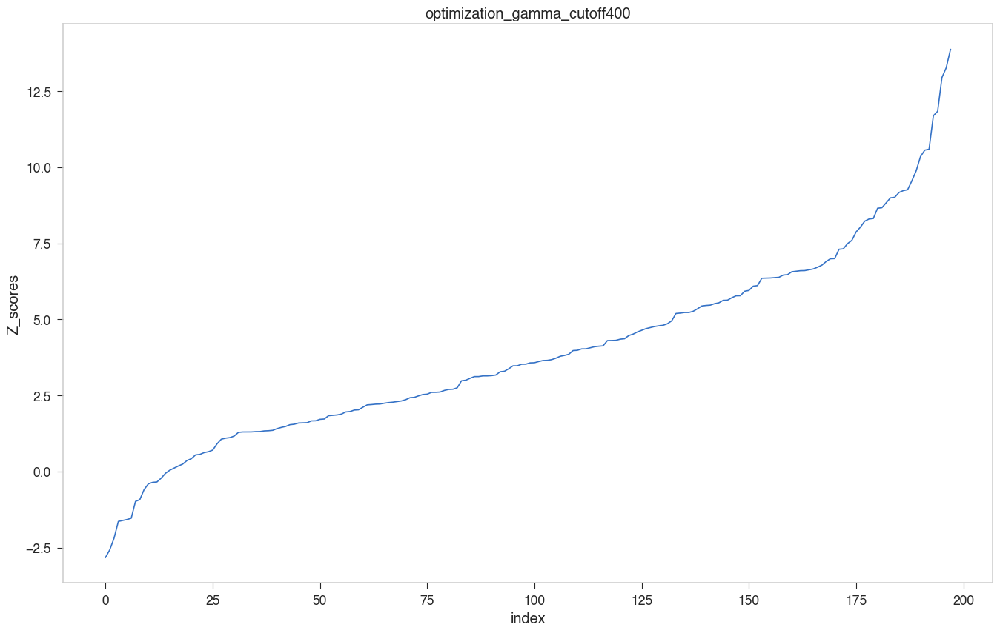

In [90]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native_iter2/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "native_iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_native_10"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [91]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1aqe_iteration_start_native,-2.825849,-265.951247,-331.490458,23.192754
1,1,1rie_iteration_start_native,-2.571857,-242.326511,-310.884663,26.657059
2,2,1hoe_iteration_start_native,-2.190176,-203.480898,-249.758938,21.129825
3,3,1gvp_iteration_start_native,-1.640223,-244.144016,-279.908866,21.804868
4,4,1vls_iteration_start_native,-1.608403,-302.341309,-339.212700,22.924225
5,5,1cc5_iteration_start_native,-1.577729,-177.324878,-205.003465,17.543308
6,6,7rsa_iteration_start_native,-1.535155,-352.645862,-396.001365,28.241772
7,7,1kuh_iteration_start_native,-0.981859,-404.426543,-430.948172,27.011642
8,8,2sns_iteration_start_native,-0.924954,-251.604131,-286.999128,38.266755
9,9,1ptf_iteration_start_native,-0.596015,-210.577334,-225.215028,24.559281


/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint
0 -3.9130717744221073
/Users/weilu/Research/data/optimization_2020_iter2_400_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

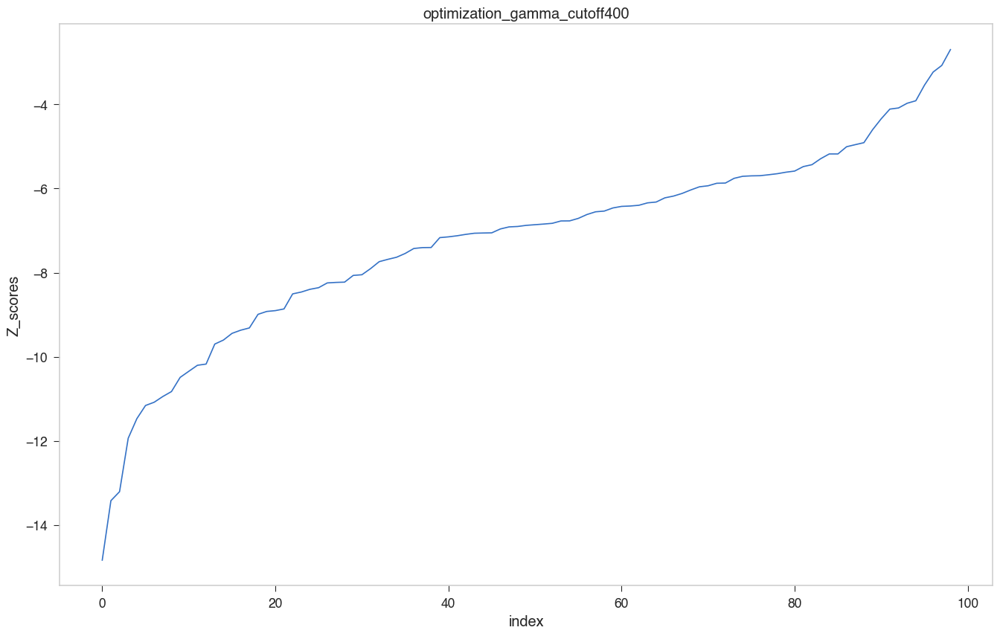

In [80]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native//"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_native_10"
gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native///iter_native_10
0 2.176531039856875
/Users/weilu/Research/data/optimization_2020_iter2_400_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

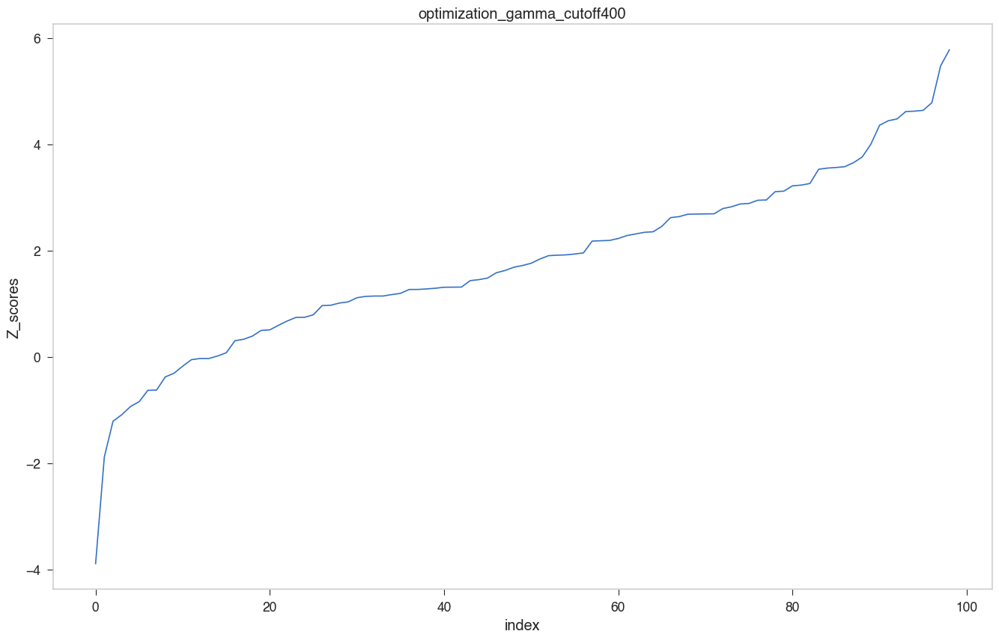

In [85]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native//"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_native_10"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [87]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1mba_iteration_start_native,-3.890775,-296.687327,-330.066559,8.579070
1,1,1rmd_iteration_start_native,-1.886145,-230.458010,-242.781332,6.533604
2,2,1puc_iteration_start_native,-1.211023,-160.606221,-168.069780,6.163022
3,3,1b6e_iteration_start_native,-1.090414,-262.832804,-288.598508,23.629278
4,4,1msc_iteration_start_native,-0.935554,-247.226085,-251.428801,4.492222
5,5,1skz_iteration_start_native,-0.843852,-153.470272,-179.058427,30.323043
6,6,1fmb_iteration_start_native,-0.630293,-195.073932,-198.121004,4.834376
7,7,1poa_iteration_start_native,-0.625436,-206.247048,-215.552584,14.878490
8,8,1osa_iteration_start_native,-0.378131,-261.846187,-263.838403,5.268588
9,9,1kpf_iteration_start_native,-0.309293,-188.858490,-191.743338,9.327244


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native///iter_native_20
0 4.31555410441062
/Users/weilu/Research/data/optimization_2020_iter2_400_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

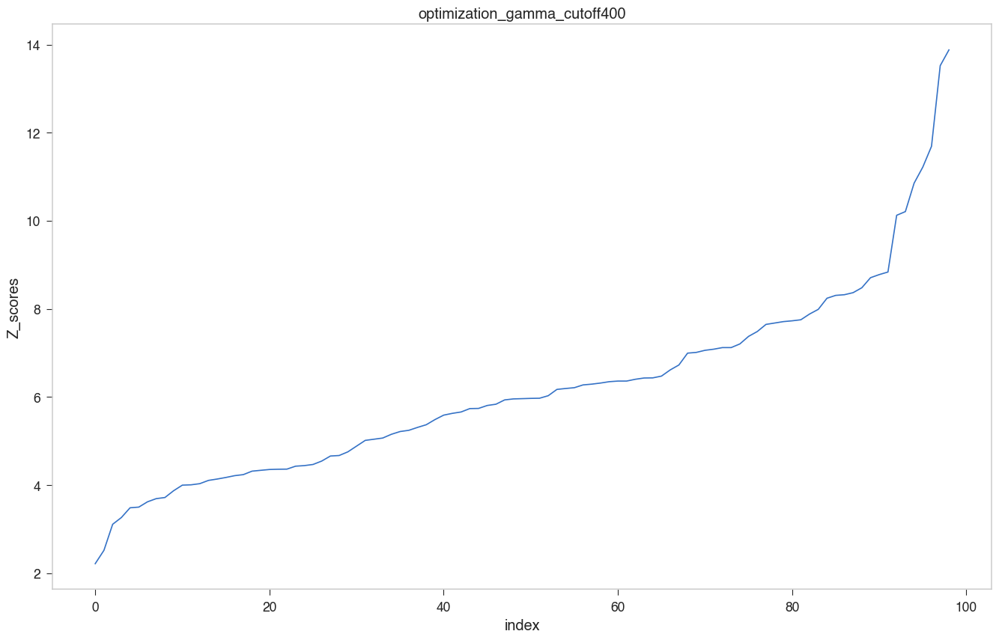

In [82]:

cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native//"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_native_20"
# gamma_file_name = "/Users/weilu/Research/server/mar_2020/cath_dataset_shuffle_optimization/optimization_iter0_com_density_rmin_2p5/saved_gammas/iter0_cutoff600_impose_Aprime_constraint"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [83]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1cpq_iteration_start_native,2.215526,-248.055603,-221.260406,12.094281
1,1,1skz_iteration_start_native,2.518411,-228.536649,-162.954112,26.041235
2,2,1rzl_iteration_start_native,3.109260,-190.406023,-163.519314,8.647301
3,3,451c_iteration_start_native,3.262453,-205.273174,-170.932596,10.526000
4,4,1tul_iteration_start_native,3.484104,-242.884875,-208.044822,9.999716
5,5,1tif_iteration_start_native,3.499495,-187.389773,-157.132942,8.646055
6,6,1b6e_iteration_start_native,3.619678,-352.744265,-294.541027,16.079674
7,7,2pii_iteration_start_native,3.691601,-271.587659,-228.330174,11.717811
8,8,1bm8_iteration_start_native,3.717260,-267.437082,-228.329591,10.520515
9,9,1puc_iteration_start_native,3.871509,-204.109178,-167.817672,9.373994


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native///saved_gammas/iter2_cutoff400_impose_Aprime_constraint
0 4.76876504162221
/Users/weilu/Research/data/optimization_2020_iter2_400_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

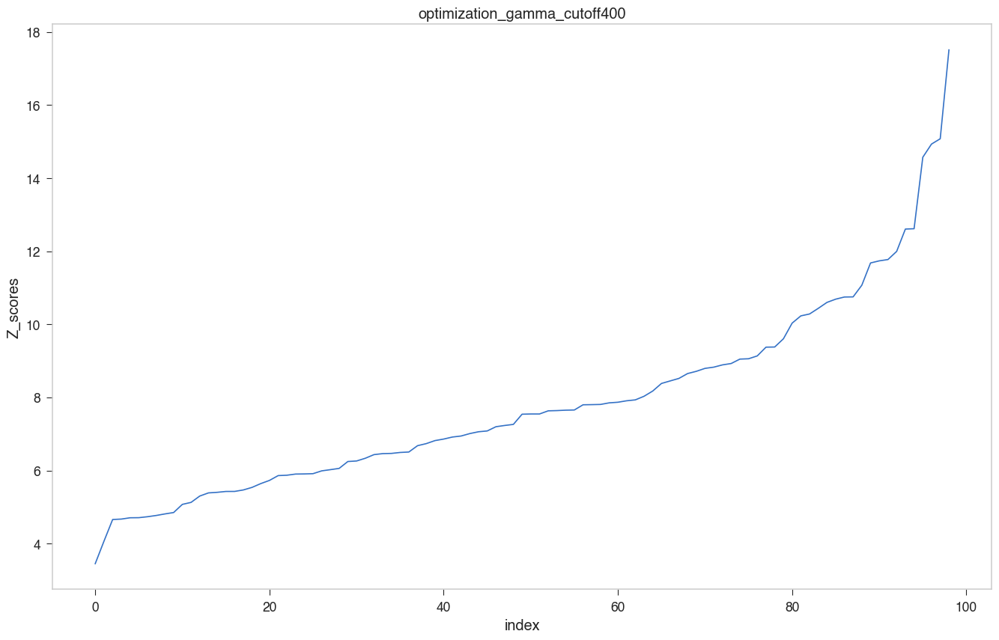

In [76]:
cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_native//"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_2_10"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_cbd//saved_gammas/iter2_cutoff400_impose_Aprime_constraint
0 0.9483195293738553
/Users/weilu/Research/data/optimization_2020_iter2_400_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

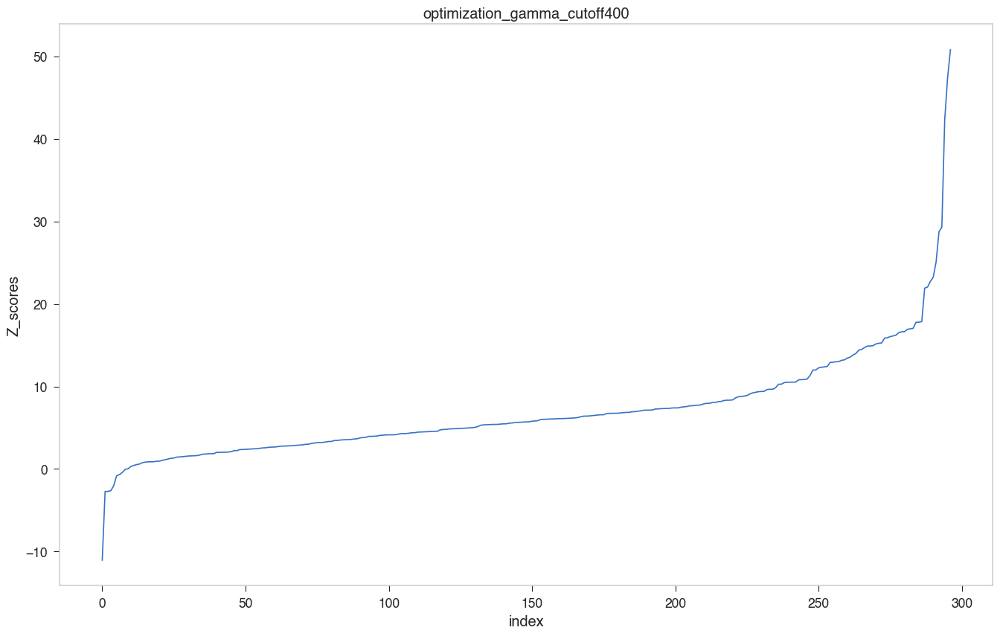

In [67]:
cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_cbd/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_2_10"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [73]:
data.columns

Index(['index', 'Protein', 'Z_scores', 'E_native', 'E_mgs', 'Std_mg'], dtype='object')

In [69]:
data.head()

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,2tgi_iteration_2_cbd,-11.041469,-1176.624154,-2872.127983,153.557819
1,1,1akr_iteration_2_cbd,-2.717221,-2401.567753,-3137.204808,270.731389
2,2,3lzt_iteration_2_cbd,-2.714842,-1936.170714,-3101.439329,429.221580
3,3,1baj_iteration_2_cbd,-2.628376,-1424.962375,-1768.733315,130.792171
4,4,1hyp_iteration_2_cbd,-2.015672,-1406.510448,-1811.867184,201.102571


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_cbd//saved_gammas/iter2_cutoff400_impose_Aprime_constraint
0 -2.6597454467079804
/Users/weilu/Research/data/optimization_2020_iter2_400_iter2.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

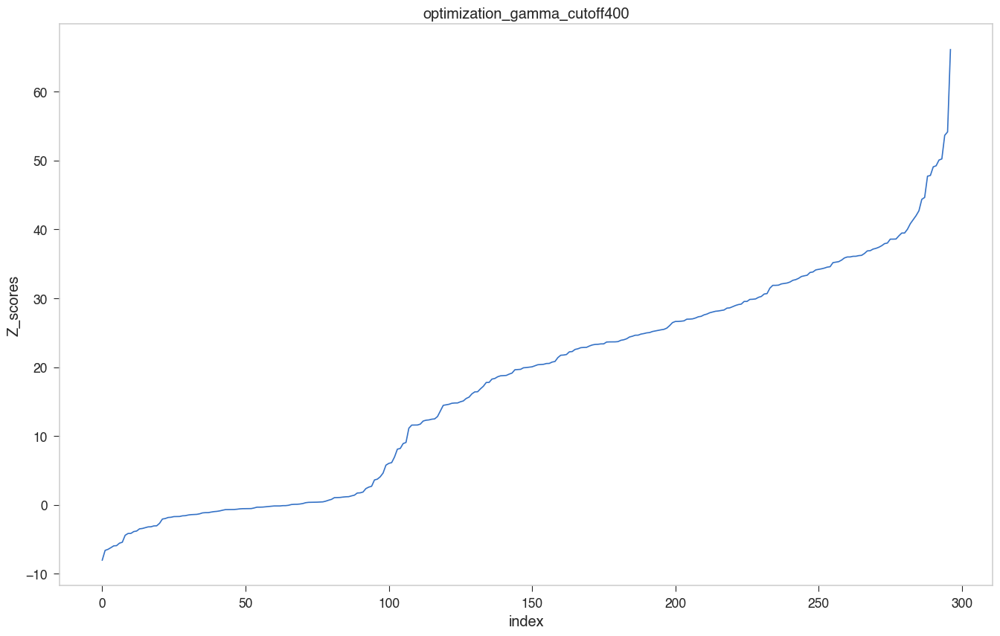

In [64]:
cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter2_cbd/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter2"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_2_10"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [65]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,2pii_iteration_0_cbd,-8.007115,-504.710838,-653.461006,18.577249
1,1,1tif_iteration_0_cbd,-6.591127,-261.538233,-387.909514,19.172938
2,2,1dun_iteration_0_cbd,-6.439729,-535.926714,-681.864952,22.662171
3,3,1rie_iteration_0_cbd,-6.198930,-448.051023,-618.957891,27.570383
4,4,1lba_iteration_0_cbd,-5.936524,-561.187818,-688.246542,21.402884
5,5,1aqe_iteration_0_cbd,-5.903437,-311.964820,-487.580018,29.747958
6,6,3cyr_iteration_0_cbd,-5.545033,-218.188593,-370.545162,27.476226
7,7,3vub_iteration_0_cbd,-5.411682,-385.825182,-496.117809,20.380471
8,8,1skz_iteration_0_cbd,-4.396741,-342.250454,-456.140707,25.903334
9,9,1msc_iteration_0_cbd,-4.138726,-449.460503,-601.871926,36.825686


In [41]:
data = pd.read_csv(dataFile, index_col=0)
data["normalized_Z_weight"] = 10/(data["Z_scores"] - data["Z_scores"].min() + 10)
# data["normalized_Z_weight_times_Z"] = data["normalized_Z_weight"] * data["Z_scores"]

In [42]:
data["Z_scores"].min()

-2.739730652689483

In [49]:
data.query("Protein =='2pii_iteration_0_cbd'")["normalized_Z_weight"].values[0]

1.0

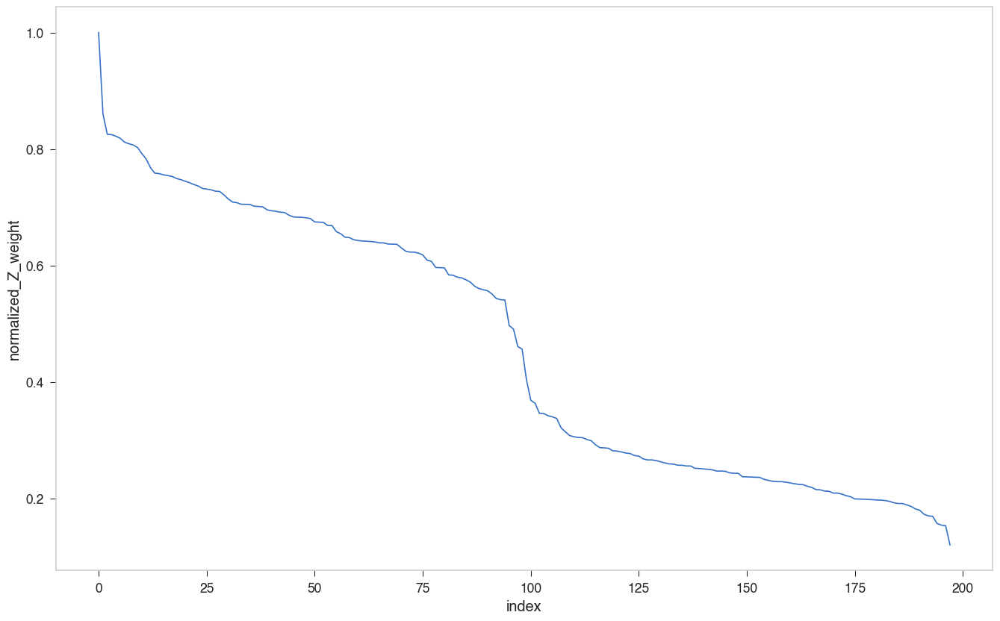

In [44]:
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "normalized_Z_weight", data=data)

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter1_cbd//iter_2_10
0 2.3195815218870957
/Users/weilu/Research/data/optimization_2020_iter1_400_iter1.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

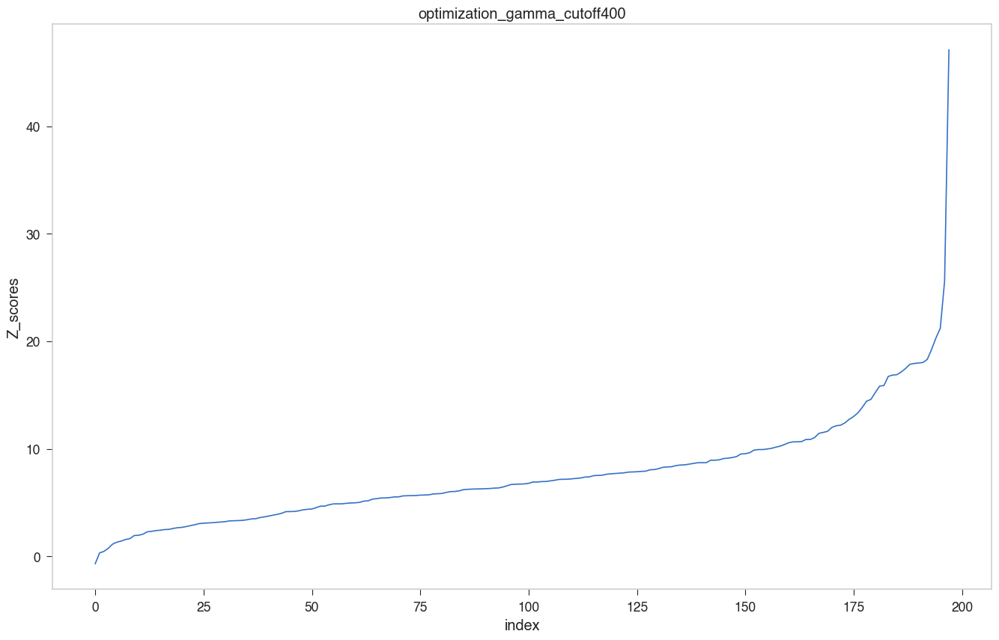

In [61]:
cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter1_cbd/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter1"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_2_10"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter1_cbd//saved_gammas/iter1_cutoff400_impose_Aprime_constraint
0 -0.34891084765733626
/Users/weilu/Research/data/optimization_2020_iter1_400_iter1.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

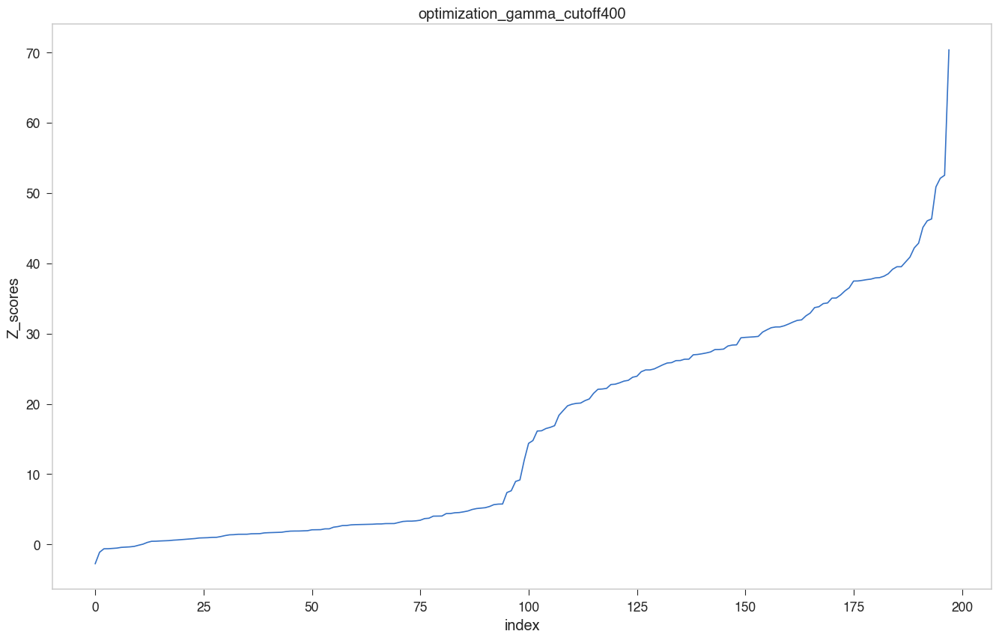

In [15]:
cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter1_cbd/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter1"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{pre}/iter_2_30"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter1_cbd//iter_2_30
0 -2.8612301583948656
/Users/weilu/Research/data/optimization_2020_iter0_400_iter0.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

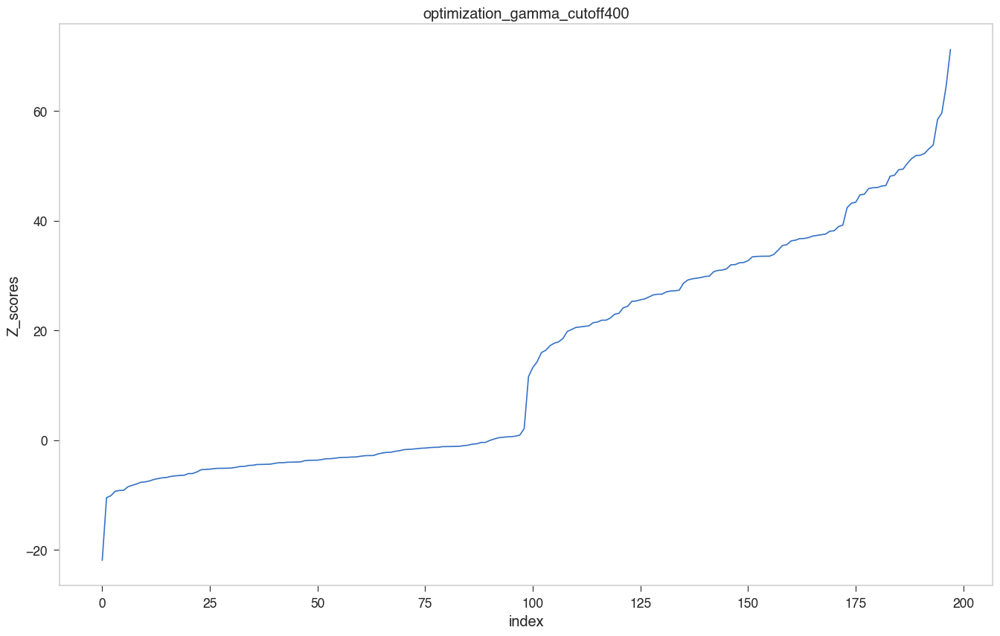

In [13]:
cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter1_cbd/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter0"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_2_30"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter0_cbd//iter_1_30
0 0.9045633247527238
/Users/weilu/Research/data/optimization_2020_iter0_400_iter0.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

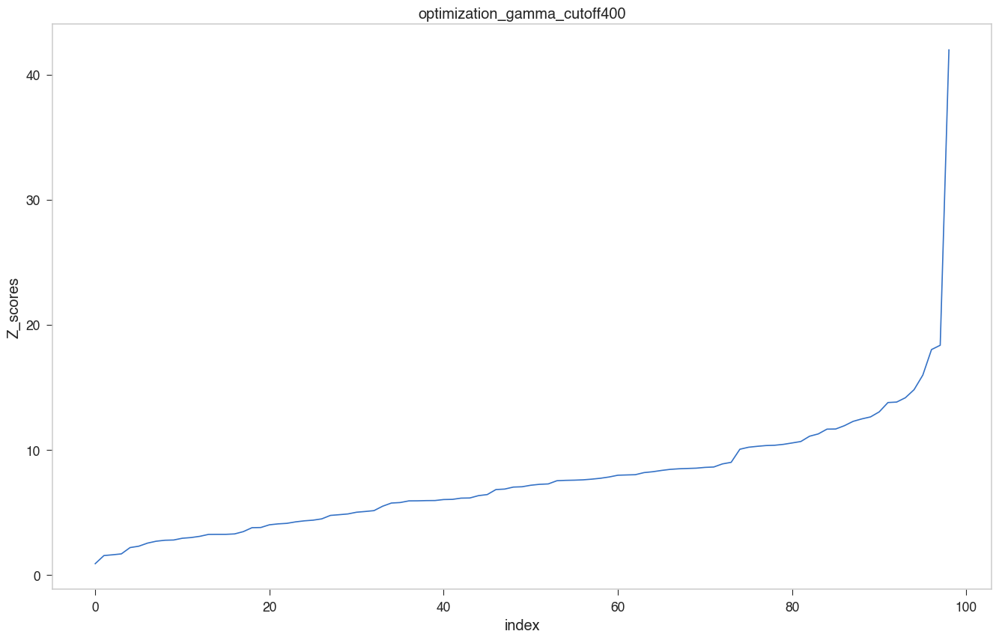

In [9]:
cutoff = 400
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter0_cbd/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter0"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_1_30"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter0_com//iter_1_30
0 4.834725049137312
/Users/weilu/Research/data/optimization_2020_iter0_600_iter0.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

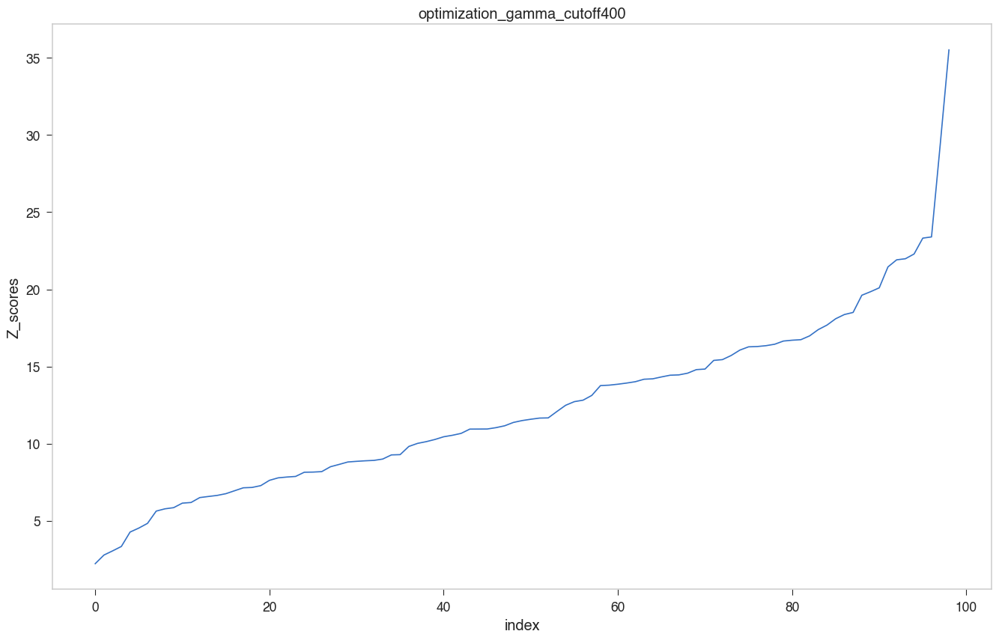

In [6]:
cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter0_com/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter0"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = f"{pre}/iter_1_30"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [7]:
data

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
0,0,1fna_iteration_0,2.224911,-358.214869,-339.745115,8.301344
1,1,1rss_iteration_0,2.782888,-522.726326,-463.025990,21.452654
2,2,1cpq_iteration_0,3.054445,-444.372899,-408.559655,11.724961
3,3,1hoe_iteration_0,3.339580,-296.573472,-257.758650,11.622666
4,4,3vub_iteration_0,4.272479,-378.224640,-310.465540,15.859434
5,5,451c_iteration_0,4.529650,-316.228262,-271.174630,9.946382
6,6,1baj_iteration_0,4.834725,-216.486068,-184.351713,6.646573
7,7,1ptf_iteration_0,5.630389,-332.708786,-270.873126,10.982485
8,8,2a0b_iteration_0,5.777618,-406.121691,-357.043659,8.494510
9,9,1by9_iteration_0,5.853426,-284.547210,-223.436316,10.440193


In [4]:
cutoff = 600
pre = "/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter0_com/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter0"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 100, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)


/Users/weilu/Research/server/mar_2020/mass_iterative_optimization/optimization_iter0_com//saved_gammas/iter0_cutoff600_impose_Aprime_constraint
0 8.718488894920451
/Users/weilu/Research/data/optimization_2020_iter0_600_iter0.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

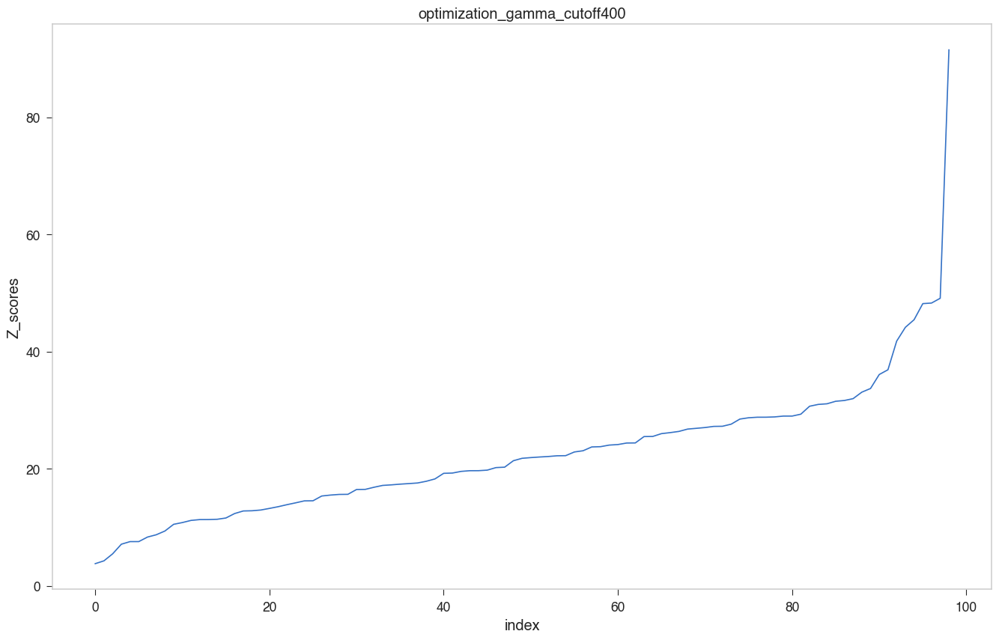

In [5]:
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

In [ ]:
cutoff = 600
pre = "/Users/weilu/Research/server/feb_2020/cath_dataset_shuffle_optimization/three_well_optimization_iter0/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter0"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)


In [8]:
cutoff = 600
pre = "/Users/weilu/Research/server/feb_2020/cath_dataset_shuffle_optimization/optimization_iter0/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter0"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_cath_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)


/Users/weilu/Research/server/feb_2020/cath_dataset_shuffle_optimization/optimization_iter0//saved_gammas/iter0_cutoff600_impose_Aprime_constraint
0 6.7438470062754
/Users/weilu/Research/data/optimization_2020_cath_iter0_600_iter0.csv


In [29]:
data_standard = pd.read_csv("/Users/weilu/Research/data/optimization_2020_cath_iter0_600_iter0.csv", index_col=0)
data_three_well = pd.read_csv('/Users/weilu/Research/data/optimization_2020_iter0_600_iter0.csv', index_col=0)

data_standard = data_standard.sort_values("Z_scores").reset_index(drop=True).reset_index()
data_three_well = data_three_well.sort_values("Z_scores").reset_index(drop=True).reset_index()

In [32]:
data = pd.concat([data_standard.assign(Hamiltonian="standard"), data_three_well.assign(Hamiltonian="three_well")])

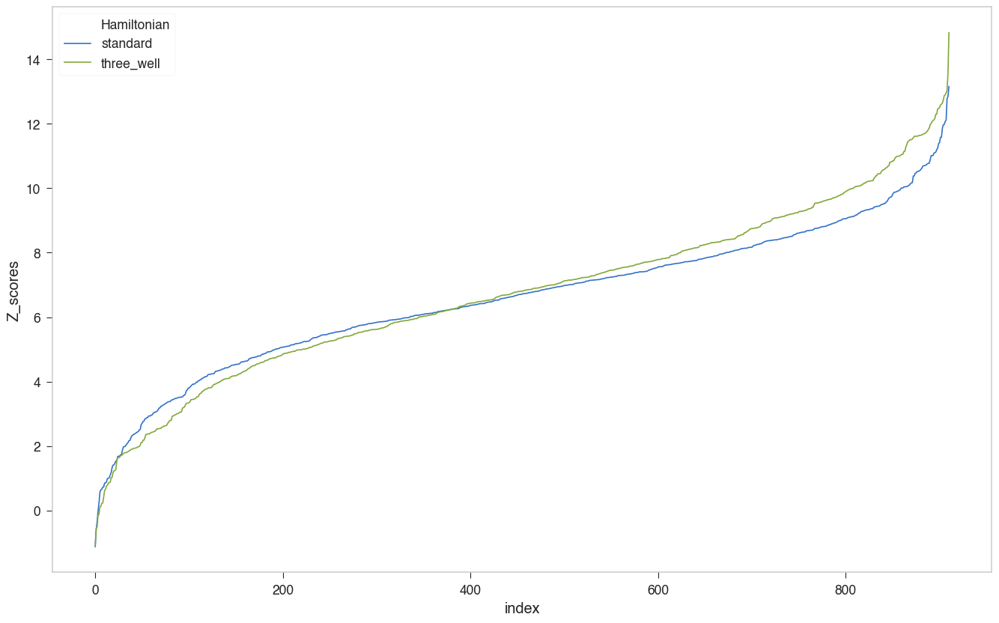

In [35]:
sns.lineplot("index", "Z_scores", hue="Hamiltonian", data=data)

# iteration 2

/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter2//saved_gammas/iter2_cutoff400_impose_Aprime_constraint
0 4.4233380351140195


Text(0.5, 1.0, 'optimization_gamma_cutoff400')

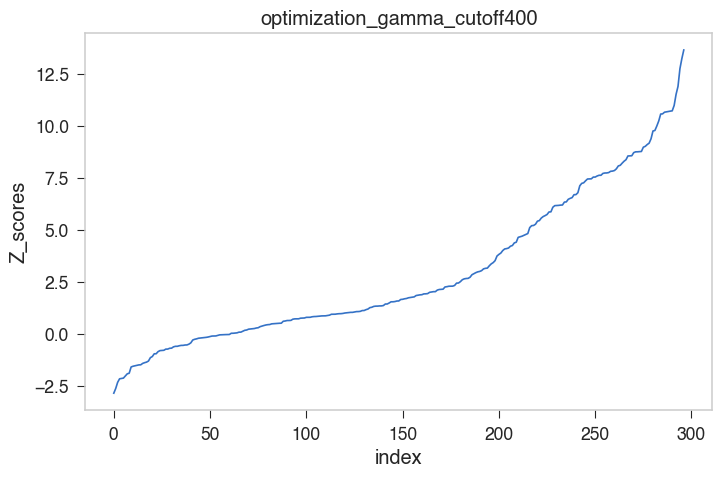

In [91]:
cutoff = 400
i = 2
pre = f"/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter{i}/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = f"iter{i}"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter1/iter_1_30"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff400")

/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter2//saved_gammas/iter2_cutoff300_impose_Aprime_constraint
0 4.049148081711622


Text(0.5, 1.0, 'optimization_gamma_cutoff300')

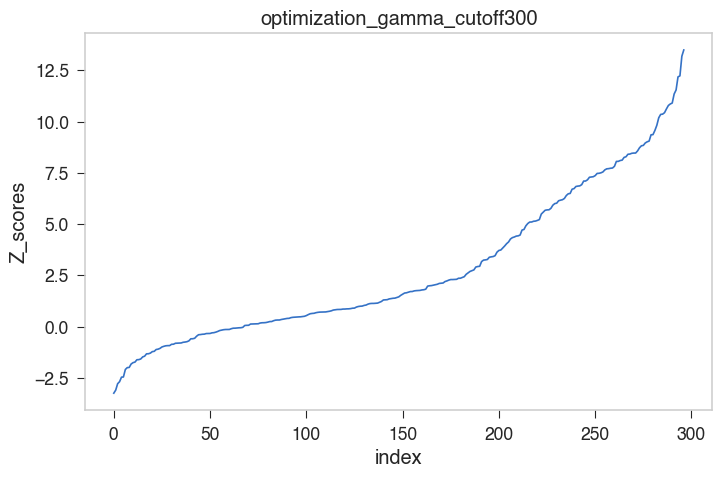

In [90]:
cutoff = 300
i = 2
pre = f"/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter{i}/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = f"iter{i}"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter1/iter_1_30"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff300")

/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter1/iter_1_30
0 0.8007013665370382


Text(0.5, 1.0, 'optimization_gamma_cutoff300')

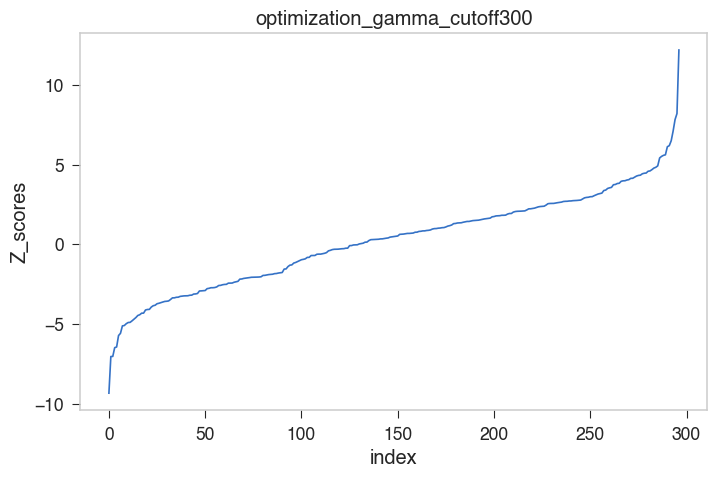

In [88]:
cutoff = 300
i = 2
pre = f"/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter{i}/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = f"iter{i}"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = "/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter1/iter_1_30"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff300")

/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter1/iter_1_30
0 -3.4703192659227886


Text(0.5, 1.0, 'optimization_gamma_cutoff300')

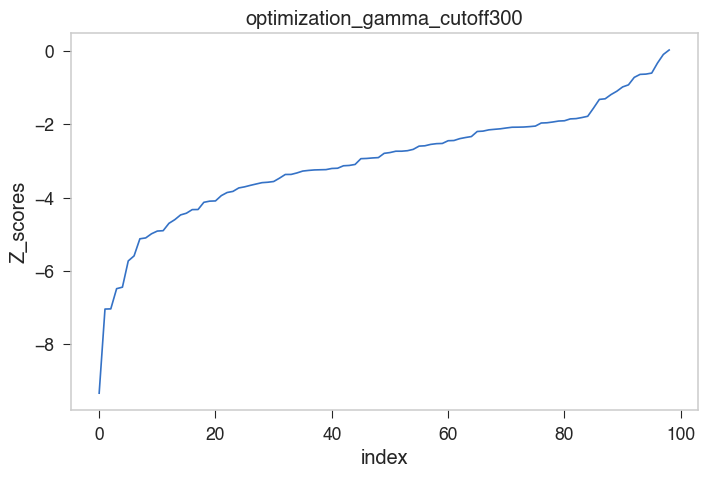

In [89]:
cutoff = 300
i = 2
pre = f"/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter{i}/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = f"iter{i}"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = "/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter1/iter_1_30"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 50, mode=0)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff300")

# iteration 1

In [75]:
cutoff = 100
i = 1
pre = f"/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter{i}/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = f"iter{i}"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_mass_specific_deocys_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)


/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter1//saved_gammas/iter1_cutoff100_impose_Aprime_constraint
0 3.3679547936516134
/Users/weilu/Research/data/optimization_2020_mass_specific_deocys_iter1_100_iter1.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff100')

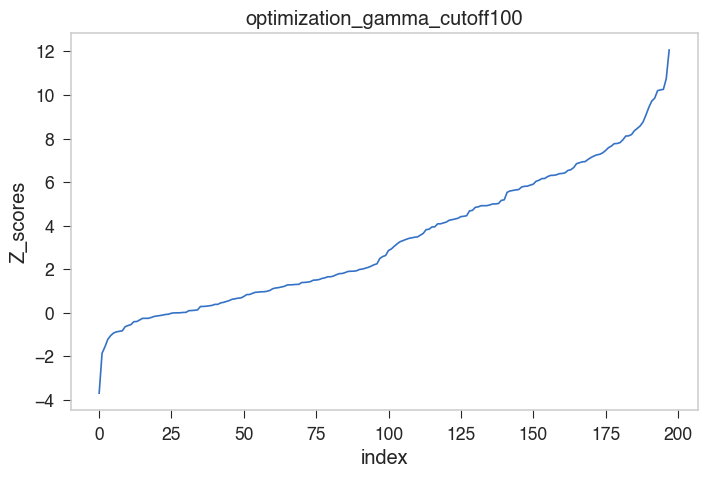

In [76]:
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff100")

/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter1//saved_gammas/iter1_cutoff300_impose_Aprime_constraint
0 3.940622839693749


Text(0.5, 1.0, 'optimization_gamma_cutoff300')

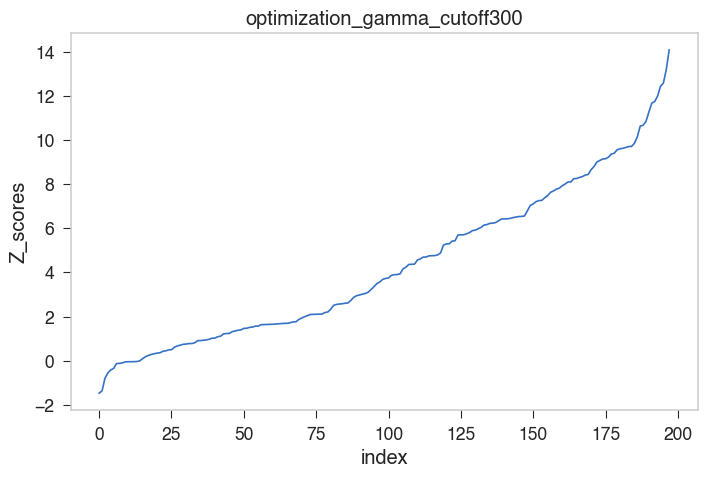

In [84]:
cutoff = 300
i = 1
pre = f"/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter{i}/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = f"iter{i}"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff300")

/Users/weilu/opt/parameters/original_gamma
0 -3.412514346007094


Text(0.5, 1.0, 'original_gamma')

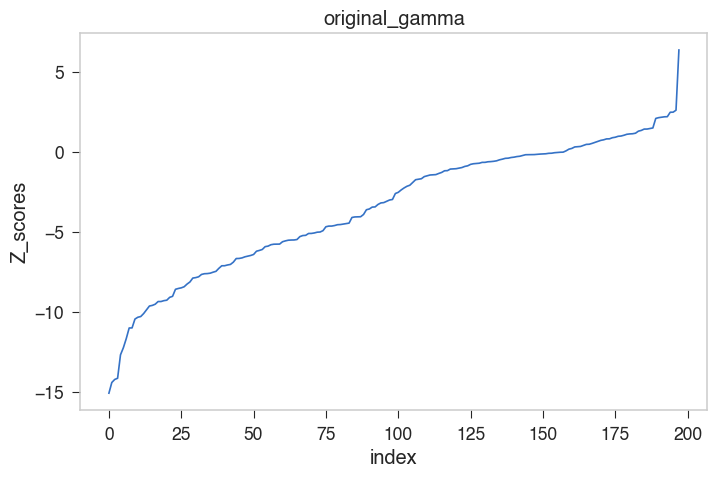

In [77]:
cutoff = 100
i = 1
pre = f"/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter{i}/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = f"iter{i}"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("original_gamma")

/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter0/iter_0_30
0 1.2852675230856065


Text(0.5, 1.0, 'iter_0_30')

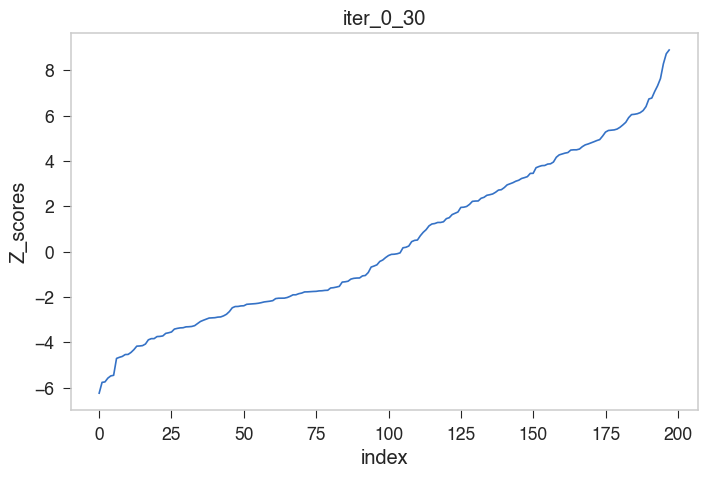

In [79]:
cutoff = 100
i = 1
pre = f"/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter{i}/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = f"iter{i}"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_file_name = "/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter0/iter_0_30"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("iter_0_30")

/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter1/iter_1_30
0 0.8007013665370382


Text(0.5, 1.0, 'iter_1_30')

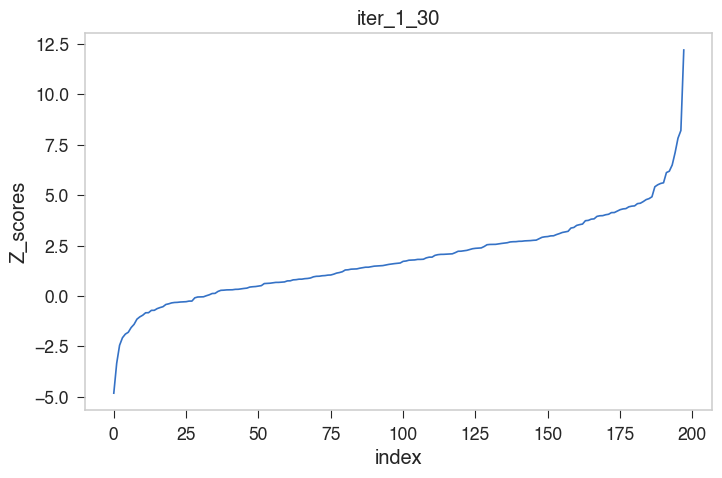

In [81]:
cutoff = 100
i = 1
pre = f"/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter{i}/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = f"iter{i}"
# gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_file_name = "/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter1/iter_1_30"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_complete", gamma_file_name, "openMM", 50, mode=0)
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("iter_1_30")

In [73]:
cutoff = 100
pre = "/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter0/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter0"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_mass_specific_deocys_{trial_name}_{cutoff}_{trial_name}.csv"
data.to_csv(dataFile)
print(dataFile)


/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter0//saved_gammas/iter0_cutoff100_impose_Aprime_constraint
0 3.2673298994171183
/Users/weilu/Research/data/optimization_2020_mass_specific_deocys_iter0_100_iter0.csv


Text(0.5, 1.0, 'optimization_gamma_cutoff100')

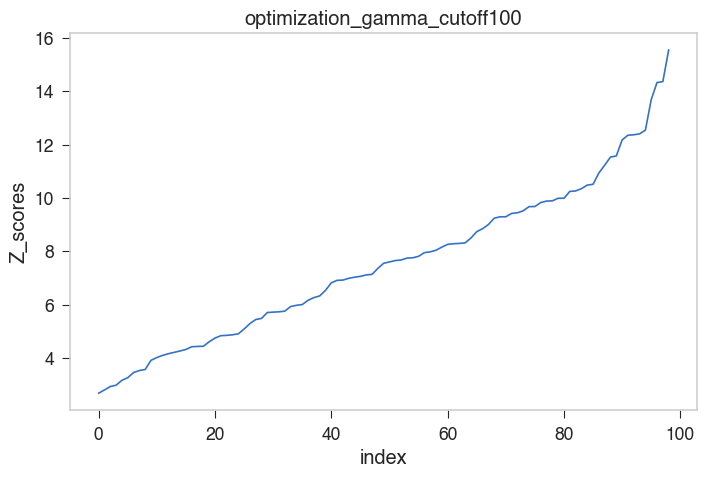

In [74]:
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("optimization_gamma_cutoff100")

In [67]:
plt.rcParams['figure.figsize'] = 0.5*np.array([16.18033, 10])    #golden ratio

In [69]:
cutoff = 100
pre = "/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter0/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter0"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = "/Users/weilu/Research/server/feb_2020/cath_dataset_shuffle_optimization/optimization_iter0//saved_gammas/iter0_cutoff600_impose_Aprime_constraint"
gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
# gamma_file_name = f"{pre}/iter_0_30"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 50, mode=0)

/Users/weilu/opt/parameters/original_gamma
0 -3.412514346007094


Text(0.5, 1.0, 'original_gamma')

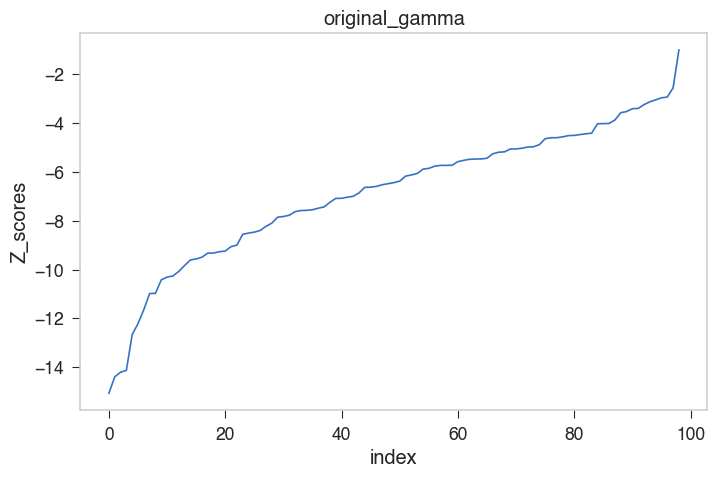

In [70]:
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("original_gamma")

In [62]:
cutoff = 100
pre = "/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter0/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = f"{pre}/saved_gammas"
trial_name = "iter0"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = "/Users/weilu/Research/server/feb_2020/cath_dataset_shuffle_optimization/optimization_iter0//saved_gammas/iter0_cutoff600_impose_Aprime_constraint"
gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_file_name = f"{pre}/iter_0_30"

# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 50, mode=0)
dataFile = f"/Users/weilu/Research/data/optimization_2020_mass_specific_deocys_{trial_name}_{cutoff}_{trial_name}.csv"
# data.to_csv(dataFile)
print(dataFile)


/Users/weilu/Research/server/feb_2020/mass_specific_decoys/optimization_iter0//iter_0_30
0 1.2852675230856065
/Users/weilu/Research/data/optimization_2020_mass_specific_deocys_iter0_100_iter0.csv


Text(0.5, 1.0, 'mixed_iter_0_30')

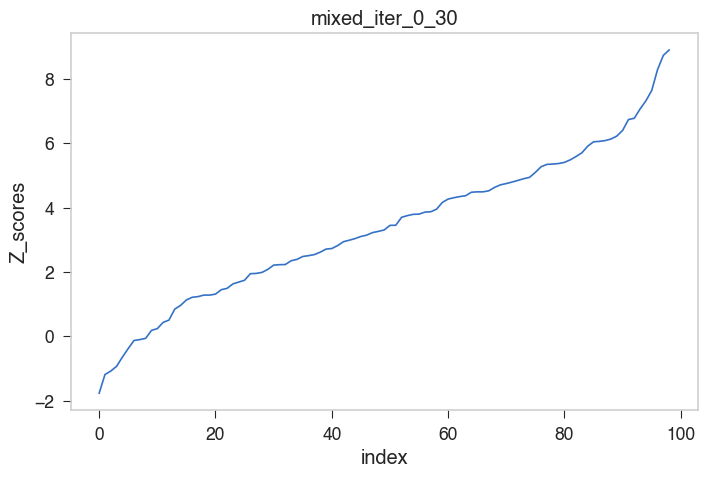

In [68]:
data = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data)
plt.title("mixed_iter_0_30")

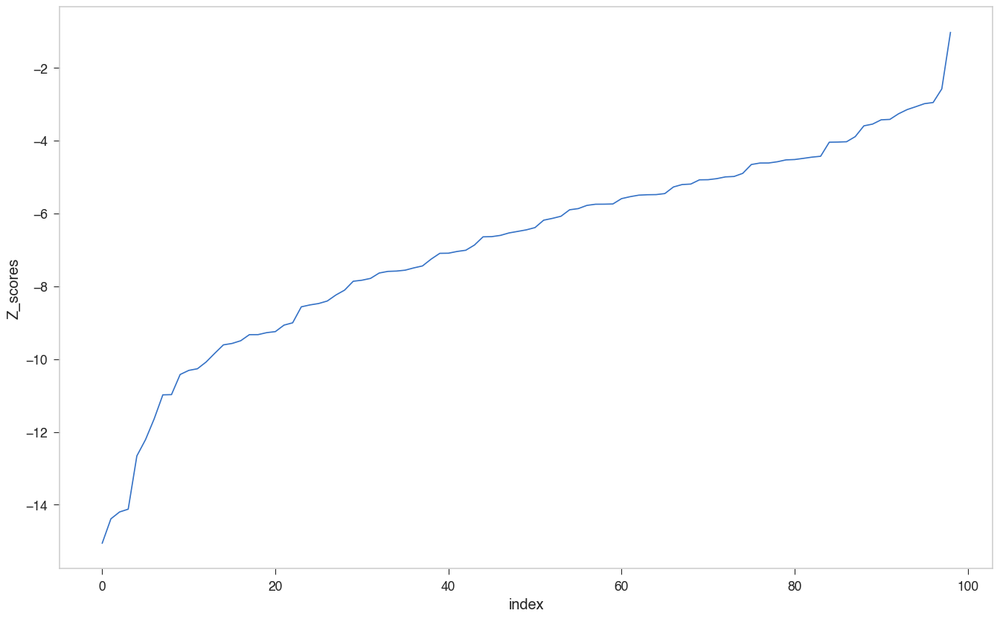

In [60]:
data_specific_decoys = data.sort_values("Z_scores").reset_index(drop=True).reset_index()
sns.lineplot("index", "Z_scores", data=data_specific_decoys)

In [39]:
data

,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BAJ_iteration_0,9.428375,-226.207012,-5.135984,23.447416
1,1HOE_iteration_0,7.503839,-485.461830,-14.333970,62.784911
2,1HYP_iteration_0,21.203656,-235.320396,-1.618702,11.021764
3,1TIF_iteration_0,12.613545,-423.481708,-7.426257,32.984815
4,1VCC_iteration_0,10.839966,-358.586200,-7.229608,32.413072
5,1BY9_iteration_0,5.988900,-460.567829,-16.927459,74.077101
6,1BDO_iteration_0,15.584822,-488.070524,-6.919367,30.873061
7,451C_iteration_0,9.717537,-415.431560,-9.463045,41.776893
8,1CC5_iteration_0,6.247814,-288.145751,-10.114010,44.500642
9,1BB9_iteration_0,14.040275,-524.814318,-8.241070,36.792247


In [11]:
# dataFile = f"/Users/weilu/Research/data/optimization_2020_{trial_name}_{cutoff}_{trial_name}.csv"
dataFiel = '/Users/weilu/Research/data/optimization_2020_iter0_600_iter0.csv'

In [146]:
pwd

'/Users/weilu/opt/notebook/Optimization'

In [147]:
pre = "/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization/"
trial_name = "iter2"
save_gamma_pre = "saved_gammas"

In [187]:

d_ = []
for i in range(2, 5):
    d = pd.read_csv(f"/Users/weilu/Research/data/optimization_iter{i}.csv", index_col=0)
    d_.append(d.assign(iteration=f"iter_{i}"))

In [188]:
d = pd.read_csv(f"/Users/weilu/Research/data/optimization_iter4_600.csv", index_col=0)
d_.append(d.assign(iteration=f"iter_{i}_600"))

In [189]:
d = pd.read_csv(f"/Users/weilu/Research/data/optimization_iter4_500_iter4.csv", index_col=0)
d_.append(d.assign(iteration=f"iter_{i}_500_iter4"))

In [190]:
data = pd.concat(d_)

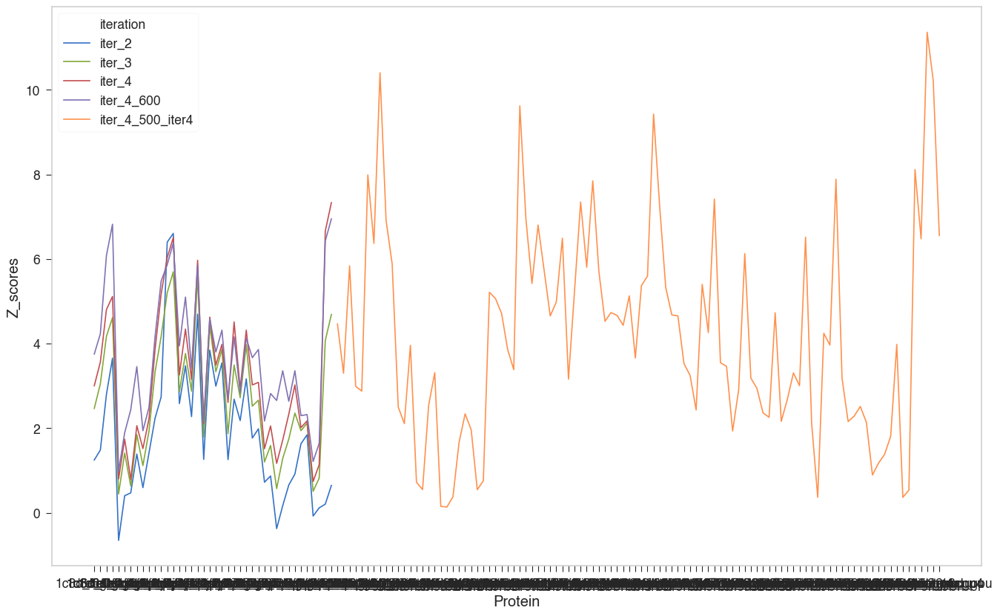

In [191]:
sns.lineplot("Protein", "Z_scores", data=data, hue="iteration")

In [183]:
cutoff = 500
pre = "/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter4/"
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = "/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter4/saved_gammas"
trial_name = "iter4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 500, mode=0)
data.to_csv(f"/Users/weilu/Research/data/optimization_{trial_name}_{cutoff}_{trial_name}.csv")
data


/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter4/saved_gammas/iter4_cutoff500_impose_Aprime_constraint
0 3.3121770041794005


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1e0m_first_iter1_cpu4,3.312177,-36.816216,-28.915708,2.385291
1,1w4e_first_iter1_cpu4,2.257365,-60.644646,-52.772211,3.487444
2,1e0g_first_iter1_cpu4,2.107503,-57.673978,-49.647229,3.808654
3,2wqg_first_iter1_cpu4,1.808784,-67.708276,-62.111743,3.094086
4,1jo8_first_iter1_cpu4,4.665952,-85.425310,-63.991036,4.593762
5,1fex_first_iter1_cpu4,2.338628,-71.588414,-62.999750,3.672523
6,2l6r_first_iter1_cpu4,2.513647,-82.390677,-74.136316,3.283819
7,1c8c_first_iter1_cpu4,3.299335,-92.524901,-78.462282,4.262258
8,1g6p_first_iter1_cpu4,5.063909,-97.388058,-76.213946,4.181377
9,1mjc_first_iter1_cpu4,4.655057,-92.608008,-71.733297,4.484309


In [177]:
cutoff = 600
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = "/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter4/saved_gammas"
trial_name = "iter4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 500, mode=0)
data.to_csv(f"/Users/weilu/Research/data/optimization_{trial_name}_{cutoff}.csv")
data


/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter4/saved_gammas/iter4_cutoff600_impose_Aprime_constraint
0 2.437450526865485


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1e0m_first,2.437451,-29.687916,-23.082489,2.709974
1,1w4e_first,2.167875,-62.893537,-55.301214,3.502197
2,1e0g_first,0.982447,-57.390529,-54.723331,2.714851
3,2wqg_first,1.212596,-71.658121,-68.511468,2.594972
4,1jo8_first,2.173974,-88.129116,-78.052529,4.635099
5,1fex_first,1.940001,-73.105994,-66.649105,3.328291
6,2l6r_first,2.297150,-86.484814,-80.112769,2.773892
7,1c8c_first,3.751779,-92.796363,-78.861784,3.714125
8,1g6p_first,4.169307,-98.044510,-76.676257,5.125133
9,1mjc_first,2.706049,-92.944015,-77.718475,5.626482


In [164]:
cutoff = 400
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = "/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter4/saved_gammas"
trial_name = "iter4"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 500, mode=0)
data.to_csv("/Users/weilu/Research/data/optimization_iter4.csv")
data


/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter4/saved_gammas/iter4_cutoff400_impose_Aprime_constraint
0 0.7876760758649356


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1e0m_first,0.787676,-37.067622,-35.457962,2.043556
1,1w4e_first,1.515004,-58.405149,-54.094333,2.845416
2,1e0g_first,0.797711,-57.081134,-55.123512,2.454050
3,2wqg_first,0.740115,-65.699767,-63.951993,2.361490
4,1jo8_first,2.102817,-82.577565,-73.934768,4.110105
5,1fex_first,1.517787,-70.235907,-66.513311,2.452647
6,2l6r_first,2.013688,-79.485672,-74.797000,2.328400
7,1c8c_first,3.002166,-93.128980,-83.434969,3.229005
8,1g6p_first,3.862506,-97.395896,-80.438017,4.390382
9,1mjc_first,2.608514,-93.183422,-79.851485,5.110931


In [168]:
cutoff = 400
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
gamma_pre = "/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter3/saved_gammas"
trial_name = "iter3"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 500, mode=0)
data.to_csv("/Users/weilu/Research/data/optimization_iter3.csv")
data


/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter3/saved_gammas/iter3_cutoff400_impose_Aprime_constraint
0 0.6344609848433337


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1e0m_first,0.634461,-38.556688,-37.246065,2.065726
1,1w4e_first,1.201209,-61.074830,-57.702269,2.807639
2,1e0g_first,0.445048,-60.819728,-59.653053,2.621460
3,2wqg_first,0.507040,-69.467553,-68.228348,2.443997
4,1jo8_first,1.787785,-87.080095,-78.898117,4.576602
5,1fex_first,1.115041,-74.215760,-71.304414,2.610977
6,2l6r_first,1.941371,-84.914961,-80.127891,2.465819
7,1c8c_first,2.466411,-95.668378,-87.245475,3.415045
8,1g6p_first,3.329052,-98.923750,-84.416532,4.357763
9,1mjc_first,1.869539,-95.149166,-85.153383,5.346657


In [169]:
cutoff = 400
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
trial_name = "iter2"
gamma_pre = "/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter2/saved_gammas"
gamma_file_name = f"{gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 500, mode=0)
data.to_csv("/Users/weilu/Research/data/optimization_iter2.csv")
data


/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter2/saved_gammas/iter2_cutoff400_impose_Aprime_constraint
0 0.4698742711424042


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1e0m_first,0.469874,-43.213498,-42.006613,2.568527
1,1w4e_first,0.723114,-67.017416,-64.795847,3.072224
2,1e0g_first,-0.654004,-64.868440,-66.633653,2.699087
3,2wqg_first,-0.077250,-75.599967,-75.811276,2.735392
4,1jo8_first,1.261066,-95.781957,-89.477482,4.999322
5,1fex_first,0.594247,-82.751314,-80.904610,3.107636
6,2l6r_first,1.632334,-97.116654,-92.372256,2.906511
7,1c8c_first,1.247656,-101.859689,-96.915725,3.962601
8,1g6p_first,2.236991,-104.383469,-93.667717,4.790253
9,1mjc_first,1.256513,-103.493135,-95.922269,6.025299


In [152]:
cutoff = 100
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 500, mode=0)
data


/Users/weilu/opt/parameters/original_gamma
0 -3.134315368175681


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1e0m_first,-3.134315,-28.959620,-36.110636,2.281524
1,1w4e_first,-2.142032,-54.829456,-62.269248,3.473241
2,1e0g_first,-1.928739,-62.949887,-70.279293,3.800103
3,2wqg_first,-1.334083,-53.118996,-57.767673,3.484550
4,1jo8_first,-2.590605,-70.198432,-82.146847,4.612211
5,1fex_first,-0.233674,-65.982315,-67.215202,5.276098
6,2l6r_first,-1.284522,-69.544472,-75.615431,4.726239
7,1c8c_first,-2.335525,-83.483651,-97.340607,5.933123
8,1g6p_first,-2.024260,-87.507191,-101.837941,7.079500
9,1mjc_first,-1.716419,-89.817306,-101.801126,6.981874


In [158]:
list(range(0, 11, 2))

[0, 2, 4, 6, 8, 10]

In [149]:
cutoff = 100
os.chdir(f"{pre}")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"

gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "openMM", 500, mode=0)
data


saved_gammas/iter2_cutoff100_impose_Aprime_constraint
0 1.521157249771424


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1e0m_first,1.521157,-49.763807,-46.612263,2.071807
1,1w4e_first,1.592202,-70.535374,-65.223921,3.335917
2,1e0g_first,1.884390,-69.930112,-64.347835,2.962380
3,2wqg_first,1.679586,-79.734417,-74.762509,2.960199
4,1jo8_first,3.379647,-99.198759,-85.295219,4.113904
5,1fex_first,2.226026,-87.088085,-80.434049,2.989200
6,2l6r_first,0.811191,-88.949968,-86.235579,3.346178
7,1c8c_first,2.939662,-118.561042,-104.969264,4.623585
8,1g6p_first,5.954226,-137.487371,-105.977257,5.292059
9,1mjc_first,4.651391,-134.079942,-106.915011,5.840174


In [181]:
pwd

'/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization'

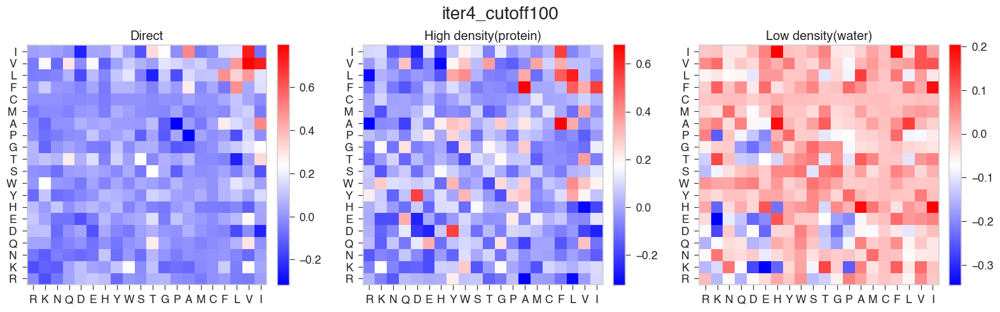

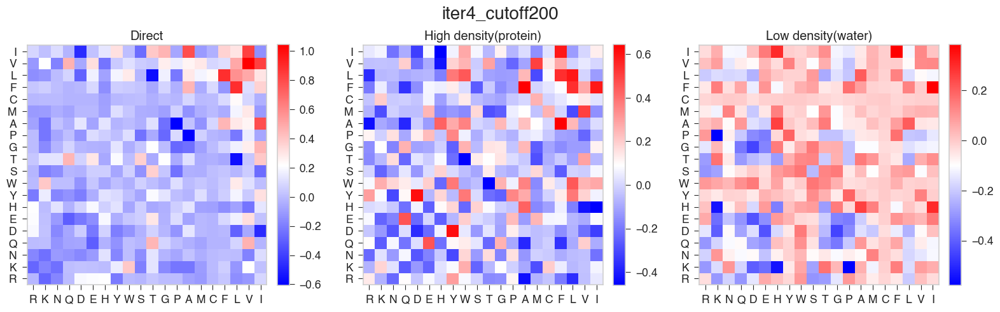

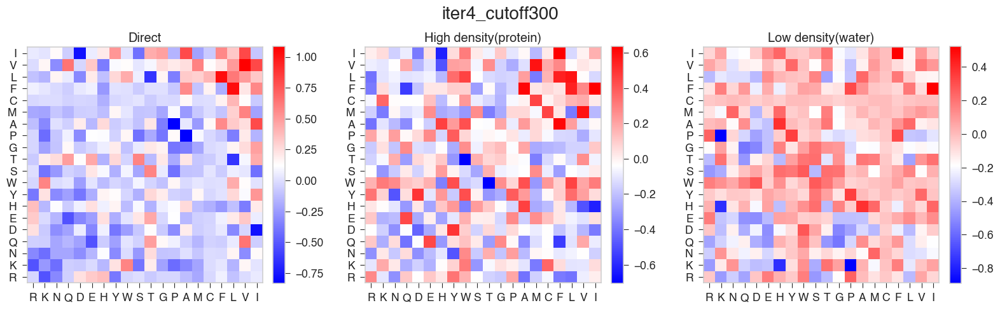

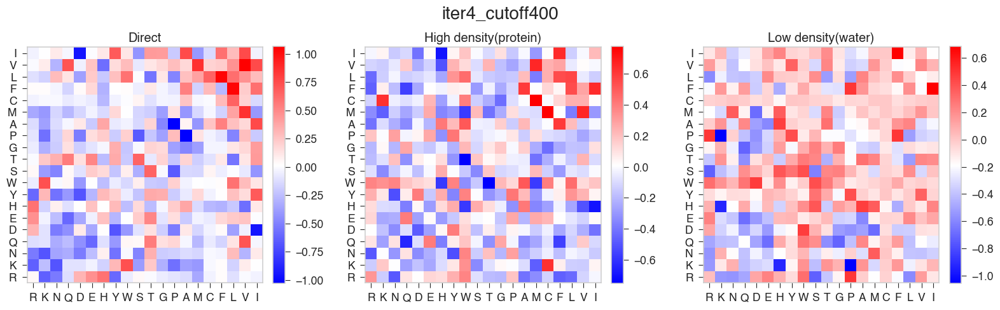

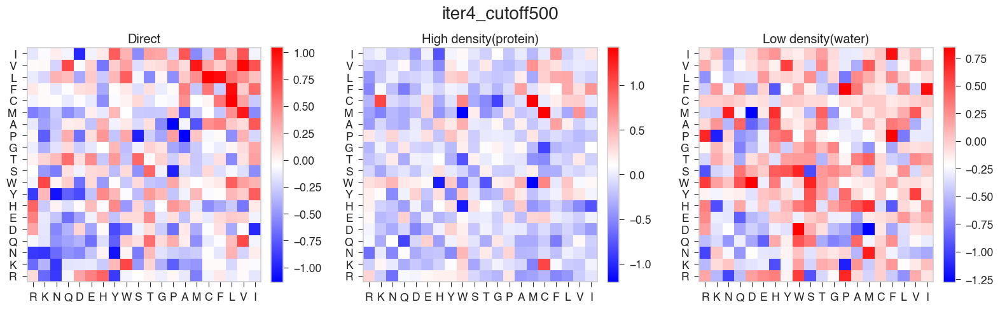

...

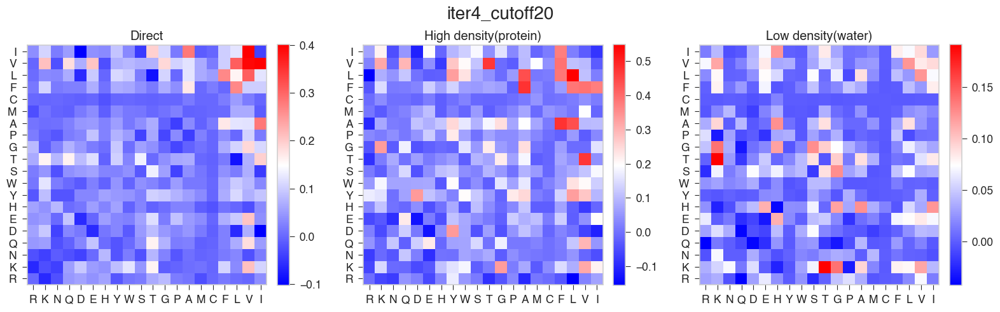

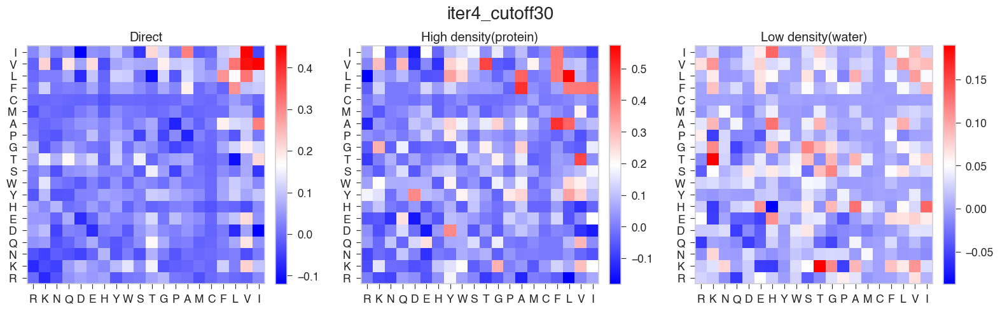

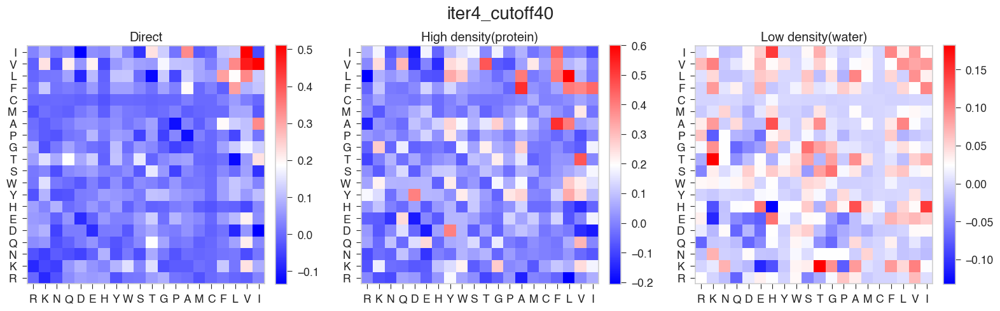

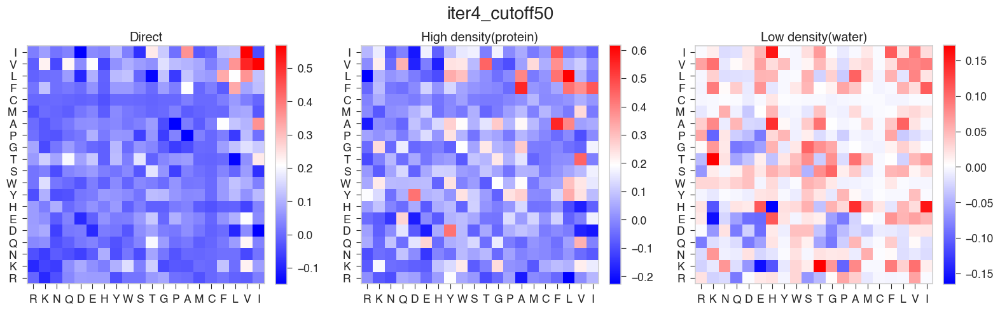

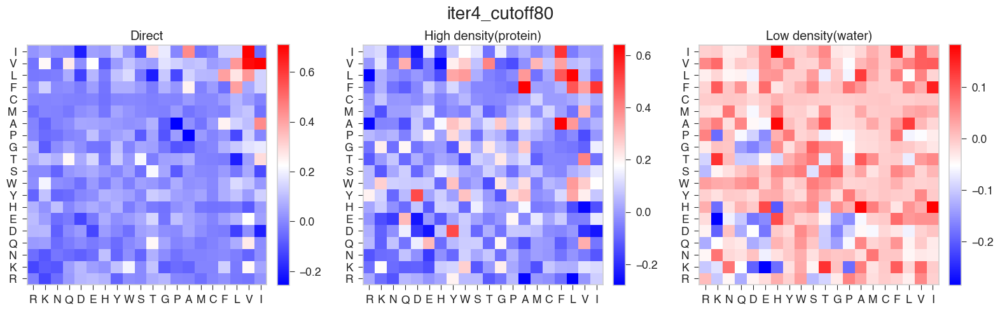

In [182]:
cutoff_list = [100, 200, 300, 400, 500, 600]
cutoff_list += [10, 20, 30, 40, 50, 80]
save_gamma_pre = "/Users/weilu/Research/server/dec_2019/multiDensityOptimization/optimization_iteration1/optimization_iter4/saved_gammas"
trial_name = "iter4"
os.system(f"mkdir -p {save_gamma_pre}/figures")
for cutoff_i in cutoff_list:
    # cutoff_i = 400
    name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff_i}_impose_Aprime_constraint"
    filtered_gamma = np.loadtxt(name)
    figureName = f"{save_gamma_pre}/figures/{trial_name}_cutoff{cutoff_i}"
    title = f"{trial_name}_cutoff{cutoff_i}"
    show_together(filtered_gamma, figureName, title=title)

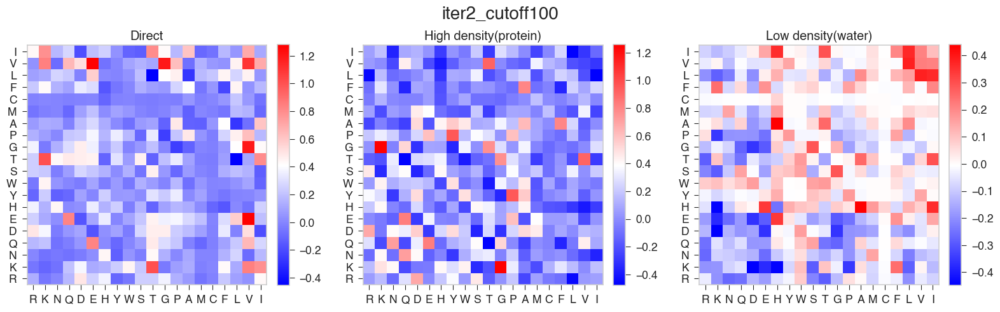

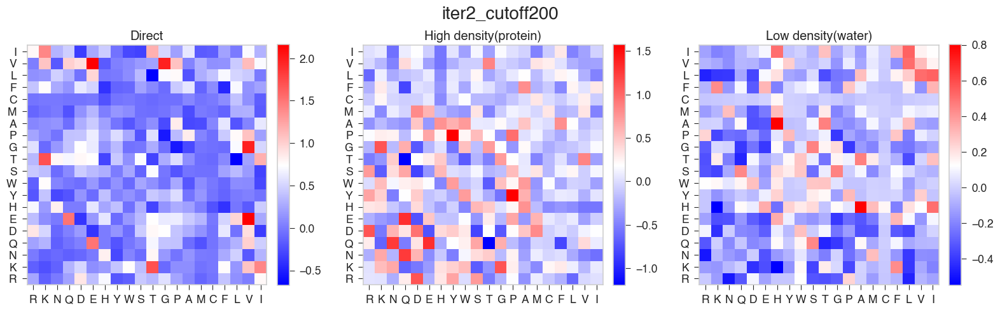

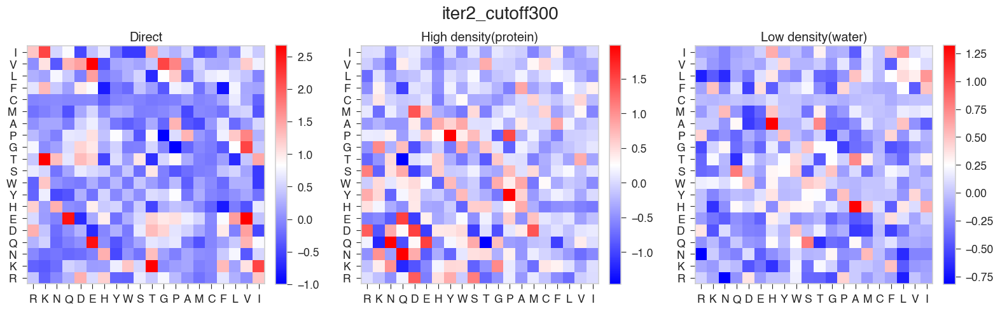

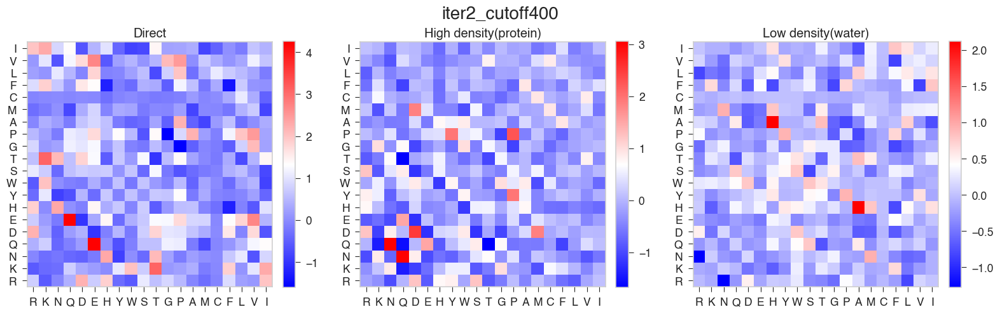

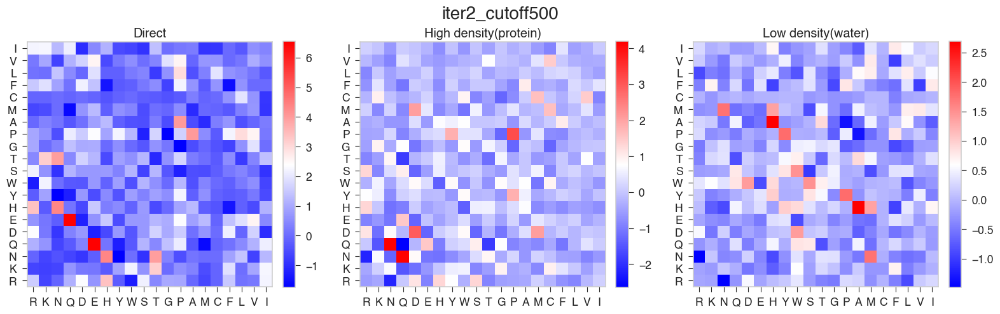

...

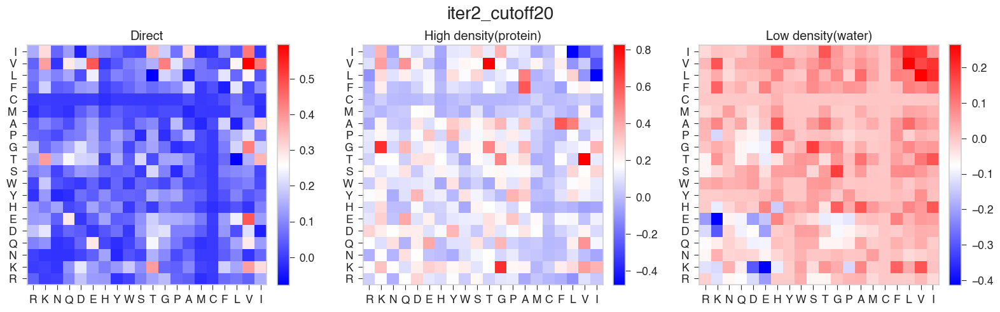

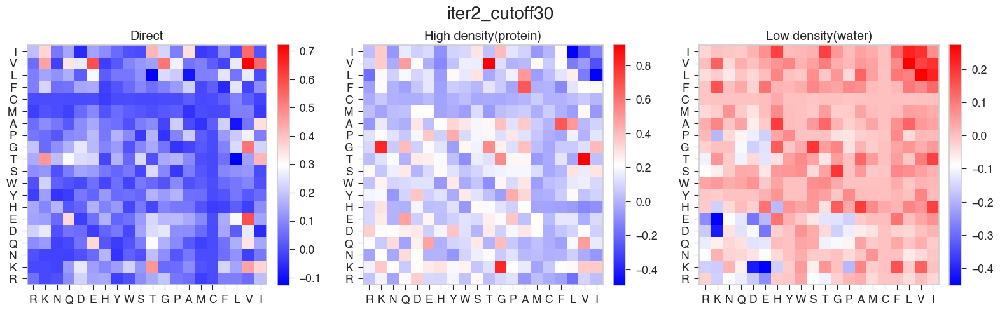

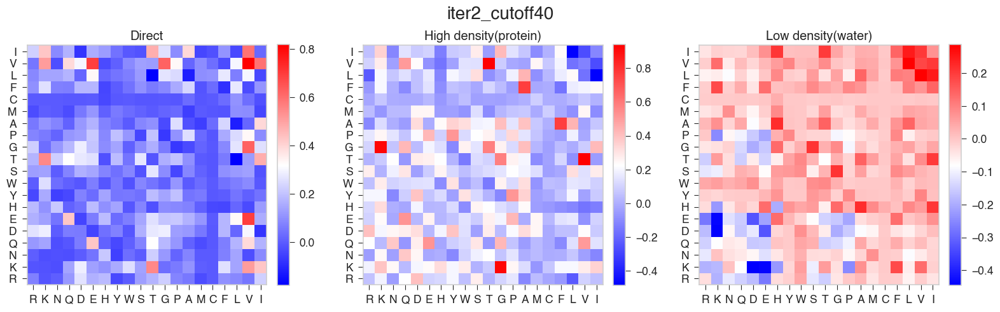

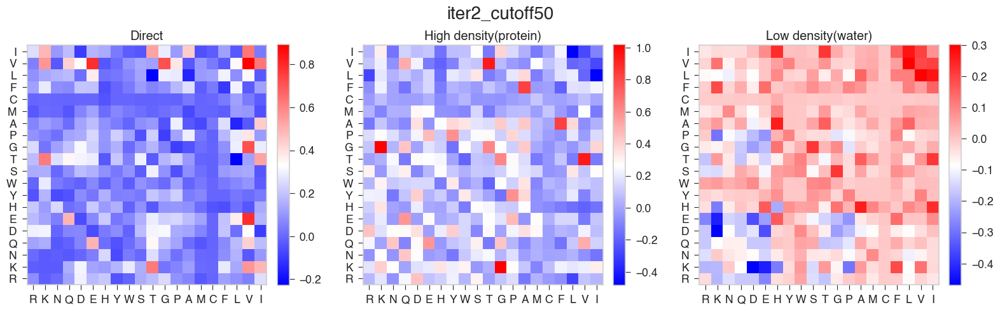

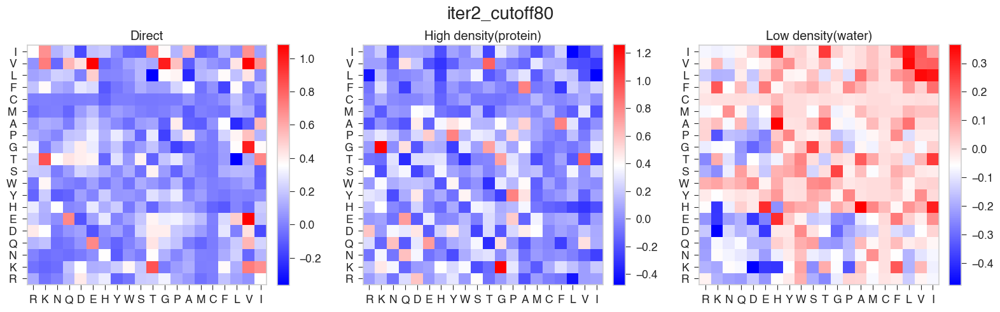

In [151]:
cutoff_list = [100, 200, 300, 400, 500]
cutoff_list += [10, 20, 30, 40, 50, 80]
os.system(f"mkdir -p {save_gamma_pre}/figures")
for cutoff_i in cutoff_list:
    # cutoff_i = 400
    name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff_i}_impose_Aprime_constraint"
    filtered_gamma = np.loadtxt(name)
    figureName = f"{save_gamma_pre}/figures/{trial_name}_cutoff{cutoff_i}"
    title = f"{trial_name}_cutoff{cutoff_i}"
    show_together(filtered_gamma, figureName, title=title)

In [4]:
# pdb list
pre = "/Users/weilu/Research/server/dec_2019/multiDensityOptimization/awsem_contact_term/"
databaseFolder = pre + "database/dompdb/"


In [13]:
pdbFolderList = glob.glob(databaseFolder+"*.pdb")
pdbNames = [a.split("/")[-1].split(".")[0] for a in pdbFolderList]

In [14]:
len(pdbNames)

1825

In [21]:
filtered_pdbNames = []
for pdb in pdbNames:
    if os.path.exists(pre+f"/database/S20_seq/{pdb}.seq"):
        filtered_pdbNames.append(pdb)
    else:
        # print(pdb)
        pass

In [22]:
os.system(f"mkdir -p {pre}/alignments")
for pdb in filtered_pdbNames:
    if os.path.exists(f"/Users/weilu/Research/optimization/mediated_term/multisequenceanddcafrustratometry/{pdb}_filtered_0.05.seqs"):
        # filtered_pdbNames.append(pdb)
        os.system(f"cp /Users/weilu/Research/optimization/mediated_term/multisequenceanddcafrustratometry/{pdb}_filtered_0.05.seqs {pre}/alignments/")
    else:
        print(pdb)
        # pass

In [23]:
with open(f"{pre}/protein_list", "w") as out:
    for pdb in filtered_pdbNames:
        out.write(pdb+"\n")

In [24]:
# information about alignments
info = []
for pdb in filtered_pdbNames:
    name = pdb
    with open(f"{pre}/alignments/{name}_filtered_0.05.seqs") as f:
        a = f.readlines()
    info.append([pdb, len(a)])

In [3]:
pre = "/Users/weilu/Research/server/dec_2019/multiDensityOptimization/awsem_contact_term/gammas/"
trial_name = "trial_1_multiseq"

In [4]:
pp = f"protein_list_phi_pairwise_contact_well4.5_6.5_5.0_10phi_density_mediated_contact_well6.5_9.5_5.0_10_2.6_7.0phi_burial_well4.0"
# pp = f"protein_list_phi_pairwise_contact_well4.5_6.5_5.0_10phi_density_mediated_contact_well6.5_9.5_5.0_10_2.6_7.0phi_burial_well4.0phi_debye_huckel_well0"


In [87]:
gamma_file_name = "/Users/weilu/opt/parameters/original_gamma"
original_gamma = np.loadtxt(gamma_file_name)
# a = list(original_gamma)
# a.append(1)
# original_gamma_deybe = np.array(a)
# we want to impose additional contraint so that A' * gamma = constnat.(-562.23)
cutoff_list = [100, 200, 300, 400, 500, 600]
cutoff_list += [10, 20, 30, 40, 50, 80]
for cutoff_i in cutoff_list:
    A, A_prime, filtered_gamma, filtered_B_inv = get_filtered_gamma(pre, cutoff_i, pp)
    c = np.dot(A_prime, original_gamma)
#     c = np.dot(A_prime, original_gamma)
    B_inv = filtered_B_inv
    lambda_2 = (A_prime.dot(B_inv).dot(A) - c) / (A_prime.dot(B_inv).dot(A_prime) )
    gamma_new = B_inv.dot(A-A_prime*lambda_2)
    # impose A'gamma
    save_gamma_pre = "/Users/weilu/Research/server/dec_2019/saved_gammas/"
    name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff_i}_impose_Aprime_constraint"
    np.savetxt(name, gamma_new)
    cmd = f"convert_to_simulation_format.py {name} {save_gamma_pre}/Dec11_{trial_name}_cutoff{cutoff_i}_impose_Aprime_constraint"
    os.system(cmd)

NameError: name 'do' is not defined

In [50]:
def plot_contact_all(gammas, ax, invert_sign=True, fix_colorbar=True, inferBound=False,
                        vmin=-0.3, vmax=0.3, fix_confidence_colorbar=True, confidence_vmin=0,
                        confidence_vmax=1.0, plot_confidence=False, confidence_lower=None, confidence_upper=None):
    size = 20
    interaction_matrix = np.zeros((size, size))
    i_content = 0
    for i in range(size):
        for j in range(i, size):
            index1 = hydrophobicity_map[inverse_res_type_map[i]]
            index2 = hydrophobicity_map[inverse_res_type_map[j]]
            interaction_matrix[index1][index2] = gammas[i_content]
            interaction_matrix[index2][index1] = gammas[i_content]
            i_content += 1

    # The minus sign is here to be consistent with the way AWSEM thinks about gammas
    if invert_sign:
        interaction_matrix *= -1

    if inferBound:
        vmin = np.min(interaction_matrix)
        vmax = np.max(interaction_matrix)

    if fix_colorbar:
        cax = ax.pcolor(interaction_matrix, vmin=vmin,
                        vmax=vmax, cmap="bwr")
    else:
        cax = ax.pcolor(interaction_matrix, cmap="RdBu_r")
    # fig.colorbar(cax)
    plt.colorbar(cax,fraction=0.046, pad=0.04)
    # put the major ticks at the middle of each cell
    ax.set_yticks(np.arange(interaction_matrix.shape[0]) + 0.5, minor=False)
    ax.set_xticks(np.arange(interaction_matrix.shape[1]) + 0.5, minor=False)

    ax.set_xticklabels(hydrophobicity_letters)
    ax.set_yticklabels(hydrophobicity_letters)

    # plt.savefig('direct_contact.pdf')
    # plt.show()


In [83]:
def show_together(filtered_gamma, figureName, title="test"):
    fig = plt.figure()
    ax1=plt.subplot(1, 3, 1)
    ax1.set_aspect('equal')
    plot_contact_all(filtered_gamma[:210], ax1, inferBound=True)
    ax2=plt.subplot(1, 3, 2)
    ax2.set_aspect('equal')
    plot_contact_all(filtered_gamma[210:420], ax2, inferBound=True)
    ax3=plt.subplot(1, 3, 3)
    ax3.set_aspect('equal')
    plot_contact_all(filtered_gamma[420:], ax3, inferBound=True)
    ax1.title.set_text('Direct')
    ax2.title.set_text('High density(protein)')
    ax3.title.set_text('Low density(water)')
    fig.suptitle(title, fontsize=20, y=0.75)
    fig.tight_layout()
    plt.savefig(figureName)

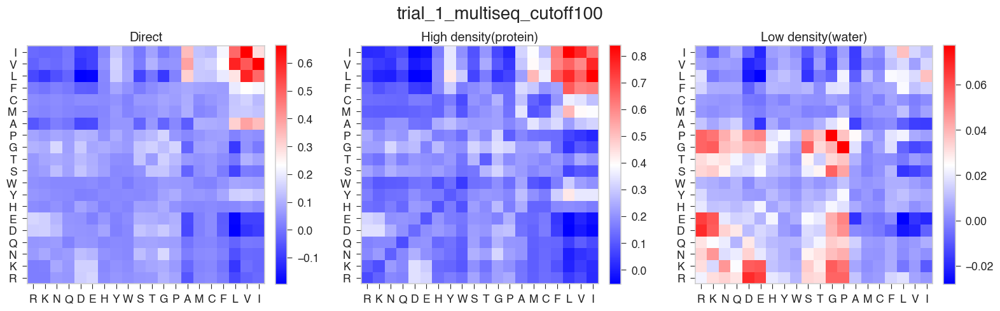

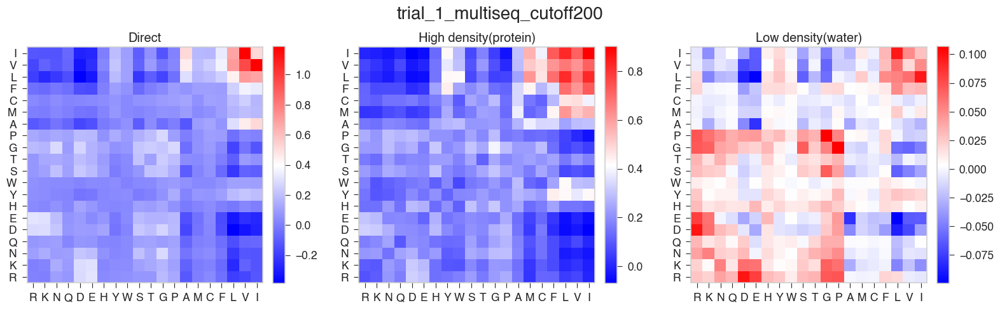

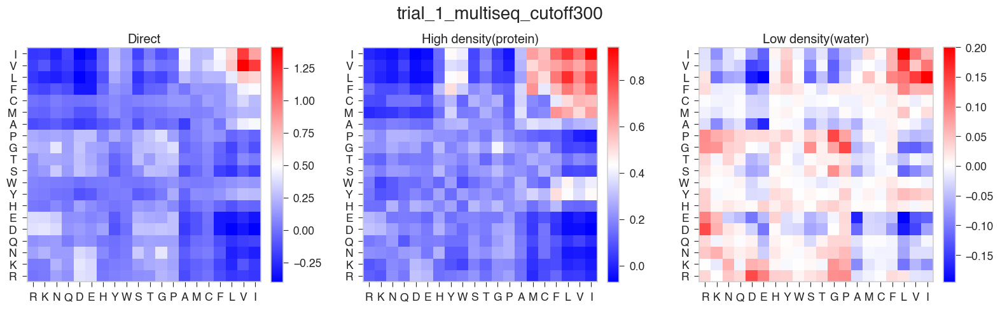

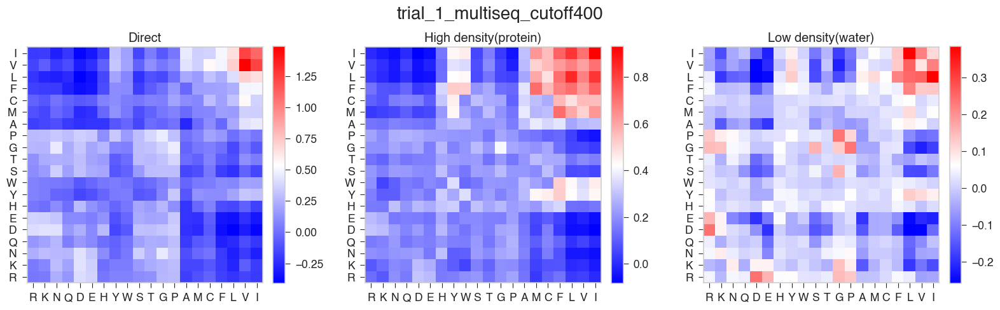

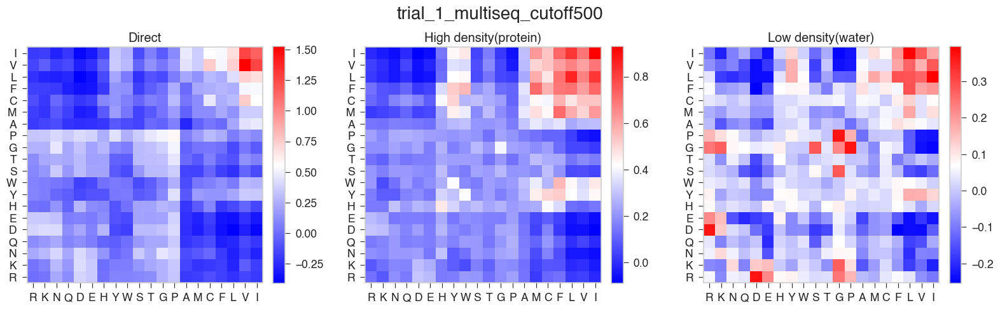

...

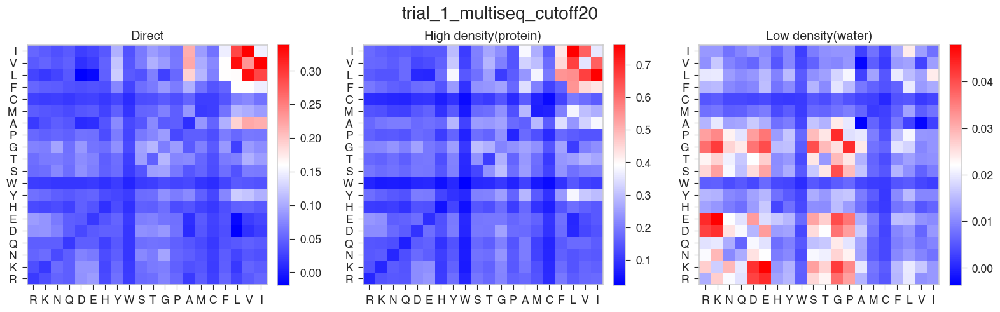

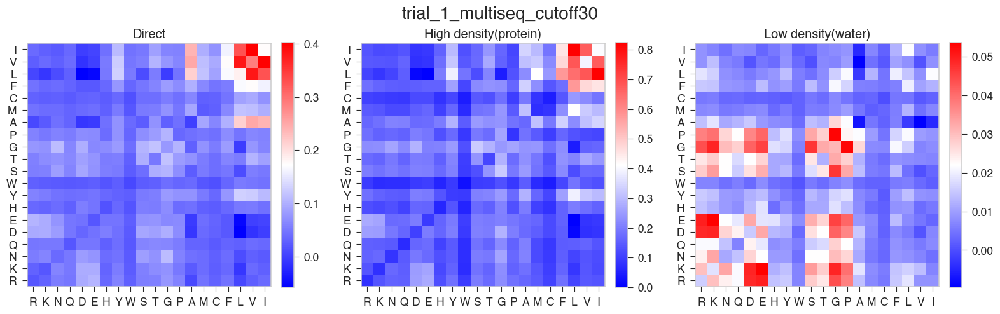

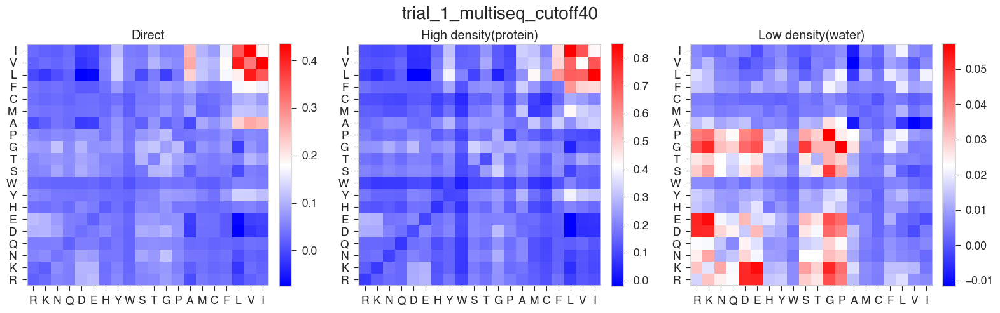

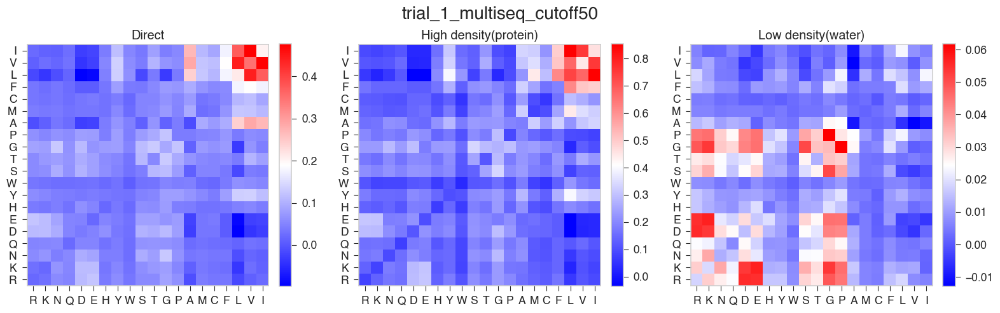

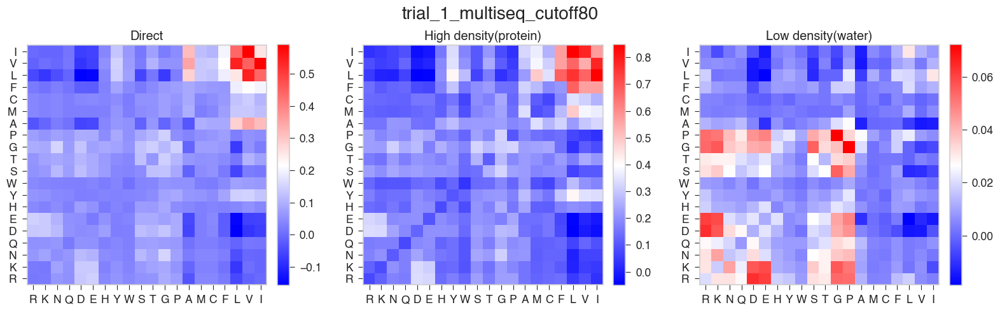

In [88]:
cutoff_list = [100, 200, 300, 400, 500, 600]
cutoff_list += [10, 20, 30, 40, 50, 80]
for cutoff_i in cutoff_list:
    # cutoff_i = 400
    name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff_i}_impose_Aprime_constraint"
    filtered_gamma = np.loadtxt(name)
    figureName = f"/Users/weilu/Research/server/dec_2019/saved_gammas/figures/{trial_name}_cutoff{cutoff_i}"
    title = f"{trial_name}_cutoff{cutoff_i}"
    show_together(filtered_gamma, figureName, title=title)

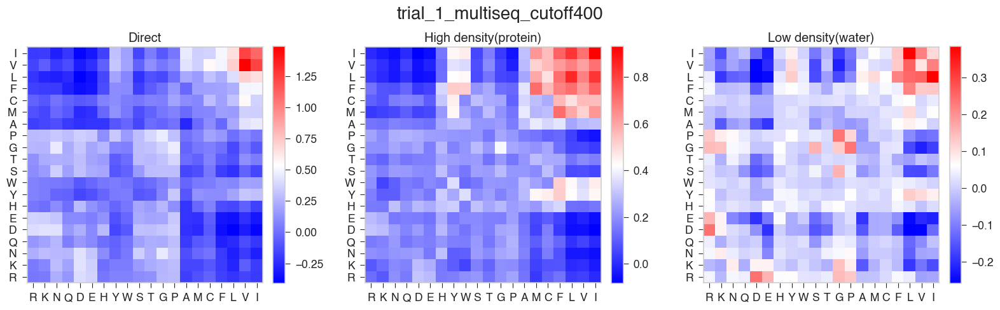

In [80]:
# fig, ax = plt.subplots(nrows=3, ncols=1)
cutoff_i = 400
name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff_i}_impose_Aprime_constraint"
filtered_gamma = np.loadtxt(name)

fig = plt.figure()
ax1=plt.subplot(1, 3, 1)
ax1.set_aspect('equal')
plot_contact_all(filtered_gamma[:210], ax1, inferBound=True)
ax2=plt.subplot(1, 3, 2)
ax2.set_aspect('equal')
plot_contact_all(filtered_gamma[210:420], ax2, inferBound=True)
ax3=plt.subplot(1, 3, 3)
ax3.set_aspect('equal')
plot_contact_all(filtered_gamma[420:], ax3, inferBound=True)
ax1.title.set_text('Direct')
ax2.title.set_text('High density(protein)')
ax3.title.set_text('Low density(water)')
fig.suptitle(f"{trial_name}_cutoff{cutoff_i}", fontsize=20, y=0.75)
fig.tight_layout()
# fig.tight_layout(rect=[0, 0.03, 1, 0.95])
# fig.subplots_adjust(top=0.98)
# plt.savefig(f"/Users/weilu/Research/server/dec_2019/saved_gammas/figures/{trial_name}_cutoff{cutoff_i}")

In [202]:
a = pd.read_csv("/Users/weilu/Research/server/dec_2019/iterative_optimization/original_pdbs/Final_2Sm.csv")

In [203]:
a = a.query("Class == 'α'")

In [204]:
pdb_list = []
for pdb in a.PDB.unique():
    pdb = str(pdb)
    if "(" in pdb:
        pass
    elif pdb == "nan":
        pass
    else:
        pdb_list.append(pdb)

In [205]:
len(pdb_list)

12

In [206]:
second_test_test = a.query("PDB in @pdb_list").reset_index(drop=True).iloc[:, :23]

In [207]:
second_test_test.to_csv("/Users/weilu/Research/server/dec_2019/iterative_optimization/original_pdbs/second_test_set.csv")

In [208]:
second_test_test.PDB.str.lower().to_list()

['1ba5',
 '1fex',
 '1idy',
 '1imq',
 '1ryk',
 '1st7',
 '1w4e',
 '1w4j',
 '1yyj',
 '2a3d',
 '2wxc',
 '2wqg']

In [ ]:
# randomly select 20 out
randomly_selected = random.sample(pdb_list, 20)

In [128]:
first_test_test = a.query("PDB in @randomly_selected").reset_index(drop=True).iloc[:, :23]

In [129]:
first_test_test.to_csv("/Users/weilu/Research/server/dec_2019/iterative_optimization/original_pdbs/first_test_set.csv")

In [137]:
d = pd.read_csv("/Users/weilu/Research/server/dec_2019/iterative_optimization/original_pdbs/first_test_set.csv", index_col=0)

In [142]:
d.PDB.str.lower().to_list()

['1fex',
 '1st7',
 '1w4e',
 '2wqg',
 '1d6o',
 '1e0g',
 '1hdn',
 '1j5u',
 '1n88',
 '2ga5',
 '1c8c',
 '1k0s',
 '1g6p',
 '1e0m',
 '1hcd',
 '1jo8',
 '1mjc',
 '2jmc',
 '3o4d',
 '2l6r']

In [111]:
len(randomly_selected)

20

In [139]:
len(a)

180

In [145]:
d.sort_values("Lpdb")

,No.,Protein short name,PDB,Class,Fold,Lpdb,L,pH,Temp (°C),Folding type,...,ln(ku),ln(ku) (25°C),Unnamed: 15,βT,pH.1,Temp (°C).1,Folding type.1,ln(kf),Unnamed: 21,Comment
13,59,Prototype WW domain [40],1E0M,β,WW domain-based designs,37.0,38.0,7.0,25.0,2S,...,7.1,NaN,NaN,0.64,—,—,—,—,NaN,NaN
2,17,PSBD (Bacillus stearothermophilus) [12],1W4E,α,Peripheral subunit-binding domain of 2-oxo aci...,45.0,45.0,5.5,25.0,2S,...,3.0,NaN,NaN,0.65,7.9\n NA,41\n NA,—,9.69\n NA,NaN,"We have adopted the data from reference (12), ..."
5,33,LysM domain [26],1E0G,α+β,LysM domain,48.0,64.0,7.0,10.5,2S,...,2.2,3.5,3.3,0.69,—,—,—,—,NaN,NaN
3,23,SAP domain of THO1 [20],2WQG,α,LEM/SAP HeH motif,51.0,51.0,6.0,20.0,2S,...,4.1,4.6,4.6,0.67,NaN,NaN,NaN,NaN,NaN,NaN
15,61,Abp1 SH3 [5],1JO8,β,SH3-like barrel,58.0,68.0,7.0,25.0,2S,...,-2.7,NaN,NaN,0.88,—,—,—,—,NaN,There is some evidence for the presence of a f...
0,6,RAP1 (Human) [2],1FEX,α,DNA/RNA-binding 3-helical bundle,59.0,59.0,5.7,25.0,2S,...,2.9,NaN,NaN,0.82,—,—,—,—,NaN,NaN
19,88,gpW [69],2L6R,β,gpW/XkdW-like,62.0,62.0,6.0,37.0,2S,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"The protein is a downhill folder, which shows ..."
10,50,Sso7d [35],1C8C,β,SH3-like barrel,64.0,64.0,6.1,20.0,2S,...,-3.2,-2.6,-2.6,0.63,—,—,—,—,NaN,NaN
12,57,Cold shock-like protein (Thermotoga maritima) ...,1G6P,β,OB-fold,66.0,68.0,7.0,25.0,2S,...,-4.0,NaN,NaN,0.86,—,—,—,—,NaN,NaN
16,67,CspA [47],1MJC,β,OB-fold,69.0,69.0,7.0,25.0,2S,...,1.4,NaN,NaN,0.94,—,—,—,—,NaN,NaN
